In [1]:
import glob
import os
from multiprocessing import Pool
import shutil
from pathlib import Path

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

In [19]:
output_path = Path("outputs")
output_path.mkdir(exist_ok=True)

In [2]:
import neuron_morphology

In [3]:
neuron_morphology.__version__

'1.1.3'

In [4]:
# Morphology visualization imports
from neuron_morphology.swc_io import morphology_from_swc
from neuron_morphology.constants import AXON, BASAL_DENDRITE, SOMA

In [5]:
# Morphology feature extraction imports
from neuron_morphology.feature_extractor.data import Data
from neuron_morphology.feature_extractor.feature_extractor import FeatureExtractor
from neuron_morphology.feature_extractor.utilities import unnest
from neuron_morphology.features.default_features import default_features

In [6]:
swc_files = glob.glob('/external/rprshnas01/external_data/aibs/AIBS_patchseq_2020/mouse/morphology/download.brainlib.org+8811/biccn/zeng/pseq/morph/200526/*_transformed.swc')

In [7]:
len(swc_files)

538

### fMOST method for generating 2D images

/tmp/ipykernel_22053/3864930889.py:12: FutureWarning: Using short name for 'orient' is deprecated. Only the options: ('dict', list, 'series', 'split', 'records', 'index') will be used in a future version. Use one of the above to silence this warning.
  nodes = swc_data.to_dict('record')


Text(0.5, 1.0, 'z-y view')

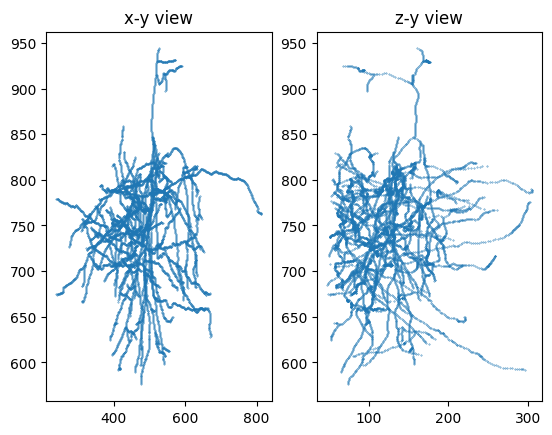

In [8]:
import neuron_morphology.swc_io as swcio
from neuron_morphology.morphology import Morphology
from neuron_morphology.swc_io import morphology_from_swc
from neuron_morphology.feature_extractor.data import Data
from neuron_morphology.feature_extractor.feature_extractor import FeatureExtractor
from neuron_morphology.features.default_features import default_features
from neuron_morphology.constants import (
    SOMA, AXON, BASAL_DENDRITE, APICAL_DENDRITE
)

def prepare_neuron_tree(swc_data):
    nodes = swc_data.to_dict('record')

    replace_type = 2 # default node type
    for node in nodes:
        node['parent'] = int(node['parent'])
        node['id'] = int(node['id'])
        node['type'] = int(node['type'])

        if node['parent'] == -1 and node['type'] != 1:
            replace_type = node['type']

        if node['type'] == 1 and node['parent'] != -1:
            node['type'] = replace_type

    soma_list = []
    for node in nodes:
        if node['type'] == 1:
            soma_list.append(node)

    # create a new soma point
    if len(soma_list) > 1:
        x = 0
        y = 0
        z = 0
        n = len(soma_list)
        for node in soma_list:
            x += node['x']
            y += node['y']
            z += node['z']

        soma = copy.deepcopy(soma_list[0])
        soma['id'] = nodes[-1]['id']
        soma['x'] = x/n
        soma['y'] = y/n
        soma['z'] = z/n
        nodes.append(soma)

        for node in soma_list:
            node['parent'] = soma['id']
            node['type'] = replace_type
    
    return nodes

# load single file
swc_data = swcio.read_swc(swc_files[0])

nodes = prepare_neuron_tree(swc_data)
test_data = Data(Morphology(nodes, node_id_cb=lambda node: node['id'], parent_id_cb=lambda node: node['parent']))

# visualize
x = [node['x'] for node in nodes]
y = [node['y'] for node in nodes]
z = [node['z'] for node in nodes]

fig, ax = plt.subplots(1, 2)
ax[0].scatter(x, y, s=0.1)
ax[0].set_title('x-y view')
ax[1].scatter(z, y, s=0.1)
ax[1].set_title('z-y view')

### Plotting method

In [9]:
def plot_morphology(file):#, output_path):
    morph = morphology_from_swc(file)
    
    axon_nodes = morph.get_node_by_types([AXON])
    dend_nodes = morph.get_node_by_types([BASAL_DENDRITE])
    soma_nodes = morph.get_node_by_types([SOMA])

    axon_x = [node['x'] for node in axon_nodes]
    axon_y = [node['y'] for node in axon_nodes]

    dend_x = [node['x'] for node in dend_nodes]
    dend_y = [node['y'] for node in dend_nodes]

    soma_x = [node['x'] for node in soma_nodes]
    soma_y = [node['y'] for node in soma_nodes]


    plt.figure(figsize=(10, 10))

    plt.scatter(axon_x, axon_y, s=1, edgecolor="none")
    plt.scatter(dend_x, dend_y, s=1, edgecolor="none")
    plt.scatter(soma_x, soma_y, s=20, c="black", edgecolor="none")


    plt.gca().set(xticks=[], yticks=[])
    plt.gca().set_aspect("equal")
    sns.despine(left=True, bottom=True)

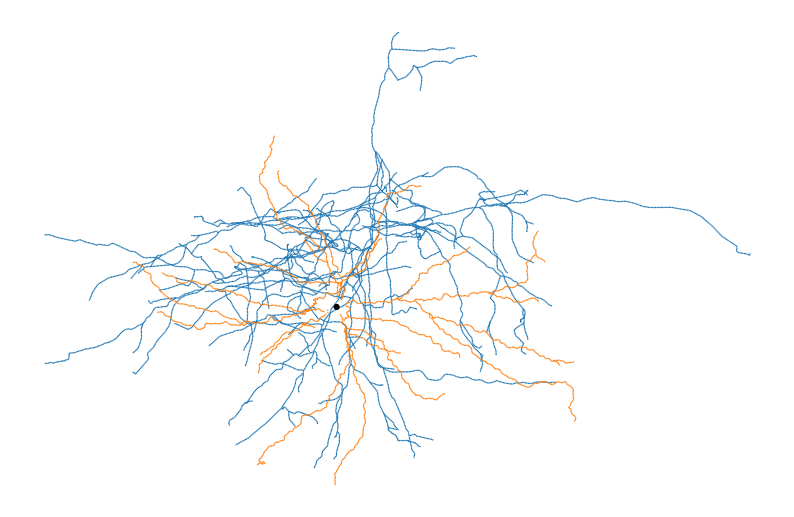

In [10]:
plot_morphology(swc_files[0])

In [11]:
# Feature Extractor (result from working cell)
fe = FeatureExtractor()
fe.register_features(default_features)
feature_extraction_run = fe.extract(test_data)
feature_extraction_run.results

2023-11-09 15:02:31,252 root         INFO     skipping mark (validation failed): type
2023-11-09 15:02:31,255 root         INFO     skipping mark (validation failed): type
2023-11-09 15:02:31,263 root         INFO     skipping mark (validation failed): type
2023-11-09 15:02:31,263 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8ebeee0>>
2023-11-09 15:02:31,264 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:02:31,264 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:02:31,265 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:02:31,265 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:02:31,284 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:02:31,285 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:02:31,285 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

{'axon.tip.dimension': {'width': 573.936025224849,
  'height': 354.4621196921007,
  'depth': 256.4568257448361,
  'min_xyz': array([-237.34798152, -130.91821653,  -55.57061144]),
  'max_xyz': array([336.5880437 , 223.54390317, 200.8862143 ]),
  'bias_xyz': array([ 99.24006218,  92.62568664, 145.31560286])},
 'all_neurites.tip.dimension': {'width': 573.936025224849,
  'height': 368.10942770632425,
  'depth': 256.4568257448361,
  'min_xyz': array([-237.34798152, -144.56552454,  -55.57061144]),
  'max_xyz': array([336.5880437 , 223.54390317, 200.8862143 ]),
  'bias_xyz': array([ 99.24006218,  78.97837863, 145.31560286])},
 'dendrite.tip.dimension': {'width': 359.34512160796044,
  'height': 283.60520296192567,
  'depth': 247.79035281863344,
  'min_xyz': array([-165.40311823, -144.56552454,  -47.61984222]),
  'max_xyz': array([193.94200337, 139.03967842, 200.1705106 ]),
  'bias_xyz': array([ 28.53888514,  -5.52584612, 152.55066838])},
 'basal_dendrite.tip.dimension': {'width': 359.345121607

In [12]:
def flatten_features(fd):
    fd_flat = {}
    for k, v in fd.items():
        if type(v) == dict:
            for vk, vv in v.items():
                subkey = k + "_" + vk
                if type(vv) == np.ndarray:
                    fd_flat[subkey + "_x"] = vv[0]
                    fd_flat[subkey + "_y"] = vv[1]
                    fd_flat[subkey + "_z"] = vv[2]
                else:
                    fd_flat[subkey] = vv
        else:
            fd_flat[k] = v
    return fd_flat

def extract_features(file):
    morph = morphology_from_swc(file)
    
    fe = FeatureExtractor()
    fe.register_features(default_features)

    feature_extraction_run = fe.extract(Data(morph))
    return flatten_features(dict(feature_extraction_run.results))

def process_features(file):
    name = os.path.basename(file)[:9]
    print(f"Collecting features from Cell {name}.\n")
    try:
        features = extract_features(file)
        return name, features
    except:
        return name, None
    
def collect_morph_features(files, chunksize):
    feature_dict = {}
    fail_count = 0
    fail_cells = []
    with Pool() as p:
        for name, features in p.imap_unordered(process_features, files, chunksize=chunksize):
            if features:
                feature_dict[name] = features
            else:
                fail_count += 1
                fail_cells.append(name)
    df = pd.DataFrame.from_dict(feature_dict, orient="index")
   
    print(f"Collected morphology features from {len(files) - fail_count} cells.")
    print(f"Failed cells: {fail_cells}")
    
    return df



In [55]:
features = extract_features("/external/rprshnas01/external_data/aibs/AIBS_patchseq_2020/mouse/morphology/download.brainlib.org+8811/biccn/zeng/pseq/morph/200526/713132614_transformed.swc")

2023-11-09 16:29:19,485 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:19,488 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:19,497 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:19,498 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be19be610>>
2023-11-09 16:29:19,498 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:19,499 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:19,499 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:19,500 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:29:19,525 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:19,526 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:19,526 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

ZeroDivisionError: division by zero

In [16]:
morph_feats = collect_morph_features(swc_files, chunksize=6)

2023-11-09 15:53:36,752 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:36,756 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:36,764 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:36,765 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfedc1310>>
2023-11-09 15:53:36,766 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,767 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,767 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,768 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:53:36,795 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:36,795 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:36,796 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:53:36,826 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:36,826 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:36,826 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:36,827 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:36,827 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:36,828 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 15:53:36,841 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,842 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,842 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,843 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,843 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,844 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,844 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,845 root         INFO     s

2023-11-09 15:53:36,860 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,860 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:36,861 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,861 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:36,861 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,861 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPoint

2023-11-09 15:53:36,870 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:36,870 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:36,871 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:36,871 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:36,872 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15

2023-11-09 15:53:36,929 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,930 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8895700>>
2023-11-09 15:53:36,930 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:36,931 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:36,931 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:36,931 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-

2023-11-09 15:53:36,951 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,951 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,951 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,951 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,952 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,952 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,953 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,953 root         INFO     skipping 

2023-11-09 15:53:36,963 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:36,964 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:36,965 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,963 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,965 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,965 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8927f70>>
2023-11-09 15:53:36,965 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,965 root         INFO     skipping featu

2023-11-09 15:53:36,970 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,970 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,970 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,970 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:36,970 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,971 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,971 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,971 root         INFO     skipping feature: apical_dendrite.bifurcation.dimensi

2023-11-09 15:53:36,979 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,979 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,979 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,979 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,979 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3ccf0a0>>
2023-11-09 15:53:36,979 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,979 root         INFO     skipping feature: apical_dendrite.total_volume. Fou

2023-11-09 15:53:36,985 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,985 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:36,986 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,986 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,986 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,986 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,986 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_di

2023-11-09 15:53:36,993 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:36,993 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:36,993 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,993 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,993 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,994 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLa

2023-11-09 15:53:36,999 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:36,999 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:36,999 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:36,999 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:36,998 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:36,999 root         INFO     skipping feature: apical_dendrite.bifurcation.d

2023-11-09 15:53:37,016 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,015 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,016 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,016 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,016 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_de

2023-11-09 15:53:37,021 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,021 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:37,020 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,022 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,022 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,021 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,022 root         INFO     skip

2023-11-09 15:53:37,027 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,027 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,027 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,027 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,027 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,027 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerD

2023-11-09 15:53:37,031 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:37,031 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:37,031 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,031 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:37,023 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,031 

2023-11-09 15:53:37,034 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:37,034 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', '

2023-11-09 15:53:37,036 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:37,036 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,036 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:37,036 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,023 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,023 root         INFO     skipping mark (validati

2023-11-09 15:53:37,039 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,040 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:37,040 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,040 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,040 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,034 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,040 root         INFO     skipping feature: 

2023-11-09 15:53:37,049 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,050 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:37,050 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,040 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,051 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,051 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,051 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['Require

2023-11-09 15:53:37,058 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:37,058 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,058 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,058 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:37,059 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,059 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023

2023-11-09 15:53:37,064 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,065 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8895700>>
2023-11-09 15:53:37,065 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,065 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,065 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,066 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,062 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. 

2023-11-09 15:53:37,073 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:37,069 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,074 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,074 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:37,074 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,075 root         INFO     skipping feature: axon.normaliz

2023-11-09 15:53:37,087 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,087 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,087 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,087 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:37,088 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,072 root         INFO     skipping feature: apical_dendrite.apical_dend

2023-11-09 15:53:37,094 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,094 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,081 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8895700>>
2023-11-09 15:53:37,094 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,095 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,095 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,095 root         INFO     skip

2023-11-09 15:53:37,111 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 15:53:37,123 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,123 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,123 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,124 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,124 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,121 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLaye

2023-11-09 15:53:37,136 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,137 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:37,137 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes

2023-11-09 15:53:37,162 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:53:37,163 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,164 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes

2023-11-09 15:53:37,379 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,391 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,404 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,416 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,428 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:37,440 root         INFO     skip

2023-11-09 15:53:37,594 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:37,619 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,626 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:37,634 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimensi

2023-11-09 15:53:38,196 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:38,197 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:38,198 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:38,199 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:38,200 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:38,201 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogra

2023-11-09 15:53:38,208 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:38,210 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:38,227 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:38,228 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:38,229 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'Require

2023-11-09 15:53:38,478 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:53:38,479 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:53:38,480 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:53:38,481 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:53:38,482 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:38,482 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:53:38,483 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:38,513 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:38,514 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:38,515 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:38,536 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:38,537 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:38,563 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:38,564 root       

2023-11-09 15:53:38,574 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:38,576 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:38,577 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:38,578 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:38,579 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:38,580 root         INF

2023-11-09 15:53:38,583 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:38,591 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:38,592 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:38,593 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:38,606 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDep

2023-11-09 15:53:38,780 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:53:38,783 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:53:38,785 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:53:38,785 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:53:38,787 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:53:38,787 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:53:38,794 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:53:38,795 ro

2023-11-09 15:53:38,893 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:38,897 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:38,897 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:38,900 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:38,901 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:38,902 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found e

2023-11-09 15:53:38,960 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:38,986 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:39,011 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:39,013 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:39,015 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:39,028 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_dista

2023-11-09 15:53:39,163 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:53:39,165 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']


/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
2023-11-09 15:53:39,166 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:53:39,180 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:53:39,181 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:53:39,187 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:53:39,189 root         INFO     skipping feature: apical_dendr

2023-11-09 15:53:39,391 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:53:39,391 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:39,414 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']


2023-11-09 15:53:39,412 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:53:39,413 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:53:39,415 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:39,419 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:39,430 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:39,431 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:39,432 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:39,417 root    

2023-11-09 15:53:39,564 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:39,565 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:39,571 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:39,574 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:39,583 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15

2023-11-09 15:53:40,265 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:53:40,274 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:53:40,288 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:40,303 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:40,311 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 15:53:40,307 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:53:40,323 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:40,333 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:40,335 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:40,338 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:40,340 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:40,342 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:40,344 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:40,346 root         IN

2023-11-09 15:53:40,372 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:53:40,388 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:40,394 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:40,419 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:40,454 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:40,445 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:40,456 root         INFO     skipping mark (validation failed): t

2023-11-09 15:53:40,651 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:40,666 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:40,670 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:40,684 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:40,699 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:4

2023-11-09 15:53:40,812 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:40,816 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:40,821 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:40,825 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:40,829 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:40,83

2023-11-09 15:53:42,038 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:53:42,147 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:42,152 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:42,158 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:42,162 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac5ce4160>>
2023-11-09 15:53:42,166 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:42,170 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:42,174 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:42,178 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:53:42,331 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:53:42,332 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:53:42,333 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:53:42,322 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:42,334 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:42,336 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:42,338 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['Req

2023-11-09 15:53:42,335 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:42,347 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:42,348 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:42,345 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:42,349 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:42,365 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_

2023-11-09 15:53:42,459 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:42,473 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:42,489 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:42,499 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:42,514 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDep

2023-11-09 15:53:42,891 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
2023-11-09 15:53:42,899 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  sk = skew(a, axis, bias=bias)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cance

2023-11-09 15:53:43,532 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:43,541 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:43,563 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:43,567 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06ac0>>
2023-11-09 15:53:43,568 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:43,568 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:43,569 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:43,570 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:53:43,656 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:43,680 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:43,681 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:43,687 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:43,691 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:43,692 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:43,694 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:43,700 root       

2023-11-09 15:53:43,734 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:43,744 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:53:43,758 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:43,759 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:43,762 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:43,765 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:43,773 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:43,781 root         INFO     

2023-11-09 15:53:43,892 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:53:43,893 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:43,894 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:53:43,896 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:43,898 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:43,899 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:53:43,901 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:53:43,903 ro

2023-11-09 15:53:43,983 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:43,985 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:43,987 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:43,989 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:43,991 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimensi

2023-11-09 15:53:44,043 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,051 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,055 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:53:44,056 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,059 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,060 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,061 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,062 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:44,063 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:44,064 root         INFO     skipping feature: all_neur

2023-11-09 15:53:44,246 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,247 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']


2023-11-09 15:53:44,249 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,258 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,263 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']


2023-11-09 15:53:44,264 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,276 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,279 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,288 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,290 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,293 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,303 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,306 roo

2023-11-09 15:53:44,440 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,442 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,443 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,446 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,447 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,448 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,450 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,451 root         INFO     skipping

2023-11-09 15:53:44,582 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:44,588 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:44,590 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:44,593 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:44,597 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:44,601 root         INFO     

2023-11-09 15:53:44,724 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,726 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,728 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,729 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,731 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,733 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,735 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:44,737 root    

2023-11-09 15:53:45,624 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:45,638 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:45,664 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:45,686 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d069d0>>
2023-11-09 15:53:45,700 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:45,713 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:45,724 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:45,739 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:53:46,088 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']


2023-11-09 15:53:46,097 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:46,102 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:46,107 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:46,111 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:46,132 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:46,155 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'R

2023-11-09 15:53:46,203 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:46,205 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:46,206 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:46,207 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:46,208 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:46,211 r

2023-11-09 15:53:46,220 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:46,221 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:46,214 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:46,224 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:46,223 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 1

2023-11-09 15:53:46,320 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:46,325 root         INFO     selected features: ['apical_dendrite.tip.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'apical_dendrite.bifurcation.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'apical_dendrite.node.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'apical_dendrite.compartment.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'apical_dendrite.num_nodes', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_n

2023-11-09 15:53:46,565 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:46,580 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:46,608 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:46,613 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d069d0>>
2023-11-09 15:53:46,618 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:46,622 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:46,627 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:46,631 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:53:46,739 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:46,740 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:53:46,742 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:53:46,742 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:46,743 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:46,745 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:53:46,752 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:53:46,750 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:46,753 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:53:46,760 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:46,761 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:46,762 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLa

2023-11-09 15:53:46,860 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:46,862 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:46,865 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:46,857 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:46,866 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:46,879 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 15:53:46,982 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:53:47,006 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:53:47,022 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:53:47,026 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:53:47,049 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:47,066 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:47,073 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:47,083 root         INFO  

2023-11-09 15:53:47,894 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:53:48,160 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:53:48,439 root         INFO     skipping mark (validation failed): type


2023-11-09 15:53:48,445 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:48,470 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:48,475 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8724880>>
2023-11-09 15:53:48,479 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:48,482 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:48,487 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:48,494 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:48,500 root         INFO     skipping fea

2023-11-09 15:53:48,585 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:48,584 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:53:48,586 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:53:48,586 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:48,587 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:53:48,589 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:53:48,590 root         INFO     s

2023-11-09 15:53:48,651 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:48,653 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:48,655 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:48,657 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:48,659 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:48,661 root         INFO     skip

2023-11-09 15:53:48,972 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:53:48,986 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:53:48,991 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:53:49,015 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:53:49,039 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:53:49,065 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:53:49,088 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:53:49,112 roo

2023-11-09 15:53:49,267 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:53:49,281 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:49,287 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:49,294 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:49,304 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:49,307 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:49,322 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:53:49,331 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDept

2023-11-09 15:53:49,484 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:53:49,507 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:53:49,508 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:53:49,513 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:53:49,522 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:53:49,531 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:53:49,540 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:53:

2023-11-09 15:53:49,800 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:53:49,802 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:49,803 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:53:49,805 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:53:49,806 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:49,808 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:53:49,809 root         INFO     skipping feature: dendrite.apical_dendrite.ove

2023-11-09 15:53:49,832 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:49,860 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:49,861 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:53:49,882 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:49,885 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:49,886 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:49,887 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:49,888 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:49,889 root         INFO     skippi

2023-11-09 15:53:50,182 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:50,189 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:50,227 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:50,243 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cf7e50>>
2023-11-09 15:53:50,255 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:50,277 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:50,303 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:50,314 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:50,317 roo

2023-11-09 15:53:50,438 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:50,440 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:50,443 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:50,444 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:50,446 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:50,448 root         INF

2023-11-09 15:53:50,680 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:50,688 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:50,704 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:50,712 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:50,728 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:50,736 root         INFO     skip

2023-11-09 15:53:52,119 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:52,124 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:52,136 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:52,138 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cf7d60>>
2023-11-09 15:53:52,148 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:52,150 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:52,152 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:52,154 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:53:52,242 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:52,244 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:52,246 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:53:52,331 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:52,333 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:52,335 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:52,337 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:52,339 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:52,341 root         INFO     skipping feature: apical_dendrite

2023-11-09 15:53:52,951 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:53:53,010 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:53,015 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:53,022 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:53,024 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cf2310>>
2023-11-09 15:53:53,030 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:53,032 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:53,035 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:53,037 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:53:53,126 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:53,128 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:53,130 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:53:53,620 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:53:53,625 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:53:53,628 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:53:53,630 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:53:53,633 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:53:53,635 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:53:53,637 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:53:53,639 roo

2023-11-09 15:53:53,810 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:53,819 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:53,844 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:53,854 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cf7c40>>
2023-11-09 15:53:53,866 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:53,878 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:53,890 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:53,902 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:53:54,298 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:54,300 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:54,302 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:53:55,042 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:53:55,267 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:55,283 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:55,309 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:55,316 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cf7e20>>
2023-11-09 15:53:55,328 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:55,354 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:55,364 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:55,379 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:53:55,733 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:53:55,734 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:53:55,720 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:55,735 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:53:55,736 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:53:55,737 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:53:55,739 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical'

2023-11-09 15:53:55,794 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:55,820 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:55,846 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:55,859 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:53:55,854 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:55,880 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:55,888 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:55,897 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:55,905 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimensi

2023-11-09 15:53:55,999 root         INFO     skipping mark (validation failed): type


2023-11-09 15:53:56,007 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:56,015 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d036d0>>
2023-11-09 15:53:56,016 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:56,021 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:56,025 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:56,027 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:53:56,028 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:5

2023-11-09 15:53:56,338 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:53:56,344 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:53:56,337 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:56,345 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:53:56,352 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:53:56,358 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:56,360 root         INFO     skipping featu

2023-11-09 15:53:56,594 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:56,616 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:56,625 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:56,646 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:56,667 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:53:56,689 root         INFO     sk

2023-11-09 15:53:59,524 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:59,541 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:59,566 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:59,570 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:59,577 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:59,570 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8bc7160>>
2023-11-09 15:53:59,584 root         INFO     skipping mark (validation failed): type
2023-11-09 15:53:59,586 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8724d30>>
2023-11-09 15:53:59,583 root         INFO 

2023-11-09 15:53:59,679 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:59,680 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:53:59,683 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:53:59,686 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:53:59,690 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:53:59,692 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'Requ

2023-11-09 15:54:00,062 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:00,078 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:00,095 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:00,110 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:00,122 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:00,138 root         INFO     skip

2023-11-09 15:54:00,222 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:00,225 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']


2023-11-09 15:54:00,230 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:00,237 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:00,241 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:00,245 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:00,252 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 15:54:00,736 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:00,737 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:00,738 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:00,747 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:00,747 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 15:54:00,748 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:54:00,771 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:54:00,780 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:00,782 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:00,785 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:00,789 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:00,800 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:00,802 root         INFO     sk

2023-11-09 15:54:01,010 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:54:01,012 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:54:01,014 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:54:01,016 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:54:01,018 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:54:01,020 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:54:01,022 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:54:01,024

2023-11-09 15:54:02,391 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:02,393 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:02,413 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cf2370>>
2023-11-09 15:54:02,415 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:02,417 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:02,420 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:02,422 root         INFO     skipp

2023-11-09 15:54:02,711 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:54:02,815 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:54:02,932 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:02,938 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:02,930 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:02,951 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:02,957 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d033a0>>
2023-11-09 15:54:02,959 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:02,960 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:02,961 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:02,952 roo

2023-11-09 15:54:03,050 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']


2023-11-09 15:54:03,053 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:03,043 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:03,055 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:03,057 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:03,057 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:03,060 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_mover

2023-11-09 15:54:03,422 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:03,424 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:03,425 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:03,427 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:03,429 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:03,431 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54

2023-11-09 15:54:03,554 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:54:03,567 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:03,569 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:54:03,574 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:54:03,572 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:03,582 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:54:03,585 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:54:03,593 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:03,590 root       

2023-11-09 15:54:03,717 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:54:03,728 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:54:03,731 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:03,735 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:03,738 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:03,742 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:03,726 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDep

2023-11-09 15:54:03,829 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 15:54:05,155 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:05,159 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:05,166 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:05,167 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cf7e20>>
2023-11-09 15:54:05,168 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:05,169 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:05,170 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:05,173 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:54:05,415 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:05,423 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:54:05,425 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:05,425 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 15:54:05,428 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:54:05,431 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:05,433 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_ti

2023-11-09 15:54:05,541 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:05,548 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:05,564 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:05,567 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0d640>>
2023-11-09 15:54:05,577 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:05,603 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:05,611 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:05,619 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:54:05,686 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:05,687 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:05,689 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:05,690 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:05,691 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:54:05,692 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:54:05,684 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:54:05,694 root         INFO 

2023-11-09 15:54:05,695 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:54:05,696 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:54:05,699 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:54:05,701 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:54:05,702 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:54:05,704 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:54:05,705 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:05,706 root         INFO    

2023-11-09 15:54:05,787 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:05,788 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:05,789 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:05,790 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:05,791 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:05,773 root    

2023-11-09 15:54:05,811 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:05,819 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:05,822 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:05,828 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:05,832 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:05,

2023-11-09 15:54:05,957 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:05,961 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:05,964 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:05,969 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimensi

2023-11-09 15:54:06,319 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:06,322 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:06,331 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06d60>>
2023-11-09 15:54:06,333 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:06,335 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:06,339 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:06,344 root         INFO     skipp

2023-11-09 15:54:06,700 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:06,710 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:06,739 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:06,741 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfedc1310>>
2023-11-09 15:54:06,753 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:06,775 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:06,789 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:06,801 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:54:06,851 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:54:06,843 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 15:54:06,852 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']


2023-11-09 15:54:06,853 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']


2023-11-09 15:54:06,867 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:54:06,873 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:54:06,875 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:54:06,877 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:54:06,878 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:54:06,879 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:54:06,881 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:06,883 root         INFO    

2023-11-09 15:54:07,136 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:07,142 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:54:07,169 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:54:07,178 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:54:07,204 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:54:07,219 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:54:07,234 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:54:07,238 root         INFO     skipping

2023-11-09 15:54:07,444 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:07,445 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 15:54:07,430 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:07,446 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:54:07,450 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:07,449 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:07,458 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:07,459 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:07,460 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:07,462 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:07,464 root         INFO     skipping feature: apical_dendrite.node.momen

2023-11-09 15:54:07,528 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:07,536 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:07,541 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:07,559 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:07,563 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:07,564 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bi

2023-11-09 15:54:07,942 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:07,955 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:07,968 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:07,980 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:07,993 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:08,004 root         INFO     skipping

2023-11-09 15:54:08,355 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:08,360 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:08,372 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:08,376 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cf7e50>>
2023-11-09 15:54:08,379 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:08,383 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:08,387 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:08,392 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:54:08,593 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:08,597 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:08,602 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:54:09,800 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:09,810 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:09,828 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:09,833 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06d90>>
2023-11-09 15:54:09,838 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:09,843 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:09,849 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:09,853 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:54:10,084 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:10,089 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:10,094 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:54:10,773 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:10,781 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:10,798 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:10,802 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03220>>
2023-11-09 15:54:10,813 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:10,825 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:10,837 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:10,849 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:54:11,013 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']


2023-11-09 15:54:11,026 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:54:11,034 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:11,041 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:11,046 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:11,050 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:11,077 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:11,096 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:11,113 root         

2023-11-09 15:54:11,180 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:11,183 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:11,185 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:11,187 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:11,189 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:11,191 root         INFO     skipping feature: apical_d

2023-11-09 15:54:12,185 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:12,191 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:12,201 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:12,203 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cf21f0>>
2023-11-09 15:54:12,205 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:12,207 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:12,209 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:12,211 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:54:12,293 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:12,295 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:12,297 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:54:13,464 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:13,480 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:13,500 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:13,513 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cf7d60>>
2023-11-09 15:54:13,517 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:13,543 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:13,554 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:13,567 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:54:14,026 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:54:14,029 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:14,041 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:14,046 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:14,047 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:54:14,048 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:14,061 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:14,062 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:14,069 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:14,071 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15

2023-11-09 15:54:14,259 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = kurtosis(a, axis, bias=bias)
2023-11-09 15:54:14,275 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:14,288 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:54:14,288 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:14,294 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 

2023-11-09 15:54:14,421 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:54:14,422 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:14,432 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:54:14,434 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']


2023-11-09 15:54:14,442 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:54:14,430 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:14,453 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:14,444 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:54:14,454 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:14,460 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:14,463 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:14,466 root     

2023-11-09 15:54:14,599 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:14,612 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:14,628 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:14,648 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:14,658 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:14,650 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:14,671 root         INFO     skipping feature: dendr

2023-11-09 15:54:14,822 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 15:54:14,986 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:54:15,073 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:15,090 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:15,111 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0c490>>
2023-11-09 15:54:15,123 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:15,129 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:15,131 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:15,138 root         INFO     skipp

2023-11-09 15:54:15,223 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:15,230 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:15,248 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:15,250 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8724730>>
2023-11-09 15:54:15,258 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:15,263 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:15,267 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:15,272 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:54:15,429 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:54:15,450 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:15,458 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:15,460 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:15,466 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:15,470 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:15,475 root         INFO     skippi

2023-11-09 15:54:15,594 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:15,598 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:15,604 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:15,609 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:15,613 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:15,618 root         INFO     skipping fea

2023-11-09 15:54:15,875 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:15,884 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:15,903 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:15,908 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06c10>>
2023-11-09 15:54:15,919 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:15,932 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:15,941 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:15,952 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:54:16,521 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:16,533 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:16,545 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:54:17,808 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:17,817 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:17,840 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:17,842 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfbfd9bb0>>
2023-11-09 15:54:17,844 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:17,845 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:17,846 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:17,848 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:54:18,161 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:18,172 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:18,173 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:18,176 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:18,178 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDep

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 15:54:18,414 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:54:18,422 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:54:18,428 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:54:18,430 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:54:18,433 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:54:18,429 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:18,438 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:18,443 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:18,443 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:54:18,444 root         INF

2023-11-09 15:54:18,557 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:18,564 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']


2023-11-09 15:54:18,567 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:18,566 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:54:18,569 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:18,568 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:18,572 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:18,570 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:18,571 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:18,574 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Fou

2023-11-09 15:54:18,628 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 15:54:19,038 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:19,044 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:19,049 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:19,056 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:19,062 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'Require

2023-11-09 15:54:19,494 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:19,499 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:19,504 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:19,509 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:19,514 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:19,518 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:19,524 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:19,529 root       

2023-11-09 15:54:19,626 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:19,628 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:19,630 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:19,633 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:19,635 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimensi

2023-11-09 15:54:19,901 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:54:20,039 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:20,043 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:20,059 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:20,060 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8724880>>
2023-11-09 15:54:20,062 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:20,070 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:20,071 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:20,077 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:54:20,180 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:20,181 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:20,183 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:20,184 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:20,185 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:20,189 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:20,190 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra mar

2023-11-09 15:54:20,263 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:20,266 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:20,268 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:20,273 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:20,277 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 15:54:20,447 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:20,451 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:20,455 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:20,459 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:20,463 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:20,467 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:20,471 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:20,475 root         I

2023-11-09 15:54:21,574 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:54:21,828 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:21,840 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:21,865 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:21,872 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac5e5ba90>>
2023-11-09 15:54:21,884 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:21,910 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:21,930 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:21,944 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:54:22,293 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:54:22,310 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:22,311 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:22,312 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:22,313 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:22,314 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:22,315 root         INFO     skip

2023-11-09 15:54:22,518 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:22,531 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:22,543 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:22,556 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:22,565 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:22,578 root         INFO     skipping feature: apical_d

2023-11-09 15:54:24,660 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:24,667 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:24,704 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:24,717 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cf2040>>
2023-11-09 15:54:24,720 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:24,737 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:24,738 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:24,739 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:54:24,770 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:54:24,776 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:54:24,786 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:54:24,789 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:54:24,790 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:24,791 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:24,799 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:24,802 root         INFO  

2023-11-09 15:54:25,073 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:25,082 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:25,106 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:25,109 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8724730>>
2023-11-09 15:54:25,111 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:25,113 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:25,115 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:25,117 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:54:25,208 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:25,210 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:25,212 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:54:26,153 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:26,168 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:26,199 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:26,203 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3e3fe80>>
2023-11-09 15:54:26,216 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:26,228 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:26,241 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:26,254 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:54:26,670 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:26,675 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:26,684 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:54:29,955 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:54:30,073 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:30,081 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:30,091 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:30,093 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03280>>
2023-11-09 15:54:30,095 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:30,098 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:30,100 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:30,102 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:54:30,198 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:30,200 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:30,202 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:54:30,320 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:30,322 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:30,324 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:30,326 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:30,328 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:30,330 root         INFO     skipping feature: apical_dendrite

2023-11-09 15:54:32,844 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:32,867 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:32,896 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf879db50>>
2023-11-09 15:54:32,909 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:32,921 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:32,934 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:32,947 root         INFO     skipp

2023-11-09 15:54:33,075 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:33,064 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:33,077 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:33,082 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:54:33,091 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:33,095 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:33,097 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:33,098 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:33,101 root         INFO     selected features: ['apical_dendrite.tip.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'apical_de

2023-11-09 15:54:33,703 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:54:33,716 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:54:33,725 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:33,730 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:33,743 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:33,749 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:33,750 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:33,754

2023-11-09 15:54:33,791 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:33,801 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']


2023-11-09 15:54:33,804 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:33,807 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:33,813 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:33,834 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:33,837 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:33,841 root         INFO     skipping feature: apical_dendrite

2023-11-09 15:54:34,007 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:54:34,019 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:54:34,046 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:54:34,073 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:54:34,084 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:54:34,095 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:54:34,104 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:54:34,114 roo

2023-11-09 15:54:34,251 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:34,264 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:54:34,261 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:34,271 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:34,273 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:34,270 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:34,275 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:34,277 root         INFO     skipping feature: dendr

2023-11-09 15:54:34,362 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 15:54:34,571 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:54:34,576 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:34,592 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:34,596 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:34,601 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:34,602 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:34,612 root 

2023-11-09 15:54:35,221 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:35,235 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:35,261 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:54:35,268 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:35,277 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:35,284 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:54:35,289 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:35,298 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:35,301 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:35,303 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:35,309 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:35,311 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:35,312 root         INFO     skipping feature: all_neur

2023-11-09 15:54:35,503 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:35,507 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:54:35,510 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:54:35,508 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:35,511 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:54:35,521 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:35,522 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:54:35,525 root     

2023-11-09 15:54:35,708 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:35,710 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:35,713 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:35,703 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:35,714 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:35,715 root         INFO     skipping feature: a

2023-11-09 15:54:35,734 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:54:35,727 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:35,736 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:35,742 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:35,741 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:35,743 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:35,744 root    

2023-11-09 15:54:35,893 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:54:35,909 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:35,918 root         INFO     skipping mark (validation failed): type


2023-11-09 15:54:35,935 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:35,938 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf87246d0>>
2023-11-09 15:54:35,945 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:35,947 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:35,949 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:35,951 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:35,953 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:5

2023-11-09 15:54:36,170 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:36,183 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:36,181 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:36,189 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:36,193 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:36,198 root         INFO    

2023-11-09 15:54:36,269 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:36,281 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:36,308 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:54:38,515 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:38,548 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 15:54:38,544 root         INFO     skipping mark (validation failed): type


2023-11-09 15:54:38,576 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:38,577 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06dc0>>
2023-11-09 15:54:38,578 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:38,588 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:38,598 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:38,626 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:38,655 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:5

2023-11-09 15:54:39,071 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:39,072 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:54:39,076 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:39,080 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:39,080 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: P

2023-11-09 15:54:39,205 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:39,221 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:39,235 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:39,251 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']


2023-11-09 15:54:39,263 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:39,273 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:39,281 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']


2023-11-09 15:54:39,289 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:39,297 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:39,305 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:39,313 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:39,321 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:39,329 root         INFO     skipping

2023-11-09 15:54:39,534 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:39,542 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:54:39,558 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:54:39,570 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:54:39,582 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:54:39,590 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:54:39,606 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:54:39,622 root         INFO     skipping

2023-11-09 15:54:40,117 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']


2023-11-09 15:54:40,133 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:40,137 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:40,139 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:40,144 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:40,154 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimensi

2023-11-09 15:54:40,709 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:40,723 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:40,727 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:40,748 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:40,760 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:40,772 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogra

2023-11-09 15:54:41,211 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:41,214 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:41,224 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cf22b0>>
2023-11-09 15:54:41,226 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:41,230 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:41,243 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:41,252 root         INFO     skipp

2023-11-09 15:54:41,430 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:54:41,452 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:41,457 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:41,467 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:41,490 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:41,495 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:41,517 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:41,536 root         

2023-11-09 15:54:42,509 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:54:42,657 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:42,668 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:42,689 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:42,715 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac5ba54c0>>
2023-11-09 15:54:42,730 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:42,751 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:42,765 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:42,781 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:54:43,087 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:54:43,092 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:43,093 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:43,093 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:43,094 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:43,104 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:43,099 root         INFO     skipping feature:

2023-11-09 15:54:43,205 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:43,229 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:43,256 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:43,277 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:43,298 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimensi

2023-11-09 15:54:44,586 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:44,599 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:44,608 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:44,625 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:44,629 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:44,633 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06dc0>>
2023-11-09 15:54:44,640 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:44,645 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:44,653 root         INFO     skipping mark (validation fai

2023-11-09 15:54:44,875 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:44,879 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
2023-11-09 15:54:44,879 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:44,882 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresR

2023-11-09 15:54:44,897 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:44,908 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
2023-11-09 15:54:44,910 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  sk = skew(a, axis, bias=bias)
2023-11-09 15:54:44,912 root         INFO     skipping feature: api

2023-11-09 15:54:45,024 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:45,039 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:45,058 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:45,060 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:45,066 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:45,076 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPoin

2023-11-09 15:54:45,085 root         INFO     skipping mark (validation failed): type


2023-11-09 15:54:45,090 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03610>>
2023-11-09 15:54:45,087 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:45,091 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:45,093 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:45,093 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:45,094 root         INFO     skipping feature: apical_dendrite.node.dim

2023-11-09 15:54:45,291 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:45,290 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:45,296 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:45,298 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:45,305 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:45,308 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:45,313 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: 

2023-11-09 15:54:45,431 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:45,456 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:45,478 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:45,483 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:45,509 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:45,531 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:45,552 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:45,566 root         

2023-11-09 15:54:45,873 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:45,887 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:45,889 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:45,891 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']


2023-11-09 15:54:45,892 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:45,896 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:45,898 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:54:46,323 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:54:46,349 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:46,357 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:46,370 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:46,371 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:46,373 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:46,378 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:46,394 root         

2023-11-09 15:54:46,693 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:46,698 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:46,700 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:46,708 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:54:46,717 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:54:46,701 root         INFO     skipping feature: apical_dendrite.basa

2023-11-09 15:54:46,982 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:54:46,983 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:54:46,984 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:54:46,984 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:54:46,985 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:54:46,986 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:54:46,987 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:54:46,986 roo

2023-11-09 15:54:47,107 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:47,110 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:47,123 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:47,123 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:47,128 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:47,130 root

2023-11-09 15:54:48,450 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:54:48,543 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:48,546 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:48,555 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:48,560 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cf7e20>>
2023-11-09 15:54:48,562 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:48,569 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:48,571 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:48,573 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:54:48,675 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:48,677 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:48,679 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:54:49,315 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:49,324 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:49,345 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:49,350 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8724880>>
2023-11-09 15:54:49,362 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:49,364 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:49,366 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:49,371 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:54:49,975 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:49,991 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:50,003 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:54:51,448 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:51,456 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:51,479 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:51,481 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac5ef8c10>>
2023-11-09 15:54:51,510 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:51,535 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:51,556 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:51,568 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:54:52,009 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:52,019 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:52,022 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:52,024 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:52,026 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'Require

2023-11-09 15:54:52,605 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:52,607 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:52,609 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:52,611 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:52,613 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:52,616 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:52,618 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:52,620 root       

2023-11-09 15:54:53,556 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:53,563 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:53,600 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cf7c40>>
2023-11-09 15:54:53,605 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:53,618 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:53,635 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:53,639 root         INFO     skipp

2023-11-09 15:54:55,460 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:55,468 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:55,482 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3804580>>
2023-11-09 15:54:55,497 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:55,501 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:55,524 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:55,539 root         INFO     skipp

2023-11-09 15:54:55,639 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:54:55,651 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:55,663 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:55,664 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:55,665 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:55,666 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:55,667 root 

2023-11-09 15:54:55,927 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:55,949 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:55,975 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:56,001 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:56,014 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:56,036 root         INFO     ski

2023-11-09 15:54:56,573 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:56,593 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:56,645 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:56,659 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac5ba54c0>>
2023-11-09 15:54:56,677 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:56,685 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:56,699 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:56,715 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:54:57,149 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']


2023-11-09 15:54:57,164 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:54:57,169 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:57,171 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:57,180 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:57,188 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:57,191 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogra

2023-11-09 15:54:57,293 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:57,305 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:57,321 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:57,337 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:57,353 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 15:54:57,347 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths'

2023-11-09 15:54:57,361 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:54:57,377 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:57,387 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:57,408 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:57,416 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:57,435 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:57,448 root         INFO     skipping feature: 

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = kurtosis(a, axis, bias=bias)
2023-11-09 15:54:57,685 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:57,708 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:57,728 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:57,755 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 15:54:57,752 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']


2023-11-09 15:54:57,761 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:54:57,783 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:54:57,789 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:54:57,795 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:54:57,797 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:54:57,806 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:54:57,809 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:54:57,810 roo

2023-11-09 15:54:57,812 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:54:57,823 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:54:57,825 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:54:57,827 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
2023-11-09 15:54:57,828 root         INFO     skipping feature: apical_dendrite.

2023-11-09 15:54:58,013 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:54:58,015 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:58,019 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:58,021 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:58,022 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:58,024 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:54:58,018 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:58,025 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['Requ

2023-11-09 15:54:58,117 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:58,118 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.nu

2023-11-09 15:54:58,291 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:54:58,305 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:54:58,323 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:54:58,339 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:58,327 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:54:58,344 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:54:58,353 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:54:58,341 root         INFO     skipping mark (validation failed): type
2023

2023-11-09 15:54:58,448 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:58,449 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:58,450 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:58,453 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:58,456 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:58,458 root   

2023-11-09 15:54:58,462 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:58,465 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:58,464 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:58,468 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:58,468 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:58,473 root 

2023-11-09 15:54:58,495 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 15:54:58,566 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:58,570 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:58,581 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:58,586 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf878bca0>>
2023-11-09 15:54:58,588 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:58,591 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:58,598 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:58,591 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:58,606 root         INFO     skipping feature: apical_dend

2023-11-09 15:54:58,640 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:58,650 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:58,647 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']


2023-11-09 15:54:58,658 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:54:58,663 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:54:58,665 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:54:58,666 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:54:58,667 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:54:58,669 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:54:58,670 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:54:58,67

2023-11-09 15:54:58,742 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:58,761 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:58,771 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:58,784 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:58,795 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:58,807 root         INFO     ski

2023-11-09 15:54:58,945 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:58,948 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:58,950 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:58,952 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:54:58,954 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:58,956 root         INFO     sk

2023-11-09 15:54:59,626 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:59,634 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:59,648 root         INFO     skipping mark (validation failed): type
2023-11-09 15:54:59,653 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8724730>>
2023-11-09 15:54:59,657 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:59,663 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:59,669 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:54:59,674 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:54:59,923 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:59,928 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:54:59,936 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:55:00,137 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:55:00,251 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:00,258 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:00,270 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:00,272 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8724d30>>
2023-11-09 15:55:00,276 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:00,289 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:00,294 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:00,303 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:00,425 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:00,448 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:00,452 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:00,451 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:00,464 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:00,459 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:00,467 root         INFO     skipping feature

2023-11-09 15:55:00,579 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:00,589 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:00,601 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:00,604 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:00,614 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:00,617 root         INFO     skip

2023-11-09 15:55:01,884 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:01,900 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:01,918 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d032e0>>
2023-11-09 15:55:01,940 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:01,958 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:01,961 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:01,972 root         INFO     skipp

2023-11-09 15:55:02,200 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:02,220 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:02,224 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:02,233 root         INFO     selected features: ['apical_dendrite.tip.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'apical_dendrite.bifurcation.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'apical_dendrite.nod

2023-11-09 15:55:02,890 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:02,916 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:02,931 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:02,945 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 15:55:02,943 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:02,958 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:02,966 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']


2023-11-09 15:55:02,974 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']


2023-11-09 15:55:02,982 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:03,008 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:03,013 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:03,015 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:03,020 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:03,024 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogra

2023-11-09 15:55:03,212 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:03,224 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']


2023-11-09 15:55:03,226 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:55:03,240 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:55:03,242 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:55:03,243 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:55:03,247 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:55:03,248 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:55:03,250 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:55:03,257 root         INFO     s

2023-11-09 15:55:03,433 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:03,458 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:03,471 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:03,481 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:03,489 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:03,499 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:03,507 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDept

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  sk = skew(a, axis, bias=bias)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical

2023-11-09 15:55:04,294 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:04,297 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:04,303 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:04,309 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06ac0>>
2023-11-09 15:55:04,313 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:04,314 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:04,315 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:04,316 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:04,428 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:04,432 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:04,433 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:55:04,792 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:04,802 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:04,844 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:04,848 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8b35850>>
2023-11-09 15:55:04,861 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:04,872 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:04,883 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:04,896 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:05,500 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:05,519 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:05,536 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:05,557 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimensi

2023-11-09 15:55:06,069 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:06,085 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:06,103 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:06,129 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:06,155 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:06,180 root         INFO     skipping

2023-11-09 15:55:07,158 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:07,163 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:07,175 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:07,177 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06c10>>
2023-11-09 15:55:07,179 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:07,181 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:07,183 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:07,185 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:07,270 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:07,272 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:07,274 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:55:10,304 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:10,318 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:10,351 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:10,365 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cf7c40>>
2023-11-09 15:55:10,380 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:10,395 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:10,407 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:10,420 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:10,771 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:10,773 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:10,775 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:55:12,593 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:12,614 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:12,632 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d915e0>>
2023-11-09 15:55:12,637 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:12,648 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:12,661 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:12,673 root         INFO     skipp

2023-11-09 15:55:12,901 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:12,910 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:12,912 root         INFO     selected features: ['apical_dendrite.tip.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'apical_dendrite.bifurcation.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'apical_dendrite.node.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'apical_dendrite.compartment.dimension', 'axon.compartment.dimension', '

2023-11-09 15:55:13,140 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:13,142 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:13,144 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:13,146 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:13,148 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:13,150 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:13,151 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDept

2023-11-09 15:55:15,525 root         INFO     skipping mark (validation failed): type


2023-11-09 15:55:15,550 root         INFO     skipping mark (validation failed): type


2023-11-09 15:55:15,558 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:15,562 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfc027190>>
2023-11-09 15:55:15,567 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:15,571 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:15,574 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:15,577 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:15,582 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:5

2023-11-09 15:55:15,953 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:15,966 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:15,992 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:15,978 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:16,000 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:16,004 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApica

2023-11-09 15:55:16,126 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = kurtosis(a, axis, bias=bias)
2023-11-09 15:55:16,139 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:16,138 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:55:16,157 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:55:16,162 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:55:16,164 root         INFO     skipping feature: api

2023-11-09 15:55:16,272 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:55:16,266 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:16,276 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:55:16,279 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:16,284 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:16,289 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:16,292 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['Req

2023-11-09 15:55:16,360 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:16,375 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:16,388 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:16,413 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:16,428 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths',

2023-11-09 15:55:16,942 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:55:16,950 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:16,954 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:16,959 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:16,963 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:16,970 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:16,971 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:16,976 root         

2023-11-09 15:55:17,110 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab88b4eb0>>
2023-11-09 15:55:17,121 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:17,143 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:17,157 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:17,181 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']


2023-11-09 15:55:17,206 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']


2023-11-09 15:55:17,212 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:55:17,224 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:55:17,230 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:55:17,234 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:55:17,240 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:55:17,242 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:55:17,244 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:55:17,246 roo

2023-11-09 15:55:17,565 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:55:17,551 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:17,570 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:55:17,575 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:17,582 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:55:17,588 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresR

2023-11-09 15:55:17,847 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:17,872 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:17,894 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:17,907 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:17,912 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:17,938 root         INFO     

2023-11-09 15:55:18,246 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:18,254 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:18,275 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cf2490>>
2023-11-09 15:55:18,290 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:18,304 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:18,320 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:18,327 root         INFO     skipp

2023-11-09 15:55:18,937 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:55:19,219 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:19,250 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:19,274 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:19,302 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac37ed850>>
2023-11-09 15:55:19,311 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:19,337 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:19,349 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:19,371 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:19,648 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']


2023-11-09 15:55:19,653 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:19,665 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:19,673 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:19,681 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:19,689 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:19,714 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:19,741 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:19,764 root         

2023-11-09 15:55:20,043 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:55:20,052 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:55:20,071 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:55:20,094 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:20,119 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:20,147 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:20,155 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 15:55:20,157 root         INFO     skipping feature: apical_dend

2023-11-09 15:55:20,170 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']


2023-11-09 15:55:20,172 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:20,175 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:20,188 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:20,200 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:20,210 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:20,217 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55

2023-11-09 15:55:20,436 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:20,447 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:20,466 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:20,468 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3ccf040>>
2023-11-09 15:55:20,473 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:20,480 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:20,490 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:20,516 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:20,801 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:55:20,807 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:20,806 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:20,815 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:20,821 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:20,817 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:20,822 root         INFO     skipping feature:

2023-11-09 15:55:21,033 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:21,049 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:21,061 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:21,073 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:21,085 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:21,097 root         INFO     skipping feature: apical_dendrite

2023-11-09 15:55:21,964 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:21,991 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:22,021 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:22,035 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac2e68e50>>
2023-11-09 15:55:22,044 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:22,070 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:22,098 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:22,116 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:22,546 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:22,549 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:22,551 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:55:23,834 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:23,840 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:23,853 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:23,858 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf86eb910>>
2023-11-09 15:55:23,865 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:23,871 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:23,879 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:23,885 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:24,120 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:24,122 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:24,124 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:24,126 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:24,128 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresRef

2023-11-09 15:55:24,235 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:24,238 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:24,252 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac5e5ba90>>
2023-11-09 15:55:24,254 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:24,263 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:24,269 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:24,276 root         INFO     skipp

2023-11-09 15:55:26,258 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:26,269 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:26,299 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:26,314 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf878b5e0>>
2023-11-09 15:55:26,330 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:26,334 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:26,345 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:26,366 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:26,940 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:26,967 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:26,977 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:55:28,822 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:28,833 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:28,832 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:55:28,868 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:28,872 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf86e6a90>>
2023-11-09 15:55:28,882 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:28,884 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:28,887 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:28,889 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:28,892 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:5

2023-11-09 15:55:29,002 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:29,004 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_ti

2023-11-09 15:55:29,710 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:55:29,732 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:55:29,740 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:29,741 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:29,747 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:29,773 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:29,788 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:29,803

2023-11-09 15:55:29,974 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:55:29,981 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axo

2023-11-09 15:55:30,134 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,149 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,155 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,163 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,177 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,202 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:30,210 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:30,214

2023-11-09 15:55:30,244 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:55:30,248 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,254 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,260 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,251 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:30,269 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,270 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:30,272 root         INFO     skipping featu

2023-11-09 15:55:30,354 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,368 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,373 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,394 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,420 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:55:30,430 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:55:30,445 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,449 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,457 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,461 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,469 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,472 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,474 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDept

2023-11-09 15:55:30,615 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,617 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,607 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:30,606 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,624 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,627 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,629 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-

2023-11-09 15:55:30,736 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,738 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,740 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,741 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,743 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:30,730 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:30,755 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresRefe

2023-11-09 15:55:30,940 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:30,966 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:30,988 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:31,010 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:31,030 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresRef

2023-11-09 15:55:31,536 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:55:31,638 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:31,642 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:31,649 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:31,652 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8b35af0>>
2023-11-09 15:55:31,661 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:31,679 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:31,702 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:31,717 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:31,987 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:31,992 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:55:31,996 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:55:32,000 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:55:32,004 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:32,010 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:32,015 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['Req

2023-11-09 15:55:32,117 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:32,121 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:32,124 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:32,149 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:32,168 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:32,193 root         INFO     skip

2023-11-09 15:55:32,237 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:32,259 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:32,261 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:55:32,267 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:32,272 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:32,280 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:32,287 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:32,293 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'Require

2023-11-09 15:55:32,584 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:32,588 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:32,593 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:32,597 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:32,601 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:32,605 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:32,610 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:32,614 root       

2023-11-09 15:55:33,172 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:33,176 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:33,183 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:33,186 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf86eb910>>
2023-11-09 15:55:33,188 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:33,190 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:33,192 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:33,195 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:33,301 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:55:33,307 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:33,303 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:55:33,317 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 15:55:33,314 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']


2023-11-09 15:55:33,321 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']


2023-11-09 15:55:33,328 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:33,323 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:55:33,330 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:55:33,331 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:55:33,333 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:33,338 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
202

2023-11-09 15:55:33,498 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:33,506 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:33,515 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:33,522 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:33,529 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:33,533 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths'

2023-11-09 15:55:33,619 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:55:33,644 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:55:33,656 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:55:33,668 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:55:33,673 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:55:33,695 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:55:33,708 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:55:33,720 root

2023-11-09 15:55:33,879 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:55:33,888 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:33,900 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:33,910 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:33,922 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:33,924 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:33,936 root         INFO     sk

2023-11-09 15:55:34,330 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:34,335 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:34,350 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:34,355 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab88c49a0>>
2023-11-09 15:55:34,357 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:34,359 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:34,361 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:34,363 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:34,459 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:34,461 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:34,463 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:55:35,486 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:55:35,711 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:55:35,761 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:35,770 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:35,807 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:35,835 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:35,834 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8724730>>
2023-11-09 15:55:35,837 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:35,846 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:35,847 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8c9c7c0>>
2023-11-09 15:55:35,848 root         INFO 

2023-11-09 15:55:35,960 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:55:35,961 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:55:35,963 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:55:35,953 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:35,965 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:55:35,969 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:55:35,967 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:55:35,97

2023-11-09 15:55:36,053 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:36,046 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:36,056 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:36,057 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:36,058 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'Re

2023-11-09 15:55:36,123 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:36,128 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:36,130 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:36,136 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:36,143 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'Re

2023-11-09 15:55:36,159 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:36,161 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:36,162 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:36,164 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:36,153 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:55:36,329 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:36,355 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:36,371 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:36,374 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8c911c0>>
2023-11-09 15:55:36,400 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:36,421 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:36,431 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:36,457 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:36,498 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:55:36,509 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:55:36,520 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:55:36,536 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:55:36,537 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:55:36,540 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:55:36,551 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:55:36,555 ro

2023-11-09 15:55:36,903 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:36,904 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:36,905 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:36,906 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:36,907 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:36,909 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:36,910 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:36,911 root         I

2023-11-09 15:55:37,052 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:37,062 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:37,089 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:37,103 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:37,119 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 15:55:37,580 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:37,583 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:37,592 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:37,594 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03520>>
2023-11-09 15:55:37,596 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:37,598 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:37,600 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:37,602 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:37,697 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:37,699 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:37,701 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:55:38,648 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:38,660 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:38,693 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:38,699 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8d36b20>>
2023-11-09 15:55:38,721 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:38,739 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:38,751 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:38,759 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:39,112 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:39,113 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:39,114 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:39,115 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:39,116 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:39,132 root         INFO     skipping

2023-11-09 15:55:39,505 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:39,505 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:39,515 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:39,509 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:39,539 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:39,532 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:39,540 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06f70>>
2023-11-09 15:55:39,550 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:39,551 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['Requir

2023-11-09 15:55:39,765 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:39,769 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:39,773 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:39,766 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:39,787 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:39,788 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:

2023-11-09 15:55:39,957 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:39,960 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:39,964 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:39,966 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimensi

2023-11-09 15:55:41,070 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:41,073 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:41,079 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8724880>>
2023-11-09 15:55:41,081 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:41,083 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:41,085 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:41,087 root         INFO     skipp

2023-11-09 15:55:41,097 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:55:41,100 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:41,101 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:41,103 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:41,104 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:41,111 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:41,112 root         INFO     ski

2023-11-09 15:55:41,183 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:41,184 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:41,186 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:41,178 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:41,188 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:41,189 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:55:41,191 root         INFO

2023-11-09 15:55:41,225 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:55:41,230 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:55:41,231 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:55:41,234 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:55:41,236 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:41,238 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:41,240 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:41,242 root         INFO  

2023-11-09 15:55:41,733 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:55:41,947 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:41,954 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:41,973 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:41,975 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3804760>>
2023-11-09 15:55:41,977 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:41,979 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:41,980 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:41,982 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:42,069 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:42,071 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:42,073 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:55:42,223 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:42,246 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8b35640>>
2023-11-09 15:55:42,247 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:42,250 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:42,263 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:42,266 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']


2023-11-09 15:55:42,271 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:55:42,275 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:55:42,282 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']


2023-11-09 15:55:42,284 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:55:42,297 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:55:42,299 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:55:42,314 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:55:42,317 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:55:42,321 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:55:42,329 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:55:

2023-11-09 15:55:42,592 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:42,593 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:42,595 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:42,597 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:42,599 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:42,600 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55

2023-11-09 15:55:42,663 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:42,683 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:42,688 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:42,699 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:42,709 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 15:55:43,398 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:55:43,400 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:43,407 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:43,408 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:43,409 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:43,410 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:43,412 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:43,413 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:43,414 root         INFO  

2023-11-09 15:55:43,493 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:43,524 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:43,523 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:43,530 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:43,532 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3e3fe50>>
2023-11-09 15:55:43,543 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:43,543 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:43,551 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:43,559 root         INFO     skipping feature: apical_dend

2023-11-09 15:55:43,744 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:43,752 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:43,754 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:43,756 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:43,758 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:43,760 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:43,758 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['

2023-11-09 15:55:43,806 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:43,819 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:43,831 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:43,833 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:43,845 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:43,847 root         INFO     

2023-11-09 15:55:44,290 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:44,295 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:44,307 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:44,309 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0c700>>
2023-11-09 15:55:44,310 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:44,312 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:44,314 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:44,316 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:44,386 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:44,392 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:44,393 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:44,393 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:44,394 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:44,395 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:44,397 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Foun

2023-11-09 15:55:44,439 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:44,447 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:44,449 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:44,451 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:44,453 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths',

2023-11-09 15:55:44,698 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:44,704 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:44,715 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:44,717 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cf2790>>
2023-11-09 15:55:44,721 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:44,727 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:44,733 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:44,737 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:44,955 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:44,959 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:44,964 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:55:46,952 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:46,957 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:46,970 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:46,971 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8927f10>>
2023-11-09 15:55:46,978 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:46,983 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:46,989 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:46,994 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:47,187 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:47,192 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:47,197 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:55:48,377 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:55:48,432 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:55:48,467 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:48,469 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:48,477 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:48,478 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d033d0>>
2023-11-09 15:55:48,486 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:48,489 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:48,495 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:48,499 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:48,628 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:55:48,631 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:48,632 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:48,633 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:48,635 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:48,636 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found e

2023-11-09 15:55:48,670 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:48,689 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:48,688 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:55:48,695 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:55:48,695 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:48,697 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:48,699 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:48,701 root 

2023-11-09 15:55:48,756 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:48,766 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:48,775 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:48,780 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:48,785 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:48,790 root         INFO     skipping feature: apical_dendrite

2023-11-09 15:55:48,861 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:48,866 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_ti

2023-11-09 15:55:48,956 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:48,962 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:48,979 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:48,992 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf86eba30>>
2023-11-09 15:55:48,994 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:49,008 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:49,023 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:49,035 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:49,409 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:55:49,420 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:49,432 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:49,441 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:49,443 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:49,446 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:49,454 root         INFO     skipping

2023-11-09 15:55:49,673 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:55:49,698 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:55:49,719 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:55:49,740 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:55:49,750 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:55:49,776 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:55:49,792 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:55:49,80

2023-11-09 15:55:49,876 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:49,888 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:49,901 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:49,911 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:49,914 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:49,916 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:49,921 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:49,929 root         INFO  

2023-11-09 15:55:50,346 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:50,385 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:50,455 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:50,469 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8c511f0>>
2023-11-09 15:55:50,495 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:50,524 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:50,550 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:50,571 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:50,607 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:55:50,605 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']


2023-11-09 15:55:50,608 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:55:50,623 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:55:50,629 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:55:50,630 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:55:50,634 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:55:50,636 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:55:50,638 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:55:

2023-11-09 15:55:50,975 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:50,981 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:50,988 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:55:50,999 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:51,000 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_ti

2023-11-09 15:55:51,308 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:51,317 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:51,342 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:51,343 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfc0270a0>>
2023-11-09 15:55:51,348 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:51,352 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:51,364 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:51,383 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:51,605 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']


2023-11-09 15:55:51,614 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:51,616 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:51,620 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:51,629 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:51,630 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:51,632 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55

2023-11-09 15:55:51,736 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:51,738 root         INFO     skipping mark (validation failed): type


2023-11-09 15:55:51,745 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfbfd9bb0>>
2023-11-09 15:55:51,750 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:55:51,765 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:51,771 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:51,776 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:51,778 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:51,779 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:51,781 root         INFO     skipping feature: apical_dendrite

2023-11-09 15:55:51,918 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:55:51,920 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:55:51,922 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:55:51,924 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:55:51,925 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:55:51,927 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:55:51,929 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:55:51,930 root

2023-11-09 15:55:51,976 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:52,005 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:52,054 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:52,081 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf878b5e0>>
2023-11-09 15:55:52,097 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:52,102 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:52,128 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:52,142 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:52,286 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:55:52,294 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:55:52,296 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']


2023-11-09 15:55:52,298 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:55:52,306 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:52,310 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:52,318 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:52,319 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:52,322 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:52,323 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:52,328 root         

2023-11-09 15:55:52,584 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:55:52,586 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'ax

2023-11-09 15:55:53,003 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:53,017 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:53,042 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:53,068 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:53,090 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 15:55:53,325 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:55:53,453 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:53,458 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:53,492 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:53,496 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06f70>>
2023-11-09 15:55:53,501 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:53,527 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:53,531 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:53,544 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:53,768 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:53,772 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:53,772 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:53,773 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:53,785 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:53,787 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:53,792 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:53,793 root         INFO 

2023-11-09 15:55:53,817 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:55:53,809 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:53,831 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:53,832 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:53,833 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:53,831 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:55:53,834 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayere

2023-11-09 15:55:53,902 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:53,904 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:53,907 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:53,911 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:53,913 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:53,915 root         INFO     skipping

2023-11-09 15:55:54,087 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:54,094 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:54,109 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:54,112 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac2e68e50>>
2023-11-09 15:55:54,117 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:54,119 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:54,121 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:54,123 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:54,218 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:54,220 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:54,222 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:55:54,292 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:54,297 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:54,310 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:54,311 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8927dc0>>
2023-11-09 15:55:54,337 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:54,353 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:54,366 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:54,378 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:54,495 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:55:54,497 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:54,498 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:55:54,500 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:55:54,502 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:55:54,504 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:55:54,506 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_rat

2023-11-09 15:55:54,584 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:54,586 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:54,588 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:54,590 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:54,592 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:54,594 root         INF

2023-11-09 15:55:55,692 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:55,704 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:55,728 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:55,735 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06d90>>
2023-11-09 15:55:55,747 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:55,763 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:55,775 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:55,787 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:55,849 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:55:55,851 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:55:55,857 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:55:55,863 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:55:55,867 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:55:55,869 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:55:55,877 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:55:55,88

2023-11-09 15:55:56,194 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:55:56,197 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:55:56,199 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:55:56,201 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:55:56,203 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:55:56,205 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:55:56,207 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:55:56,209 root         INFO    

2023-11-09 15:55:56,258 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:56,260 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:56,263 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:56,265 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:55:56,267 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 15:55:56,520 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:56,532 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:56,562 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:56,566 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac38048b0>>
2023-11-09 15:55:56,581 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:56,594 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:56,616 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:56,637 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:57,262 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:57,280 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:57,282 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:55:58,181 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:58,190 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:58,206 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:58,208 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf86eb910>>
2023-11-09 15:55:58,213 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:58,218 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:58,220 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:58,222 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:55:58,322 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:58,325 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:58,327 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:55:58,899 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:58,902 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:58,914 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06d60>>
2023-11-09 15:55:58,915 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:58,919 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:58,923 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:58,930 root         INFO     skipp

2023-11-09 15:55:59,018 root         INFO     skipping mark (validation failed): type
2023-11-09 15:55:59,040 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8724880>>
2023-11-09 15:55:59,065 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:59,082 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:59,108 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:59,134 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:55:59,160 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:5

2023-11-09 15:55:59,729 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:55:59,755 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_ti

2023-11-09 15:56:00,766 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:00,771 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:00,770 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:56:00,780 root         INFO     skipping mark (validation failed): type


2023-11-09 15:56:00,789 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8b18100>>
2023-11-09 15:56:00,791 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:00,800 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:00,801 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:00,808 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:00,818 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:56:00,822 root         INFO     skipping feature: apical_dendrite.num_branches. Found e

2023-11-09 15:56:00,957 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:00,978 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:01,003 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:01,014 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:01,018 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:01,042 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:01,069 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra 

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  sk = skew(a, axis, bias=bias)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical

2023-11-09 15:56:02,520 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:02,547 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:02,562 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06be0>>
2023-11-09 15:56:02,573 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:02,585 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:02,606 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:02,611 root         INFO     skipp

2023-11-09 15:56:03,707 root         WARNING  feature extraction failed for axon.mean_fragmentation


/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 15:56:04,038 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:04,048 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:04,061 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:04,066 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8bf5bb0>>
2023-11-09 15:56:04,077 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:04,086 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:04,080 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:04,093 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:04,099 root         INFO     skipping feature: apical_dend

2023-11-09 15:56:04,149 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:56:04,148 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:04,154 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cf7f40>>


2023-11-09 15:56:04,156 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:04,162 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:56:04,165 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:04,166 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:56:04,166 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:04,154 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:56:04,173 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:56:04,168 root   

2023-11-09 15:56:04,239 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:04,243 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:04,244 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:04,246 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:04,247 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:04,250 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:04,252 root         INFO     skipping featu

2023-11-09 15:56:04,287 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:04,298 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:04,296 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:04,319 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:04,310 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:04,320 root         INFO     skipping feature: apical_dendrite.compartment.moments. Foun

2023-11-09 15:56:04,427 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:04,439 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:04,449 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:04,453 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:04,456 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:04,468 root         INF

2023-11-09 15:56:04,534 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8724d30>>
2023-11-09 15:56:04,541 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:04,543 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:04,548 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:04,550 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:04,551 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:56:04,553 root         INFO     skipping feature: apical_dendrite.num_branches. Found e

2023-11-09 15:56:04,884 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:56:04,892 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:56:04,896 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:56:04,905 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:04,909 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:04,911 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:04,917 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:04,921 root    

2023-11-09 15:56:05,089 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:05,114 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:05,123 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:05,139 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:05,154 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerD

2023-11-09 15:56:06,299 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:06,305 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:06,320 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:06,321 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cf24c0>>
2023-11-09 15:56:06,322 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:06,334 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:06,335 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:06,341 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:56:06,530 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:06,534 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:06,539 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:56:07,861 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:07,865 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:07,874 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:07,876 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab88b4eb0>>
2023-11-09 15:56:07,880 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:07,884 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:07,889 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:07,893 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:56:07,924 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:56:07,932 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:56:07,934 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:56:07,935 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:07,938 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:07,939 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:07,940 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:07,942 root    

2023-11-09 15:56:07,946 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:07,948 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:07,950 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:07,951 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:07,953 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:07,955 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:07,960 root         INFO     skipping feature: all_neur

2023-11-09 15:56:08,134 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:08,140 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:08,166 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:08,170 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:08,192 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:56:08,197 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:56:08,222 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:56:08,226 root         INFO     skipping feature

2023-11-09 15:56:08,491 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:08,490 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 15:56:08,494 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:08,496 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:08,498 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:56:08,500 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:56:08,503 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:08,513 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:08,517 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:08,527 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:08,529 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15

2023-11-09 15:56:08,650 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:56:08,653 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:56:08,657 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:56:08,656 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:08,659 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:08,667 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:08,671 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:08,678 root         INFO     skipping feature: apical_dendrite.apical_de

2023-11-09 15:56:08,848 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:08,851 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_ti

2023-11-09 15:56:09,208 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:09,221 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:09,234 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:09,246 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:09,256 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDep

2023-11-09 15:56:10,036 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:10,042 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:10,061 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:10,065 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab88b4eb0>>
2023-11-09 15:56:10,069 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:10,075 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:10,080 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:10,084 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:56:10,198 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:10,206 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:10,214 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:10,218 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:10,222 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:10,229 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'R

2023-11-09 15:56:10,463 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:10,474 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:10,485 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:10,510 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:56:10,536 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:56:10,554 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:56:10,577 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:56:10,599 root         INFO     skipping fe

2023-11-09 15:56:11,480 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:56:11,670 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:11,676 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:11,688 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:11,690 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06bb0>>
2023-11-09 15:56:11,691 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:11,693 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:11,694 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:11,696 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:56:11,811 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:11,813 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:11,815 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:56:11,982 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:11,984 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:11,986 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:11,988 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:11,990 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:11,992 root         INFO     skipping feature: apical_dendrite

2023-11-09 15:56:12,194 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:12,199 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:12,216 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:12,222 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03580>>
2023-11-09 15:56:12,232 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:12,234 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:12,244 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:12,266 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:56:12,324 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:56:12,327 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:56:12,343 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:56:12,345 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:56:12,345 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:56:12,354 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:56:12,367 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:56:12,368

2023-11-09 15:56:12,695 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:12,697 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:12,701 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:12,691 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:12,707 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:12,709 root    

2023-11-09 15:56:12,872 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:12,893 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:12,897 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:12,898 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:12,904 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:12,914 root         INFO     skippi

2023-11-09 15:56:13,318 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:56:13,335 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:56:13,353 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:56:13,370 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:56:13,377 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:56:13,389 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:56:13,397 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:56:13,424 ro

2023-11-09 15:56:15,669 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:56:15,776 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:56:15,970 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:15,981 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:16,010 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:16,017 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfbfd9bb0>>
2023-11-09 15:56:16,043 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:16,057 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:16,076 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:16,091 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:56:16,365 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:56:16,363 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:16,364 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:56:16,364 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:16,377 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:16,378 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:16,368 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks:

2023-11-09 15:56:16,483 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:16,495 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:16,504 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:16,504 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:16,508 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:16,510 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:16,517 root         INFO     skipping mark

2023-11-09 15:56:16,642 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:56:16,655 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:56:16,668 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:56:16,680 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:56:16,693 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:56:16,705 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:56:16,718 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:56:16,729 ro

2023-11-09 15:56:16,804 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:56:16,806 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:16,816 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:16,820 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:16,829 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:16,834 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:16,839 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:16,844 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDept

2023-11-09 15:56:16,997 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:56:16,998 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']


2023-11-09 15:56:16,999 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:17,002 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:17,010 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:56:17,012 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:17,015 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:17,017 root         INFO     selected 

2023-11-09 15:56:17,190 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:17,191 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:56:17,194 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:17,198 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:56:17,203 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:17,202 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApi

2023-11-09 15:56:17,285 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:17,295 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:17,302 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:17,307 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:17,311 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:17,316 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:17,321 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDept

2023-11-09 15:56:18,860 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:18,869 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:18,885 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:18,889 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab88c49a0>>
2023-11-09 15:56:18,895 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:18,900 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:18,905 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:18,910 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:56:18,961 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:56:18,969 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']


2023-11-09 15:56:18,975 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:56:18,981 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:56:18,988 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:56:18,993 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:18,998 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:19,002 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:19,008 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:19,015 root    

2023-11-09 15:56:19,199 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:56:19,216 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips'

2023-11-09 15:56:19,646 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:56:19,672 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:19,684 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:19,698 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:19,710 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:19,715 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15

2023-11-09 15:56:19,949 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:19,954 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:19,960 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:19,966 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:19,971 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:19,976 root    

2023-11-09 15:56:21,211 root         INFO     skipping mark (validation failed): type


2023-11-09 15:56:21,231 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:21,246 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:21,248 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8b35640>>
2023-11-09 15:56:21,264 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 15:56:21,249 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']


2023-11-09 15:56:21,274 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,275 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,288 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,290 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,293 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,299 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,301 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,303 root         INFO     skipping fe

2023-11-09 15:56:21,399 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:21,401 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_ti

2023-11-09 15:56:21,426 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,429 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']


2023-11-09 15:56:21,434 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:21,441 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:21,448 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,454 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,457 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:21,456 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,463 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 15:56:21,459 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06c70>>


2023-11-09 15:56:21,466 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']


2023-11-09 15:56:21,468 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,471 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,474 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,476 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,467 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,478 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,480 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:56

2023-11-09 15:56:21,565 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,571 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,573 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:56:21,574 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,579 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,581 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:21,577 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,584 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,585 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,586 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,583 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56

2023-11-09 15:56:21,656 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:21,644 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:21,665 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:21,666 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:21,668 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'Req

2023-11-09 15:56:21,692 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:21,686 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:21,703 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:21,703 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:21,704 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'Req

2023-11-09 15:56:21,714 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,721 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:21,733 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,734 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,730 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac2e68e50>>
2023-11-09 15:56:21,734 root         INFO     selected features: ['apical_dendrite.tip.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_de

2023-11-09 15:56:21,832 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,838 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:21,842 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:21,838 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,854 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:21,835 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,855 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8724880>>
2023-11-09 15:56:21,857 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['Re

2023-11-09 15:56:21,948 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,950 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:21,942 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:56:21,950 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:21,954 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:21,961 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerD

2023-11-09 15:56:22,025 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:22,034 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:22,035 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:22,030 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'bas

2023-11-09 15:56:22,443 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:56:22,799 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:22,805 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:22,818 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:22,821 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8c510a0>>
2023-11-09 15:56:22,823 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:22,825 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:22,827 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:22,829 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:56:22,922 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:22,924 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:22,926 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:56:26,190 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:56:26,293 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:26,314 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:26,322 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8c511f0>>
2023-11-09 15:56:26,327 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:26,327 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:26,332 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:26,334 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:26,334 root         INFO     skipping feature: al

2023-11-09 15:56:26,510 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:56:26,516 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:56:26,534 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:26,538 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:26,551 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:26,562 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:26,574 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:26,587

2023-11-09 15:56:27,286 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:56:27,461 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:27,469 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:27,485 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:27,489 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf86eb910>>
2023-11-09 15:56:27,493 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:27,508 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:27,517 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:27,543 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:56:27,968 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:27,991 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:27,996 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:28,000 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:28,004 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:28,009 root         INFO     sk

2023-11-09 15:56:28,362 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:28,372 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:28,381 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:28,383 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf87246d0>>
2023-11-09 15:56:28,387 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:28,391 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:28,395 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:28,399 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:56:28,570 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:28,572 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:28,574 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:28,576 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:28,578 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:28,580 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogra

2023-11-09 15:56:28,669 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:28,682 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:28,694 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:28,702 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:28,715 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:28,727 root         INFO     skipping feature: apical_dendrite

2023-11-09 15:56:29,397 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:29,406 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:29,427 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:29,431 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8724d30>>
2023-11-09 15:56:29,444 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:29,466 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:29,488 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:29,498 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:56:29,984 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:29,986 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:30,002 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:30,004 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:30,006 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15

2023-11-09 15:56:30,246 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:56:30,248 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:56:30,250 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:30,253 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:30,255 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:30,257 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:30,259 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:30,261

2023-11-09 15:56:30,841 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:56:30,955 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:30,966 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:31,001 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:31,006 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8c4b2b0>>
2023-11-09 15:56:31,017 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:31,029 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:31,042 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:31,055 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:56:31,308 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:56:31,313 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:31,316 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:56:31,318 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:56:31,322 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:56:31,326 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:31,329 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['Requires

2023-11-09 15:56:31,448 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:31,456 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:31,475 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:31,483 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:31,489 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:31,497 r

2023-11-09 15:56:32,739 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:32,747 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:32,773 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:32,776 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8871370>>
2023-11-09 15:56:32,790 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:32,804 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:32,821 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:32,831 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:56:33,012 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:56:33,022 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:33,028 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:33,038 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:33,042 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:33,048 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:33,052 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:33,057 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:33,061 root         I

2023-11-09 15:56:33,292 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:33,295 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:33,301 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:33,308 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:33,310 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:33,313 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:33,315 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:33,317 root         

2023-11-09 15:56:33,364 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:33,366 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:33,368 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:33,370 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:33,373 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimensi

2023-11-09 15:56:34,866 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:34,873 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:34,886 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:34,891 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8b18100>>
2023-11-09 15:56:34,896 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:34,901 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:34,907 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:34,912 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:56:35,518 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:35,530 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:35,557 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:56:36,498 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:36,511 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:36,538 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:36,540 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06d90>>
2023-11-09 15:56:36,541 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:36,543 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:36,544 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:36,548 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:56:36,811 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:36,816 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:36,822 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:56:37,827 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:37,835 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:37,850 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:37,854 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8bc7160>>
2023-11-09 15:56:37,860 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:37,865 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:37,871 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:37,877 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:56:38,129 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:38,134 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:38,140 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:56:40,887 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:40,901 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:40,909 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:40,912 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3804760>>
2023-11-09 15:56:40,914 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:40,916 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:40,917 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:40,919 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:56:41,032 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:41,035 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:41,037 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:56:41,555 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:41,559 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:41,570 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:41,572 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8b18100>>
2023-11-09 15:56:41,577 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:41,581 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:41,586 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:41,594 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:56:41,859 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:41,865 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:41,870 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:56:42,617 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:42,622 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:42,633 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:42,637 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf878b5e0>>
2023-11-09 15:56:42,643 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:42,648 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:42,652 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:42,659 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:56:42,834 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:42,836 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:42,847 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:42,848 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:42,860 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:56:42,865 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:42,867 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:42,878 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:42,882 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:42,884 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:42,891 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:42,896 root         INFO     skipping feature: all_neur

2023-11-09 15:56:43,138 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:56:43,207 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:43,215 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:43,226 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:43,230 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfc0270a0>>
2023-11-09 15:56:43,243 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:43,251 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:43,264 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:43,276 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:56:43,485 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:56:43,484 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:43,487 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:56:43,487 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:43,490 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:43,479 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:43,492 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:43,494 root

2023-11-09 15:56:43,555 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:43,556 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:43,557 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:43,557 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:43,558 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDep

2023-11-09 15:56:43,590 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:43,602 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:43,618 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:43,641 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:43,645 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:43,651 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:43,652 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra 

2023-11-09 15:56:43,954 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:56:44,087 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:44,091 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:44,100 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:44,104 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:44,112 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cf2370>>
2023-11-09 15:56:44,104 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:44,120 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:44,125 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:44,126 root         INFO     selected marks: <bound method

2023-11-09 15:56:44,216 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:44,218 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:44,220 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:44,222 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:44,225 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'Require

2023-11-09 15:56:45,817 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:56:45,906 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:45,910 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:45,921 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:45,916 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:45,927 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:45,934 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3804760>>
2023-11-09 15:56:45,944 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:45,943 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:45,946 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morpholog

2023-11-09 15:56:46,101 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:46,104 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:46,114 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:46,115 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:46,121 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:46,118 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:46,128 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Fou

2023-11-09 15:56:46,285 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:46,297 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:46,300 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:46,296 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimensi

2023-11-09 15:56:47,857 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:47,865 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:47,880 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:47,884 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0c760>>
2023-11-09 15:56:47,886 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:47,895 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:47,899 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:47,902 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:56:48,146 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:48,148 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:48,158 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:56:49,015 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:49,019 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:49,027 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:49,029 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf879db50>>
2023-11-09 15:56:49,045 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:49,059 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:49,080 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']


2023-11-09 15:56:49,100 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:49,108 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:56:49,110 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:56:49,116 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:56:49,120 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:56:49,124 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:56:49,126 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:56:49,131 root         INFO     skipping

2023-11-09 15:56:49,257 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']


2023-11-09 15:56:49,258 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:49,264 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:49,266 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:49,267 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:49,268 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:49,269 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogra

2023-11-09 15:56:49,293 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']


2023-11-09 15:56:49,294 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:49,296 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:49,297 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:49,298 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:49,298 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDep

2023-11-09 15:56:49,405 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:49,401 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:49,414 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:49,415 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:49,416 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:49,419 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:49,417 root         INFO     skipping feature: apical_dendrite.b

2023-11-09 15:56:49,489 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:56:49,500 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:49,502 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:56:49,507 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:56:49,512 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:56:49,513 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:56:49,521 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extr

2023-11-09 15:56:49,600 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:49,605 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:49,609 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:49,614 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:49,617 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:49,622 root         INFO     sk

2023-11-09 15:56:49,990 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:49,995 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:50,004 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3804670>>
2023-11-09 15:56:50,008 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:50,013 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:50,018 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:50,023 root         INFO     skipp

2023-11-09 15:56:50,648 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:50,653 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:50,662 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:50,666 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8d36b20>>
2023-11-09 15:56:50,670 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:50,674 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:50,678 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:50,683 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:56:50,756 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:50,761 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:50,763 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:50,763 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:56:50,765 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:50,774 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:50,776 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:50,778 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:50,781 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:50,783 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:50,785 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra 

2023-11-09 15:56:50,959 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf878bca0>>
2023-11-09 15:56:50,964 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:50,968 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:50,973 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:50,977 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:50,981 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:56:50,985 root         INFO     skipping feature: apical_dendrite.num_branches. Found e

2023-11-09 15:56:51,130 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:56:51,144 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:51,149 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:51,155 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:51,156 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf878bca0>>
2023-11-09 15:56:51,152 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:51,158 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found 

2023-11-09 15:56:51,250 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:51,252 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:51,254 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:51,255 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:51,257 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:51,259 root         INFO     skipping

2023-11-09 15:56:51,759 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:51,786 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:56:51,799 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:56:51,814 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:56:51,822 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:56:51,848 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:56:51,852 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:56:51,878 root         INFO     skipping

2023-11-09 15:56:51,912 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:56:51,920 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:56:51,921 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:56:51,922 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:56:51,924 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:56:51,925 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:51,927 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:56:51,928 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:51,938 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:51,947 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:51,948 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:51,959 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:51,967 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:51,976 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:51,980 root       

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = kurtosis(a, axis, bias=bias)
2023-11-09 15:56:52,162 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:52,180 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:52,200 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:52,203 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cf2790>>
2023-11-09 15:56:52,217 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:52,245 root         INFO     skipping feature: apical_dendr

2023-11-09 15:56:52,326 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']


2023-11-09 15:56:52,341 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:56:52,356 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:56:52,357 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:56:52,358 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:56:52,359 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:56:52,378 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:56:52,380 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:56:52,382 roo

2023-11-09 15:56:52,534 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:52,536 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:52,538 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:52,539 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:52,540 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15

2023-11-09 15:56:52,602 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:56:52,607 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:56:52,610 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:56:52,613 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:56:52,600 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:52,616 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:52,621 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks

2023-11-09 15:56:52,663 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:52,665 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:52,667 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:52,670 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:52,672 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:52,674 root         INF

2023-11-09 15:56:53,522 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:53,530 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:53,535 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:56:53,541 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:53,548 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8765340>>
2023-11-09 15:56:53,549 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:53,552 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:53,554 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:53,557 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:53,559 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:5

2023-11-09 15:56:53,735 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:56:53,736 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:56:53,738 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:56:53,740 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:56:53,742 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:56:53,744 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:56:53,729 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'Requ

2023-11-09 15:56:53,840 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:53,846 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:53,851 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:53,855 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:53,860 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:53,865 root         INFO     skip

2023-11-09 15:56:54,370 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:54,379 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:54,397 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:54,401 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cf26d0>>
2023-11-09 15:56:54,406 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:54,410 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:54,414 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:54,419 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:56:54,619 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:54,621 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:56:54,626 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:54,640 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_ti

2023-11-09 15:56:55,024 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:56:55,025 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:55,035 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:55,038 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:55,045 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:55,049 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:55,058 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:55,063 root         

2023-11-09 15:56:55,307 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:55,321 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:55,368 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:55,372 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d91610>>
2023-11-09 15:56:55,384 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dho

2023-11-09 15:56:55,473 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:55,475 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:56:55,478 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:55,489 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:55,494 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:55,497 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:55,502 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:55,529 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:55,540 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:55,566 root       

2023-11-09 15:56:55,592 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:56:55,604 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:55,605 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:55,610 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:55,616 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:55,646 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogra

2023-11-09 15:56:55,837 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:55,839 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:56:55,840 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:56:55,843 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:55,846 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:55,847 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:55,849 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:55,850 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:55,852 root         INFO     skipping

2023-11-09 15:56:55,920 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:55,923 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:55,932 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:55,930 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:55,936 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8bfac40>>
2023-11-09 15:56:55,941 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:55,944 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:55,938 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:55,946 root         INFO     skipping feature: apical_dend

2023-11-09 15:56:56,041 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:56,043 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:56,045 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:56,047 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:56,049 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 15:56:56,070 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:56,088 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:56:56,089 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']


2023-11-09 15:56:56,090 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:56:56,101 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:56:56,113 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:56:56,114 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:56:56,115 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:56:56,121 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:56:56,124 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:56:56,126 roo

2023-11-09 15:56:56,419 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:56,408 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:56,427 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:56,431 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:56,434 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:56,438 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:56:56,440 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['Req

2023-11-09 15:56:56,555 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:56,571 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:56,587 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:56,601 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:56,611 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:56,622 root         INFO     

2023-11-09 15:56:57,613 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:57,632 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:57,667 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:57,671 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8c510a0>>
2023-11-09 15:56:57,684 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:57,706 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:57,716 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:57,741 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:56:58,369 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:58,380 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:58,396 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:56:58,638 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:58,653 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:58,673 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:58,685 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06a90>>
2023-11-09 15:56:58,690 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:58,702 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:58,712 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:58,746 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:58,734 roo

2023-11-09 15:56:58,856 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:58,858 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:58,860 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:58,862 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:58,865 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 15:56:59,129 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:59,145 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:59,161 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:59,177 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:56:59,188 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:56:59,200 root         INFO     skip

2023-11-09 15:56:59,761 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:59,770 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:59,786 root         INFO     skipping mark (validation failed): type
2023-11-09 15:56:59,790 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0c280>>
2023-11-09 15:56:59,795 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:59,800 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:59,804 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:56:59,809 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:57:00,021 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:00,025 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:00,030 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:57:00,364 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:00,371 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:00,382 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:00,387 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac5ce4160>>
2023-11-09 15:57:00,392 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:00,396 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:00,401 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:00,406 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:57:00,618 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:00,622 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:00,627 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:57:01,312 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:01,338 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:01,354 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:01,366 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8c511f0>>
2023-11-09 15:57:01,379 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:01,382 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:01,404 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:01,418 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:57:02,124 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:02,137 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:02,150 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:57:02,702 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:02,713 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:02,734 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:02,738 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8bfa430>>
2023-11-09 15:57:02,751 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:02,764 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:02,776 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:02,802 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:57:02,883 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']


2023-11-09 15:57:02,894 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:57:02,896 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:57:02,898 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:57:02,900 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:57:02,902 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:57:02,904 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:57:02,906 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:57:02,90

2023-11-09 15:57:03,126 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:03,147 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:57:03,156 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:57:03,180 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:57:03,202 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:57:03,227 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:57:03,244 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:57:03,268 root         INFO     skipping

2023-11-09 15:57:06,188 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:06,195 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:06,205 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:06,209 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfc0270a0>>
2023-11-09 15:57:06,215 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:06,222 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:06,226 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:06,232 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:57:06,808 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:06,810 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:06,812 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:06,814 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimensi

2023-11-09 15:57:06,934 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:06,945 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:06,965 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:06,973 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03730>>
2023-11-09 15:57:06,976 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:06,982 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:06,995 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:07,007 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:57:07,194 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:07,206 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:07,212 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:07,212 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:57:07,220 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:57:07,249 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:07,256 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:07,264 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:07,268 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:07,281 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:07,296 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:07,309 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:07,312 root         INFO     skipping feature: apical_dendrite.normalized_depth_hi

2023-11-09 15:57:07,389 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:07,402 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:07,399 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:57:07,403 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:07,412 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:57:07,413 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['Requires

2023-11-09 15:57:07,445 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:07,457 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:07,459 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:07,471 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basa

2023-11-09 15:57:07,544 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:07,546 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:07,548 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:07,550 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimensi

2023-11-09 15:57:09,313 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:09,321 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:09,339 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:09,365 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8bc7160>>
2023-11-09 15:57:09,368 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:09,370 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:09,371 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:09,373 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:57:09,987 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:10,004 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:10,018 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:10,030 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:10,042 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:10,068 root         INFO     skippi

2023-11-09 15:57:10,289 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:57:10,292 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:57:10,298 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:57:10,315 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:57:10,329 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:57:10,347 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:57:10,354 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:57:10,36

2023-11-09 15:57:10,792 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']


2023-11-09 15:57:10,798 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:10,799 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:10,809 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:57:10,991 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:10,993 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:10,995 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:10,997 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:10,999 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:11,003 root         INFO     skipping feature: apical_dendrite

2023-11-09 15:57:12,156 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:57:12,299 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:12,304 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:12,318 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:12,319 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8d36b20>>
2023-11-09 15:57:12,326 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:12,330 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:12,334 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:12,338 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:57:12,562 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:57:12,576 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:57:12,578 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:57:12,579 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:57:12,581 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:57:12,564 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:57:12,575 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'R

2023-11-09 15:57:12,669 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:12,658 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:12,670 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:12,671 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:12,672 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:12,673 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 1

2023-11-09 15:57:12,712 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:12,714 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:12,716 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:12,718 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:12,720 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:12

2023-11-09 15:57:13,522 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:13,529 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:13,572 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:13,595 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf878bca0>>
2023-11-09 15:57:13,598 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:13,599 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:13,601 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:13,606 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:57:13,699 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:13,708 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:57:13,712 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:13,716 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:13,718 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:13,720 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:13,721 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:13,723 root         INFO     skipping

2023-11-09 15:57:13,871 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:13,879 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:13,895 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:13,898 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06bb0>>
2023-11-09 15:57:13,900 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:13,902 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:13,904 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:13,906 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:57:13,999 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:14,001 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:14,003 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:57:14,327 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:14,341 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:14,369 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:14,390 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:14,415 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:14,440 root         INFO     skip

2023-11-09 15:57:15,635 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:15,642 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:15,659 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:15,661 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8b18100>>
2023-11-09 15:57:15,663 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:15,665 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:15,667 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:15,670 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:57:15,761 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:15,763 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:15,765 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:57:16,075 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:57:16,256 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:16,263 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:16,275 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:16,279 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac5e5ba90>>
2023-11-09 15:57:16,283 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:16,287 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:16,292 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:16,297 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:57:16,491 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:16,494 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:16,495 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:16,498 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:16,500 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerD

2023-11-09 15:57:16,562 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:57:16,569 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:57:16,579 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:57:16,581 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:57:16,587 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:57:16,588 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:57:16,592 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:57:16,596 root

2023-11-09 15:57:16,658 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:16,672 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:16,682 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:16,692 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:16,702 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:16,713 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'R

2023-11-09 15:57:16,878 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:16,874 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:16,884 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:16,883 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:16,893 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:16,898 root         INF

2023-11-09 15:57:17,024 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:17,038 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_ti

2023-11-09 15:57:17,143 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']


2023-11-09 15:57:17,153 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:57:17,160 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:57:17,173 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:57:17,175 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 15:57:17,174 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:57:17,179 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']


2023-11-09 15:57:17,182 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:57:17,211 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:57:17,212 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:57:17,213 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:57:17,223 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:57:17,228 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:57:17,232 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:57:17,235 root

2023-11-09 15:57:17,375 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:17,376 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:57:17,384 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:17,381 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:57:17,402 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:17,411 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:57:17,413 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:57:17,417 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:57:17,409 root         INFO     selected marks: <bou

2023-11-09 15:57:17,572 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:17,565 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:17,574 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:17,591 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:17,603 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:17,606 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'Requires

2023-11-09 15:57:17,690 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:17,694 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:17,705 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:17,711 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:17,723 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerD

2023-11-09 15:57:18,252 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:18,260 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:18,272 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:18,277 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8bc7160>>
2023-11-09 15:57:18,282 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:18,287 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:18,292 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:18,297 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:57:18,516 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:18,520 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:18,525 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:57:19,308 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:19,314 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:19,333 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:19,335 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac5ce4160>>
2023-11-09 15:57:19,339 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:19,340 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:19,347 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:19,348 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:57:19,556 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:19,561 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:19,566 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:57:21,139 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:21,144 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:21,155 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:21,157 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06ee0>>
2023-11-09 15:57:21,159 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:21,161 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:21,166 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:21,171 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:57:21,328 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:57:21,338 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:21,339 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:57:21,342 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:57:21,344 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:57:21,346 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:57:21,348 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_rat

2023-11-09 15:57:21,423 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:21,427 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:21,432 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:21,437 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:21,441 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:21,447 root         INFO     skip

2023-11-09 15:57:21,933 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:21,941 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:21,962 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:21,964 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8b35af0>>
2023-11-09 15:57:21,976 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:21,988 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:22,001 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:22,018 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:57:22,128 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']


2023-11-09 15:57:22,136 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:57:22,141 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:57:22,157 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:57:22,158 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:57:22,182 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:57:22,196 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:57:22,206 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:57:22,222 root

2023-11-09 15:57:22,283 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/feature_extractor/mark.py:117: UserWarning: This morphology is not uniquely rooted! Found 2 root nodes. Features using the root node of this morphology may not select that node consistently. Some or all of these root nodes may not be soma nodes.
  warnings.warn(
2023-11-09 15:57:22,309 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:22,310 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:22,310 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:22,311 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:

2023-11-09 15:57:22,461 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:22,454 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:22,463 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:22,470 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:22,471 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:22,472 root        

2023-11-09 15:57:22,534 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:22,535 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:22,536 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:22,537 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:22,538 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:22,552 root         INFO     skipping feature: basal_dendrite.dendrite.earth_mov

2023-11-09 15:57:22,668 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:22,677 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:22,688 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:22,692 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:22,695 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:22,705 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57

2023-11-09 15:57:22,783 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:22,797 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:22,805 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:22,814 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:22,820 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:22,822 root         INFO     

2023-11-09 15:57:22,983 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:57:22,988 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:57:22,993 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:57:22,997 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:22,999 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:23,005 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:23,009 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:23,014 root    

2023-11-09 15:57:23,138 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:57:23,142 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:57:23,158 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:57:23,163 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:57:23,186 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:57:23,191 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:57:23,195 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:57:23,209 roo

2023-11-09 15:57:23,263 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']


2023-11-09 15:57:23,266 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:57:23,278 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:57:23,289 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:23,291 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:23,302 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:23,304 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:23,307 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:23,309

2023-11-09 15:57:23,494 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:23,499 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:23,510 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:23,515 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3804dc0>>
2023-11-09 15:57:23,520 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:23,528 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:23,542 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:23,547 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:57:23,684 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:57:23,688 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:57:23,711 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:57:23,732 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:57:23,741 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:23,748 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:23,771 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:23,762 root         INFO     skipping feature: dendrite.apical_dendrite.over

2023-11-09 15:57:23,963 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:57:23,984 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:57:23,991 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:57:24,002 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:57:24,014 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:57:24,025 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:57:24,034 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:57:24,056 root

2023-11-09 15:57:24,339 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:24,352 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:24,362 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:24,364 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:24,367 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15

2023-11-09 15:57:24,471 root         INFO     skipping mark (validation failed): type


2023-11-09 15:57:24,482 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:24,494 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:24,498 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf86eb940>>
2023-11-09 15:57:24,502 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:24,505 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:24,509 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:24,511 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:24,513 root         INFO     skipping fea

2023-11-09 15:57:24,612 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:24,615 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_ti

2023-11-09 15:57:25,718 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 15:57:25,720 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:57:25,725 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:25,736 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:25,744 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:25,749 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:25,751 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:25,758 root         INFO     sk

2023-11-09 15:57:26,366 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:57:26,368 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:57:26,370 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:57:26,372 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:57:26,375 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:57:26,377 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:57:26,379 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:57:26,381

2023-11-09 15:57:27,424 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:57:27,926 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:27,958 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:27,986 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:27,993 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8c911c0>>
2023-11-09 15:57:28,000 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:28,013 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:28,031 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:28,045 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:57:28,777 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:28,800 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:28,814 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:57:30,234 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:30,262 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:30,276 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:30,283 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3ccf040>>
2023-11-09 15:57:30,298 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:30,310 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:30,314 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:30,304 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:30,318 roo

2023-11-09 15:57:30,555 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:57:30,557 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:30,558 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:30,562 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:30,559 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:30,572 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:30,583 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: [

2023-11-09 15:57:30,763 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:30,776 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_ti

2023-11-09 15:57:31,546 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:31,553 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:31,572 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:31,575 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d030d0>>
2023-11-09 15:57:31,577 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:31,579 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:31,581 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:31,583 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:57:31,670 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:31,672 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:31,674 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:57:34,819 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 15:57:34,825 root         INFO     skipping mark (validation failed): type


2023-11-09 15:57:34,835 root         INFO     skipping mark (validation failed): type


2023-11-09 15:57:34,850 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:34,867 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf87246d0>>
2023-11-09 15:57:34,871 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:34,876 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:34,877 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:34,889 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:34,889 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:34,895 root         INFO     skipping mar

2023-11-09 15:57:35,044 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:57:35,045 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:35,046 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:57:35,047 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:35,048 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:57:35,049 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:35,

2023-11-09 15:57:35,127 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:35,131 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:35,132 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:35,138 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:35,140 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.d

2023-11-09 15:57:35,231 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:35,232 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:35,237 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:35,239 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:35,226 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'Req

2023-11-09 15:57:36,527 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:36,554 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:36,571 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:36,572 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8724730>>
2023-11-09 15:57:36,573 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:36,575 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:36,576 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:36,577 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:57:36,657 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:36,659 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:36,661 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:57:37,233 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:37,249 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:37,265 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:37,281 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:37,293 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:37,305 root         INFO     skipping feature: apical_dendrite

2023-11-09 15:57:38,150 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:38,160 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:38,182 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:38,187 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac38048b0>>
2023-11-09 15:57:38,191 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:38,196 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:38,200 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:38,205 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:57:38,230 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:57:38,233 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:57:38,235 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:57:38,236 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:57:38,239 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:57:38,241 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:57:38,243 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:57:38,247

2023-11-09 15:57:38,407 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d917f0>>
2023-11-09 15:57:38,408 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:38,415 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:38,419 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:38,424 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:38,428 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:57:38,432 root         INFO     skipping feature: apical_dendrite.num_branches. Found e

2023-11-09 15:57:38,672 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 15:57:39,236 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:39,245 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:39,264 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:39,273 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8c510a0>>
2023-11-09 15:57:39,279 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:39,291 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:39,313 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:39,334 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:57:39,402 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']


2023-11-09 15:57:39,420 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:57:39,421 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:57:39,428 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:57:39,439 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:57:39,442 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:57:39,444 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:57:39,447 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:57:39,472

2023-11-09 15:57:39,649 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']


2023-11-09 15:57:39,659 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:39,661 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:39,665 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:39,671 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:39,672 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:39,674 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:39,676 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLaye

2023-11-09 15:57:39,750 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:57:39,748 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:39,776 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:39,783 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06c10>>
2023-11-09 15:57:39,772 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:57:39,788 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:39,793 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:57:39,795 root         INFO     skipping fea

2023-11-09 15:57:39,947 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:39,948 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:39,934 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:39,949 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:39,950 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:39,952 root         INFO     skipping feature: basal_dendrite.

2023-11-09 15:57:40,071 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:40,094 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:40,112 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:57:41,255 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:41,276 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:41,309 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:41,316 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cf2670>>
2023-11-09 15:57:41,325 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:41,337 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:41,352 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:41,363 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:57:41,575 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:57:41,582 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:41,591 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:41,598 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:41,609 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:41,610 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:41,614 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:41,615 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDept

2023-11-09 15:57:41,898 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:41,923 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:41,925 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d91670>>
2023-11-09 15:57:41,930 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:41,936 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:41,958 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:41,976 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:42,001 root         INFO     skipping fea

2023-11-09 15:57:42,658 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:42,676 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_ti

2023-11-09 15:57:43,054 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:43,062 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:43,082 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:43,084 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8bf5bb0>>
2023-11-09 15:57:43,087 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:43,089 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:43,091 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:43,094 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:57:43,124 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:57:43,127 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:57:43,130 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:57:43,132 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:43,135 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:43,138 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:43,140 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:43,143 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:43,145 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:43,157 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:43,164 root         I

2023-11-09 15:57:43,354 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:43,344 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:43,358 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:43,357 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:43,363 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension',

2023-11-09 15:57:43,782 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:43,796 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:43,822 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:43,838 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:43,851 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimensi

2023-11-09 15:57:44,803 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:57:44,974 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:44,981 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:44,999 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:45,000 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:45,004 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfbfd9b50>>
2023-11-09 15:57:45,006 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:45,007 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:45,009 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:45,011 root         INFO     skipping feature: apical_dend

2023-11-09 15:57:45,219 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:45,222 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:45,224 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:45,214 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:45,239 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 15:57:45,229 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:45,234 root         INFO     skipping f

2023-11-09 15:57:45,261 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:45,265 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:45,269 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:45,266 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:45,267 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:45,261 root         INFO     sk

2023-11-09 15:57:45,279 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:45,280 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:45,281 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:45,282 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:45,283 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresRef

2023-11-09 15:57:45,285 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:45,284 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:57:45,290 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:45,291 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:45,293 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:45,289 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:45,295 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 

2023-11-09 15:57:45,384 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:45,396 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8c510a0>>
2023-11-09 15:57:45,401 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:45,395 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:45,403 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:45,409 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:45,416 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDept

2023-11-09 15:57:45,475 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:45,488 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:45,510 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:57:45,531 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:57:45,544 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:57:45,557 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:57:45,569 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:57:45,580 root         INFO     skipping feature

2023-11-09 15:57:45,699 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:45,709 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:57:45,711 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:45,724 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:45,728 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:45,736 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:45,740 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:45,742 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:45,745 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:45,747 root         INFO  

2023-11-09 15:57:45,908 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:45,918 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:45,920 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:45,922 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:45,924 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:45,926 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:45,929 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: [

2023-11-09 15:57:45,975 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:45,977 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:45,979 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:57:46,915 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:57:47,024 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:47,028 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:47,038 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:47,040 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0c5e0>>
2023-11-09 15:57:47,042 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:47,044 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:47,046 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:47,048 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:57:47,131 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:47,133 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:47,135 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:57:47,208 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:47,210 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:47,212 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:47,213 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:47,215 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:47,217 root         INFO     skipping feature: apical_dendrite

2023-11-09 15:57:47,915 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:47,922 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:47,939 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:47,941 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03640>>
2023-11-09 15:57:47,945 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:47,945 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:47,953 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:47,956 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:47,955 root         INFO     skipping feature: apical_dend

2023-11-09 15:57:48,055 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:48,057 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:48,059 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:48,061 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:48,063 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresRef

2023-11-09 15:57:48,185 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:48,190 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:48,195 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:48,199 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:48,204 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:48,208 root         INFO     skipping feature: apical_dendrite

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 15:57:48,974 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:57:48,993 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:57:48,995 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:57:48,998 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:57:49,001 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:57:49,012 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:57:49,015 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:57:49,041 roo

2023-11-09 15:57:49,113 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']


2023-11-09 15:57:49,115 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:49,117 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:49,119 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:49,126 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:49,127 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 15:57:49,364 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']


2023-11-09 15:57:49,368 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:57:49,370 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:57:49,372 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:57:49,375 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:57:49,377 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:49,381 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:49,384 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:49,390 root         INFO  

2023-11-09 15:57:49,518 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:57:49,538 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:49,542 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:57:49,550 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:57:49,554 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:49,555 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:57:49,567 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:57:49,579 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:49,588 root     

2023-11-09 15:57:49,684 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:49,686 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:49,677 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:49,688 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:49,690 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11

2023-11-09 15:57:50,012 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:50,028 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:50,040 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:50,056 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:50,068 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 15:57:50,873 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:57:50,988 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:51,000 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:51,036 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:51,041 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cf2400>>
2023-11-09 15:57:51,046 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:51,051 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:51,055 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:51,060 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:57:51,283 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:51,288 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:51,293 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:57:51,788 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:51,800 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:51,812 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:51,834 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:51,849 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:51,865 root         INFO     skipping feature: apical_dendrite

2023-11-09 15:57:54,100 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:54,107 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:54,121 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:54,126 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d030d0>>
2023-11-09 15:57:54,130 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:54,136 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:54,141 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:54,146 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:57:54,355 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:54,359 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:54,364 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:57:55,047 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:55,053 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:55,068 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:55,070 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab88c49a0>>
2023-11-09 15:57:55,071 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:55,101 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:55,112 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:57:55,130 root         INFO     skipping mark (validation failed): type
2023-11-09 15:57:55,134 roo

2023-11-09 15:57:55,332 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:55,342 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:57:55,346 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:57:55,339 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:55,349 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:55,362 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 

2023-11-09 15:57:55,518 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:55,529 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:55,535 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:57:55,548 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:57:55,566 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDep

2023-11-09 15:58:00,202 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:00,219 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:00,248 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:00,253 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfbfd90d0>>
2023-11-09 15:58:00,276 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:00,294 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:00,307 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:00,333 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:58:00,731 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:58:00,751 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:00,753 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:00,770 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:00,778 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:00,782 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:00,784 root         INFO     skip

2023-11-09 15:58:00,951 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:58:00,955 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:58:00,962 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:58:00,969 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:58:00,976 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:58:00,977 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:58:00,989 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:58:00,990 roo

2023-11-09 15:58:03,258 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:58:03,539 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:03,553 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:03,581 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:03,596 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfbfd9bb0>>
2023-11-09 15:58:03,611 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:03,625 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:03,647 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:03,662 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:58:03,829 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:58:03,836 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:58:03,839 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:58:03,846 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:58:03,848 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:03,850 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:03,853 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:03,855 root         INFO  

2023-11-09 15:58:04,075 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:04,077 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:04,079 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:04,081 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:04,083 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:04,084 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09

2023-11-09 15:58:04,141 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:04,154 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:04,167 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:04,188 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:04,190 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerD

2023-11-09 15:58:05,081 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:05,093 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:05,116 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:05,131 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab88b4eb0>>
2023-11-09 15:58:05,148 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:05,164 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:05,180 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:05,196 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:58:05,956 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:05,966 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:05,991 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:58:07,889 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:07,898 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:07,914 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:07,929 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8c911c0>>
2023-11-09 15:58:07,945 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:07,961 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:07,977 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:07,993 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:58:08,541 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:08,551 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:08,555 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:08,560 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:08,562 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerD

2023-11-09 15:58:08,577 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:08,584 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:08,594 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:58:09,199 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:09,213 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:09,218 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:09,232 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:09,247 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:09,262 root         INFO     skipping feature: apical_dendrite

2023-11-09 15:58:09,637 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:09,643 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:09,661 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:09,665 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3ccf0a0>>
2023-11-09 15:58:09,687 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:09,701 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:09,706 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:09,715 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:58:09,805 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:58:09,813 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:58:09,815 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:58:09,818 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:58:09,820 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:58:09,822 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:58:09,824 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:58:09,82

2023-11-09 15:58:09,984 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:10,004 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:10,021 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:10,041 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:10,057 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:10,086 root         INFO     skip

2023-11-09 15:58:10,136 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:10,147 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:10,148 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:10,160 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:10,164 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15

2023-11-09 15:58:10,774 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:58:10,786 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:58:10,797 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:10,809 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:10,830 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:10,837 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:10,849 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:10,871

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)


/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  sk = skew(a, axis, bias=bias)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical

2023-11-09 15:58:12,667 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:12,670 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:12,681 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:12,686 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac5ce4160>>
2023-11-09 15:58:12,690 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:12,695 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:12,703 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:12,708 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:58:12,827 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:12,829 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:12,825 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:12,832 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:12,824 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8765340>>
2023-11-09 15:58:12,834 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['Requi

2023-11-09 15:58:12,894 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:58:12,905 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:58:12,895 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:12,909 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:12,917 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:12,920 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:58:12,922 root         INFO     ski

2023-11-09 15:58:13,023 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:13,038 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:13,041 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:13,068 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:13,085 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']


2023-11-09 15:58:13,101 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:13,106 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:13,108 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:13,111 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:58:13,124 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:13,126 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:13,129 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:13,135 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:13,137 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:13,140 root         INFO     skip

2023-11-09 15:58:13,361 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:13,372 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']


2023-11-09 15:58:13,376 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:58:13,381 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:58:13,387 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:58:13,391 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:58:13,396 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:58:13,400 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:58:13,402 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:58:13,406 roo

2023-11-09 15:58:13,571 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:13,574 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:13,576 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:13,578 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:13,580 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:13,568 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:13,

2023-11-09 15:58:13,649 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:13,672 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:13,681 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:13,693 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:13,700 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15

2023-11-09 15:58:14,185 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:14,206 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:14,229 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:14,253 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3804760>>
2023-11-09 15:58:14,279 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:14,305 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:14,331 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:14,357 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:58:14,885 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:14,887 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:14,889 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:14,891 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:14,894 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:14,896 root         INFO     skipping

2023-11-09 15:58:14,904 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:14,906 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:14,908 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:14,910 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:14,912 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15

2023-11-09 15:58:15,091 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:15,121 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:15,127 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:58:15,137 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:58:15,142 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:58:15,157 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:58:15,167 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:58:15,183 root         INFO     skipping feature

2023-11-09 15:58:15,294 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:58:15,307 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:15,308 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf878b5e0>>
2023-11-09 15:58:15,309 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:15,310 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:15,311 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:15,316 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:15,315 root         INFO     skipping feature: apical_dendrite.compartment.dime

2023-11-09 15:58:15,379 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:58:15,389 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:58:15,391 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:15,398 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:15,416 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:15,436 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:15,426 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:15,442 root         INFO     skipping feature: basal_dendrite.

2023-11-09 15:58:15,446 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:15,461 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3804580>>
2023-11-09 15:58:15,464 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:15,466 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:15,467 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:15,468 root         INFO     skipping feature: dendrite.normalized_depth_h

2023-11-09 15:58:15,564 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:15,566 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:15,567 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:15,568 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:15,569 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'R

2023-11-09 15:58:15,632 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:15,652 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:15,671 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:15,678 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 15:58:15,683 root         INFO     skipping mark (validation failed): type


2023-11-09 15:58:15,687 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:15,694 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac37ed7c0>>
2023-11-09 15:58:15,696 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:15,697 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac38048b0>>
2023-11-09 15:58:15,696 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:15,698 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:15,699 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks

2023-11-09 15:58:15,802 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:15,803 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:15,804 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:15,805 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:15,791 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:15,813 root         INFO     skipping feature: axon.axon.earth_movers_di

2023-11-09 15:58:15,882 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:15,886 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:15,887 root         INFO     skipping mark (validation failed): type


2023-11-09 15:58:15,887 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:15,894 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:15,885 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.

2023-11-09 15:58:15,966 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:15,968 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:15,975 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:58:16,255 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:16,258 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:58:16,260 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:16,260 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:58:16,263 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:16,265 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPoint

2023-11-09 15:58:16,348 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:58:16,351 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']


2023-11-09 15:58:16,359 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:58:16,369 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:58:16,375 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:58:16,379 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:16,384 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:16,385 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:16,394 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:16,400 root    

2023-11-09 15:58:16,543 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:16,554 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:16,570 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:16,585 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3ccf0d0>>
2023-11-09 15:58:16,600 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:16,615 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:16,621 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:16,647 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:58:16,762 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:58:16,769 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:58:16,772 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:58:16,774 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:58:16,779 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:58:16,783 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:58:16,785 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:58:16,787 root

2023-11-09 15:58:16,868 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:16,914 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:16,899 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:16,921 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:16,921 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:16,923 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:16,940 root         INFO     skipping mark (validati

2023-11-09 15:58:17,067 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:58:17,074 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:58:17,079 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:58:17,083 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:58:17,087 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:17,094 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:17,099 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:17,103 root         INFO  

2023-11-09 15:58:17,293 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:58:17,307 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:58:17,294 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.nu

2023-11-09 15:58:17,689 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:17,705 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:17,715 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:17,730 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:17,752 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerD

2023-11-09 15:58:18,279 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:18,299 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:18,320 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:18,342 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf86eb910>>
2023-11-09 15:58:18,348 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:18,369 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:18,385 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:18,389 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:58:18,712 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:18,705 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:58:18,717 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:58:18,719 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:58:18,721 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:58:18,723 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:58:18,715 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_dis

2023-11-09 15:58:18,797 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:18,814 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:18,833 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:18,841 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:18,857 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDep

2023-11-09 15:58:19,534 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:19,539 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:19,565 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8c510a0>>
2023-11-09 15:58:19,568 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:19,584 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:19,600 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:19,612 root         INFO     skipp

2023-11-09 15:58:19,820 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:58:19,828 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:19,839 root         INFO     selected features: ['apical_dendrite.tip.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'apical_dendrite.bifurcation.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'apical_dendrite.node.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'apical_dendrite.compartment.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'apical_dendrite.num_nodes', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_n

2023-11-09 15:58:20,250 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:20,258 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:58:20,263 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:20,275 root         INFO     selected features: ['apical_dendrite.tip.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'apical_dendrite.bifurcation.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'apical_dendrite.node.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'apical_dendrite.compartment.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'apical_dendrite.num_nodes', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_n

2023-11-09 15:58:21,103 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:21,114 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:21,129 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:21,145 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:21,161 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:21,173 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:21,185 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra 

2023-11-09 15:58:21,840 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:21,846 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:21,869 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:21,873 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab88c49a0>>
2023-11-09 15:58:21,877 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:21,882 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:21,887 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:21,891 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:58:22,104 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:22,108 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:22,113 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:58:22,291 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:22,296 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:22,311 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:22,319 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf878bca0>>
2023-11-09 15:58:22,334 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:22,352 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:22,378 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:22,403 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:58:22,780 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:22,786 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:22,790 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:58:23,981 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:23,989 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:24,005 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:24,010 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06a30>>
2023-11-09 15:58:24,036 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:24,054 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:24,079 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:24,105 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:58:24,778 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:24,790 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:24,804 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:58:27,665 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:27,669 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:27,696 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:27,704 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:27,699 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3ccf130>>
2023-11-09 15:58:27,722 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf878b5e0>>
2023-11-09 15:58:27,724 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:27,726 

2023-11-09 15:58:27,808 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:27,832 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:27,846 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:27,860 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:27,874 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:27,887 root         INFO     ski

2023-11-09 15:58:29,243 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:29,253 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:29,269 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:29,276 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:29,293 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:29,298 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8724880>>
2023-11-09 15:58:29,303 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:29,314 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:29,300 root         INFO     selected marks: <bound method

2023-11-09 15:58:29,383 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:29,384 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:58:29,394 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:29,402 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:29,393 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:58:29,405 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'Re

2023-11-09 15:58:29,498 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:29,496 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:29,509 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:29,500 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:29,521 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:29,525 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:29,528 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8c510a0>>
2023-11-09 15:58:29,534 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks:

2023-11-09 15:58:29,653 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:29,655 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:29,657 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:29,659 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:29,661 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15

2023-11-09 15:58:29,852 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 15:58:30,070 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:30,082 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:30,113 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:30,129 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfedc1310>>


2023-11-09 15:58:30,145 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:30,150 root         INFO     skipping mark (validation failed): type


2023-11-09 15:58:30,159 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:30,167 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:30,169 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:30,182 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:30,184 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:58:30,183 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:30,187 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfc0270a0>>
2023-11-09 15:58:30,186 root         INFO     skipping feature

2023-11-09 15:58:30,398 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:30,388 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:30,398 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:30,399 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:30,405 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:30,411 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:30,412 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:30,415 root         IN

2023-11-09 15:58:30,505 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:58:30,503 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:30,516 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:58:30,522 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:58:30,526 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:58:30,515 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:30,532 root         INFO     skipping feature: apical_dendri

2023-11-09 15:58:30,680 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:30,688 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:30,690 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:30,694 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:30,693 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDep

2023-11-09 15:58:31,843 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:31,863 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:31,904 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 15:58:31,915 root         INFO     skipping mark (validation failed): type


2023-11-09 15:58:31,920 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8bfa430>>
2023-11-09 15:58:31,923 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:31,927 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:31,931 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:31,933 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:31,935 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:58:31,937 root         INFO     skipping feature: apical_dendrite.num_branches. Found e

2023-11-09 15:58:32,180 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:58:32,175 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:32,183 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:32,185 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:32,187 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:32,

2023-11-09 15:58:32,477 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:32,491 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:32,504 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:32,515 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:32,528 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:32,542 root         INFO     sk

2023-11-09 15:58:32,555 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:32,563 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']


2023-11-09 15:58:32,574 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:32,595 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:58:32,596 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:58:32,599 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:32,601 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:32,603 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:32,606 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:32,613 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresRef

2023-11-09 15:58:32,750 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:32,772 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:32,773 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:32,782 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:32,783 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:32,785 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:32,794 root         INFO     

2023-11-09 15:58:32,867 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:32,869 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:32,871 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:32,873 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:32,875 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:32,876 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:32,878 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:32,880 root         I

2023-11-09 15:58:33,193 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:58:33,313 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:33,322 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:33,345 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:33,356 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf86eba30>>
2023-11-09 15:58:33,368 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:33,380 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:33,395 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:33,410 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:58:33,610 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']


2023-11-09 15:58:33,621 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:58:33,633 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:33,638 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:33,643 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:33,644 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:33,646 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:33,659 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:33,674 root         

2023-11-09 15:58:34,153 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:34,164 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:34,194 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:34,197 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac5ce4160>>
2023-11-09 15:58:34,218 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:34,240 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:34,261 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:34,274 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:58:34,558 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:58:34,582 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:34,593 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:34,603 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:34,615 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:34,625 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:34,643 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']


2023-11-09 15:58:34,671 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:34,677 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:34,686 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:34,690 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:34,716 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:34,733 root         INFO     skipping mark (validation failed)

2023-11-09 15:58:34,855 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:34,863 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:34,863 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:34,865 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:34,865 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:34,850 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:34,868 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found ext

2023-11-09 15:58:34,907 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:34,907 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:34,922 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:34,925 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:34,926 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:34,934 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepth

2023-11-09 15:58:35,051 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:35,061 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:35,073 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:58:35,072 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:35,083 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:35,091 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:35,093 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:35,095 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 15:58:35,300 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:35,302 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:35,303 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:35,305 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:35,306 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:35,308 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:35,309 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:35,311 root         I

2023-11-09 15:58:35,508 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:58:35,535 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:58:35,557 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:58:35,571 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:58:35,581 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:58:35,595 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:58:35,609 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:58:

2023-11-09 15:58:35,709 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:35,721 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:58:35,723 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:35,725 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:58:35,727 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:35,732 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:35,733 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:35,734 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:35,736 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:35,737 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:35,739 root         INFO     skipping feature: all_neur

2023-11-09 15:58:35,880 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:35,891 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3ccf0a0>>
2023-11-09 15:58:35,894 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:35,889 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:35,896 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:35,903 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:35,900 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun objec

2023-11-09 15:58:36,019 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:36,012 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:36,021 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:36,023 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:36,025 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:36,027 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:36,030 root         INFO     skipping feature: all_neur

2023-11-09 15:58:36,066 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:36,078 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:36,092 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:36,105 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:36,119 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:36,132 root         INFO     skippi

2023-11-09 15:58:36,726 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:36,736 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:36,751 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:36,762 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab88c49a0>>
2023-11-09 15:58:36,774 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:36,786 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:36,798 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:36,810 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:58:37,462 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:37,486 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:37,509 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:58:39,415 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:39,424 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:39,445 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:39,458 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac37ed7c0>>
2023-11-09 15:58:39,470 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:39,485 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:39,500 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:39,505 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:58:39,753 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:39,758 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:39,759 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:39,761 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:39,762 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:39,763 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:39,764 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:39,765 root         IN

2023-11-09 15:58:39,787 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:39,788 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:39,799 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:39,800 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:39,805 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:39,810 root         INFO     skipping

2023-11-09 15:58:39,985 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:39,988 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:58:39,999 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:58:40,011 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:58:40,030 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:58:40,040 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:58:40,052 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:58:40,061 root         INFO     skipping

2023-11-09 15:58:40,246 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:40,249 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:40,252 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:40,254 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:40,256 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:40,259 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58

2023-11-09 15:58:40,266 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:40,268 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:40,271 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:40,273 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:40,275 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:40,278 root         INFO     skipping

2023-11-09 15:58:40,697 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:58:40,706 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:58:40,721 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:58:40,736 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:58:40,758 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:58:40,765 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:58:40,776 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:58:40,78

2023-11-09 15:58:40,795 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:58:40,808 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:40,818 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:40,826 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:40,828 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:40,830 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:40,835 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:40,841 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:40,843 root       

2023-11-09 15:58:40,918 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:40,921 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:40,922 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:40,925 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:58:40,927 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:40,930 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:40,932 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:40,935 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:40,937 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:40,939 root         INFO     

2023-11-09 15:58:41,045 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:58:41,047 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:58:41,050 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:58:41,052 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:41,054 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:41,059 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:41,065 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:58:41,069 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:41,076 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:41,090 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:41,092 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:41,094 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:41,096 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:41,097 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:41,099 root         INFO  

2023-11-09 15:58:41,401 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:41,428 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:41,457 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:41,464 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac2e68e50>>
2023-11-09 15:58:41,486 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:41,479 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:41,493 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:41,497 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:41,498 roo

2023-11-09 15:58:41,643 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:41,642 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:41,647 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:41,649 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:41,651 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:41,660 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:41,645 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['Requi

2023-11-09 15:58:41,752 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:41,756 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:41,759 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:41,761 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:41,763 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresRef

2023-11-09 15:58:42,842 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:42,850 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:42,860 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:42,866 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06ac0>>
2023-11-09 15:58:42,870 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:42,874 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:42,883 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:42,886 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:58:43,167 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:43,190 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:43,205 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:58:43,982 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:44,011 root         INFO     skipping mark (validation failed): type


2023-11-09 15:58:44,041 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:44,044 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf879db50>>
2023-11-09 15:58:44,046 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:44,048 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:44,050 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:44,052 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:44,054 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:5

2023-11-09 15:58:44,265 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:44,268 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:44,270 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:44,272 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:44,273 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimensi

2023-11-09 15:58:44,595 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:44,609 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:44,635 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:44,652 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:44,666 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:44,684 root         INFO     skip

2023-11-09 15:58:46,041 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:58:46,172 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:46,181 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:46,193 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:46,198 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:46,204 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3ccf130>>
2023-11-09 15:58:46,202 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:46,217 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:46,221 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac5ef8c

2023-11-09 15:58:46,390 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:46,393 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:46,395 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:46,396 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:46,399 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:46,407 root         INFO     skipping

2023-11-09 15:58:47,643 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:58:47,765 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:47,769 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:47,777 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:47,779 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06e20>>
2023-11-09 15:58:47,782 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:47,784 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:47,786 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:47,788 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:58:47,878 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:47,880 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:47,882 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:58:49,498 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:49,505 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:49,523 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:49,525 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0d1c0>>
2023-11-09 15:58:49,527 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:49,528 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:49,529 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:49,530 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:58:49,589 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:58:49,612 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:58:49,627 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:58:49,655 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:58:49,674 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:58:49,694 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:58:49,721 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:58:49,749 root

2023-11-09 15:58:49,799 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:49,803 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 15:58:49,804 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:49,806 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:49,813 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:58:49,798 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:58:49,819 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:58:49,814 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:49,820 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:58:49,820 root         INFO     skipping feature: 

2023-11-09 15:58:49,940 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:49,943 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:49,945 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:49,945 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:49,947 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:49,951 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:49,952 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresAp

2023-11-09 15:58:49,998 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:50,000 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:50,001 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:58:50,003 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:50,005 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:49,990 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:50,

2023-11-09 15:58:50,066 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:50,092 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:50,106 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:58:50,118 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:50,132 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:50,158 root         INFO     

2023-11-09 15:58:52,447 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:52,452 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:52,462 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:52,464 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3804670>>
2023-11-09 15:58:52,466 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:52,467 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:52,469 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:52,471 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:58:52,552 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:52,554 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:52,556 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:58:52,900 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:52,915 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:52,957 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:52,967 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8c4b2b0>>
2023-11-09 15:58:52,974 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:52,985 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:52,987 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:53,009 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:58:53,494 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:53,497 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:53,499 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:58:54,604 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:54,620 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:54,655 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:54,669 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06a00>>
2023-11-09 15:58:54,683 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:54,709 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:54,720 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:54,734 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:58:55,358 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:55,369 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:55,381 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:58:56,557 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:56,572 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:56,606 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:56,621 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3e3fe80>>
2023-11-09 15:58:56,638 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:56,652 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:56,658 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:56,671 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:58:57,025 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:57,026 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:57,028 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:58:57,229 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:57,238 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:57,257 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:57,261 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8bfac40>>
2023-11-09 15:58:57,265 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:57,269 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:57,273 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:57,278 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:58:57,461 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:57,465 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:57,469 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:58:58,397 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:58,404 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:58,420 root         INFO     skipping mark (validation failed): type
2023-11-09 15:58:58,433 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d032e0>>
2023-11-09 15:58:58,455 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:58,469 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:58,485 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:58:58,489 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:58:59,122 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:59,140 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:58:59,152 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:00,015 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:00,037 root         INFO     skipping mark (validation failed): type


2023-11-09 15:59:00,074 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:00,096 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03280>>
2023-11-09 15:59:00,105 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:00,113 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:00,121 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:00,138 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:00,159 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:5

2023-11-09 15:59:00,344 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:59:00,346 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:59:00,348 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:59:00,349 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:59:00,351 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresRef

2023-11-09 15:59:00,709 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:00,718 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:00,730 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:00,744 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:59:00,756 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:00,770 root         INFO     sk

2023-11-09 15:59:01,996 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:02,003 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:02,022 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:02,044 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3ccf0d0>>
2023-11-09 15:59:02,049 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:02,049 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:59:02,061 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:02,062 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:02,063 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:02,075 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:59:02,076 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:59:02,077 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:59:02,078 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:59:02,079 root         INFO     skipping fe

2023-11-09 15:59:02,537 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:02,543 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 15:59:02,548 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:02,556 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:59:02,563 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:02,565 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:02,573 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15

2023-11-09 15:59:02,766 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:02,766 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 15:59:02,775 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:59:02,778 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:59:02,770 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf879db50>>
2023-11-09 15:59:02,780 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:59:02,786 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023

2023-11-09 15:59:02,924 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:02,924 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:59:02,928 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:59:02,928 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:02,931 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension

2023-11-09 15:59:03,495 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:59:03,519 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:03,545 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:59:03,571 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:03,579 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 15:59:03,590 root         INFO     skipping feature: axon.basal_dendrit

2023-11-09 15:59:03,597 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 15:59:04,343 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:04,355 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:04,378 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:04,391 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:59:04,403 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:04,414 root         INFO     sk

2023-11-09 15:59:05,362 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:05,369 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:05,385 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:05,387 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8871370>>
2023-11-09 15:59:05,389 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:05,391 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:05,393 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:05,396 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:05,492 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:05,494 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:05,496 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:05,744 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:05,749 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:05,758 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:05,760 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8c510a0>>
2023-11-09 15:59:05,762 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:05,764 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:05,767 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:05,769 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:05,921 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:05,926 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:05,931 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:06,718 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:06,727 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:06,744 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:06,749 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0c7c0>>
2023-11-09 15:59:06,753 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:06,758 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:06,763 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:06,768 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:06,871 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:59:06,876 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:59:06,878 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']


2023-11-09 15:59:06,881 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:59:06,886 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:59:06,888 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 15:59:06,891 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:59:06,893 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:06,895 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59

2023-11-09 15:59:07,124 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:07,139 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:07,165 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:07,188 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:07,211 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:59:07,218 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:59:07,233 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:59:07,249 root         INFO     skipping feature

2023-11-09 15:59:07,342 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']


2023-11-09 15:59:07,360 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 15:59:07,361 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 15:59:07,369 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:59:07,370 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:59:07,377 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:59:07,381 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:59:07,386 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 15:59:07,390

2023-11-09 15:59:07,713 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:07,715 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:07,717 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:07,718 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:59:07,724 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 15:59:07,729 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 15:59:07,731 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 15:59:07,733 root         INFO     skipping fe

2023-11-09 15:59:08,334 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:08,347 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:08,388 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:08,414 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8bc7160>>
2023-11-09 15:59:08,426 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:08,444 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:08,451 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:08,463 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:09,383 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:09,394 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:09,396 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:10,189 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:10,194 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:10,203 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:10,205 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8724d30>>
2023-11-09 15:59:10,207 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:10,210 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:10,212 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:10,214 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:10,310 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:10,312 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:10,314 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:12,393 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:12,403 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:12,423 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:12,428 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab88b4eb0>>
2023-11-09 15:59:12,433 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:12,438 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:12,446 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:12,451 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:12,689 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:12,696 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:12,700 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:14,258 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:14,268 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:14,284 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:14,291 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfc027190>>
2023-11-09 15:59:14,298 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:14,310 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:14,322 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:14,338 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:14,703 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:14,712 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:14,714 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:59:14,703 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:14,716 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:14,718 root         INFO     skippin

2023-11-09 15:59:14,804 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:14,818 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:14,833 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:14,847 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:14,856 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:14,88

2023-11-09 15:59:15,123 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:15,137 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:15,159 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:15,171 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:15,194 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:15,217 root 

2023-11-09 15:59:16,757 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:16,761 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:16,768 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:16,772 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03670>>
2023-11-09 15:59:16,773 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:16,776 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:16,778 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:16,780 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:16,882 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:16,883 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:16,885 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:17,605 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:17,617 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:17,642 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:17,648 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8d36b20>>
2023-11-09 15:59:17,652 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:17,660 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:17,664 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:17,672 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:17,919 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:17,920 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:17,938 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:21,819 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:21,827 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:21,850 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:21,852 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab88c49a0>>
2023-11-09 15:59:21,853 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:21,853 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:21,854 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:21,855 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:21,900 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:21,901 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:21,902 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:23,631 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:23,634 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:23,641 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:23,643 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d91670>>
2023-11-09 15:59:23,643 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:23,644 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:23,645 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:23,645 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:23,678 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:23,679 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:23,679 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:24,226 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:24,229 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:24,237 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:24,238 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8c4b2b0>>
2023-11-09 15:59:24,239 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:24,240 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:24,240 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:24,241 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:24,271 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:24,271 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:24,272 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:24,360 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:24,362 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:24,367 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab88c49a0>>
2023-11-09 15:59:24,368 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:24,369 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:24,370 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:24,370 root         INFO     skipp

2023-11-09 15:59:25,324 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:59:25,426 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:25,429 root         INFO     skipping mark (validation failed): type


2023-11-09 15:59:25,436 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:25,437 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d91730>>
2023-11-09 15:59:25,437 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:25,438 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:25,439 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:25,439 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:25,440 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 15:5

2023-11-09 15:59:25,464 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:25,465 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_ti

2023-11-09 15:59:25,583 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:25,584 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:25,584 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:25,585 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:25,586 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 15:59:25,587 root         INFO     skip

2023-11-09 15:59:26,205 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:26,210 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:26,225 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:26,227 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3ccf0a0>>
2023-11-09 15:59:26,228 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:26,229 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:26,230 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:26,231 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:26,273 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:26,273 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:26,274 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:26,624 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:26,628 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:26,637 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:26,638 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf879db50>>
2023-11-09 15:59:26,639 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:26,639 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:26,640 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:26,640 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:26,679 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:26,679 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:26,680 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:26,993 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:59:27,068 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:27,070 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:27,076 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:27,077 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0c4c0>>
2023-11-09 15:59:27,077 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:27,078 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:27,078 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:27,079 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:27,103 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:27,103 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:27,104 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:28,242 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:59:28,503 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:28,506 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:28,514 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:28,515 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8bf5bb0>>
2023-11-09 15:59:28,516 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:28,516 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:28,517 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:28,517 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:28,541 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:28,542 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:28,543 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:28,875 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:59:29,005 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:29,009 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:29,019 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:29,020 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06be0>>
2023-11-09 15:59:29,021 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:29,022 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:29,022 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:29,023 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:29,054 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:29,055 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:29,055 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:29,081 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']


2023-11-09 15:59:29,082 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 15:59:29,082 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 15:59:29,083 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 15:59:29,083 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 15:59:29,084 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 15:59:29,085 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 15:59:29,085 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 15:59:29,086

2023-11-09 15:59:29,195 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:29,199 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:29,207 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:29,209 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d069d0>>
2023-11-09 15:59:29,209 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:29,210 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:29,211 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:29,211 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:29,237 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:29,237 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:29,238 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:29,593 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:29,598 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:29,609 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:29,610 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac2e41e50>>
2023-11-09 15:59:29,611 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:29,612 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:29,612 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:29,613 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:29,640 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:29,641 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:29,642 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:30,257 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:30,261 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:30,273 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:30,274 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d916a0>>
2023-11-09 15:59:30,275 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:30,275 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:30,276 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:30,277 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:30,302 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:30,302 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:30,303 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:30,765 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:30,771 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:30,785 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:30,786 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf879db50>>
2023-11-09 15:59:30,787 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:30,787 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:30,788 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:30,788 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:30,813 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:30,814 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:30,814 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:32,023 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:32,026 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:32,033 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:32,034 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06a30>>
2023-11-09 15:59:32,034 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:32,035 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:32,036 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:32,036 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:32,064 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:32,065 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:32,066 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:32,879 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:32,884 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:32,900 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:32,901 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf86e6a90>>
2023-11-09 15:59:32,902 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:32,902 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:32,903 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:32,904 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:32,931 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:32,932 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:32,933 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:33,219 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:33,224 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:33,237 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:33,238 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06ac0>>
2023-11-09 15:59:33,239 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:33,239 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:33,240 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:33,241 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:33,269 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:33,270 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:33,271 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:33,509 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:33,515 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:33,531 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:33,532 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf86e6a90>>
2023-11-09 15:59:33,534 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:33,535 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:33,536 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:33,536 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:33,563 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:33,563 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:33,564 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:34,872 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:34,876 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:34,885 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:34,886 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0da60>>
2023-11-09 15:59:34,887 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:34,887 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:34,888 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:34,888 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:34,913 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:34,913 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:34,914 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:36,272 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:36,277 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:36,289 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:36,290 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac379f4f0>>
2023-11-09 15:59:36,291 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:36,292 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:36,292 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:36,293 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:36,319 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:36,319 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:36,320 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:37,292 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:37,294 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:37,298 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06b80>>
2023-11-09 15:59:37,300 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:37,300 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:37,301 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:37,302 root         INFO     skipp

2023-11-09 15:59:37,731 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 15:59:37,810 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:37,813 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:37,818 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:37,819 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac2e41580>>
2023-11-09 15:59:37,820 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:37,820 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:37,821 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:37,822 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:37,849 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:37,850 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:37,850 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:38,077 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:38,080 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:38,085 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:38,086 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac5ef8c10>>
2023-11-09 15:59:38,087 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:38,088 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:38,088 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:38,089 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:38,115 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:38,115 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:38,116 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:38,988 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:38,992 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:39,004 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:39,005 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8bc7160>>
2023-11-09 15:59:39,006 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:39,006 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:39,007 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:39,008 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:39,039 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:39,040 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:39,041 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:40,049 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:40,055 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:40,071 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:40,072 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfbfd9bb0>>
2023-11-09 15:59:40,072 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:40,073 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:40,074 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:40,074 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:40,099 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:40,100 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:40,101 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:41,560 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:41,563 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:41,569 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:41,570 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac5ba54c0>>
2023-11-09 15:59:41,571 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:41,572 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:41,572 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:41,573 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:41,598 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:41,599 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:41,599 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:44,059 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:44,065 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:44,083 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:44,084 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06d60>>
2023-11-09 15:59:44,084 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:44,085 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:44,085 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:44,086 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:44,110 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:44,110 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:44,111 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:46,271 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:46,273 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:46,279 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:46,280 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf86eba30>>
2023-11-09 15:59:46,281 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:46,281 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:46,282 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:46,282 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:46,306 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:46,307 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:46,307 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:46,481 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:46,485 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:46,493 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:46,494 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8bfa430>>
2023-11-09 15:59:46,495 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:46,496 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:46,496 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:46,497 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:46,522 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:46,523 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:46,523 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:47,709 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:47,711 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:47,715 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:47,716 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfc0270a0>>
2023-11-09 15:59:47,716 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:47,717 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:47,717 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:47,718 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:47,741 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:47,742 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:47,742 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:47,874 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:47,874 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:47,875 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:47,876 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:47,876 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:47,877 root         INFO     skipping feature: apical_dendrite

2023-11-09 15:59:48,628 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:48,635 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:48,655 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:48,656 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3ccf040>>
2023-11-09 15:59:48,657 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:48,657 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:48,658 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:48,658 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:48,681 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:48,682 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:48,682 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:49,088 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:49,092 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:49,102 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:49,103 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8871370>>
2023-11-09 15:59:49,103 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:49,104 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:49,104 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:49,105 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:49,130 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:49,130 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:49,131 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:53,588 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:53,593 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:53,605 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:53,606 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac379f8b0>>
2023-11-09 15:59:53,607 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:53,607 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:53,608 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:53,609 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:53,633 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:53,633 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:53,634 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:56,962 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:56,965 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:56,975 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:56,976 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab88b4eb0>>
2023-11-09 15:59:56,977 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:56,977 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:56,978 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:56,978 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:57,002 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:57,002 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:57,003 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 15:59:59,880 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:59,883 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:59,889 root         INFO     skipping mark (validation failed): type
2023-11-09 15:59:59,890 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06c70>>
2023-11-09 15:59:59,890 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:59,891 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:59,891 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 15:59:59,892 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 15:59:59,915 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:59,916 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 15:59:59,916 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:00:01,604 root         INFO     skipping mark (validation failed): type
2023-11-09 16:00:01,607 root         INFO     skipping mark (validation failed): type
2023-11-09 16:00:01,616 root         INFO     skipping mark (validation failed): type
2023-11-09 16:00:01,616 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8765340>>
2023-11-09 16:00:01,617 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:00:01,617 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:00:01,618 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:00:01,618 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:00:01,641 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:00:01,641 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:00:01,642 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:00:08,253 root         INFO     skipping mark (validation failed): type
2023-11-09 16:00:08,254 root         INFO     skipping mark (validation failed): type
2023-11-09 16:00:08,258 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8c511f0>>
2023-11-09 16:00:08,259 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:00:08,259 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:00:08,260 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:00:08,261 root         INFO     skipp

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 16:00:22,350 root         INFO     skipping mark (validation failed): type
2023-11-09 16:00:22,352 root         INFO     skipping mark (validation failed): type
2023-11-09 16:00:22,356 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3804760>>
2023-11-09 16:00:22,357 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:00:22,358 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:00:22,358 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:00:22,359 root         INFO     skipp

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 16:00:25,715 root         INFO     skipping mark (validation failed): type
2023-11-09 16:00:25,717 root         INFO     skipping mark (validation failed): type
2023-11-09 16:00:25,723 root         INFO     skipping mark (validation failed): type
2023-11-09 16:00:25,724 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3804760>>
2023-11-09 16:00:25,725 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:00:25,726 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:00:25,727 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:00:25,727 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:00:25,758 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:00:25,759 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:00:25,760 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:00:31,788 root         INFO     skipping mark (validation failed): type
2023-11-09 16:00:31,789 root         INFO     skipping mark (validation failed): type
2023-11-09 16:00:31,793 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8765340>>
2023-11-09 16:00:31,793 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:00:31,794 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:00:31,795 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:00:31,795 root         INFO     skipp

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 16:00:33,772 root         INFO     skipping mark (validation failed): type
2023-11-09 16:00:33,776 root         INFO     skipping mark (validation failed): type
2023-11-09 16:00:33,785 root         INFO     skipping mark (validation failed): type
2023-11-09 16:00:33,786 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8871370>>
2023-11-09 16:00:33,787 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:00:33,788 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:00:33,788 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:00:33,789 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:00:33,819 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:00:33,820 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:00:33,821 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

Collected morphology features from 255 cells.
Failed cells: ['889183564', '657442490', '657858349', '649387261', '759955697', '741796557', '667473785', '755625849', '763378303', '778327002', '764879591', '824937690', '714936352', '947496055', '808875776', '761344650', '639962984', '639013022', '742784488', '844965212', '606098116', '762757594', '745584401', '808882292', '652533530', '710784375', '639004612', '812996960', '846902552', '639674270', '743458377', '752063316', '691665864', '710338421', '661319074', '669523148', '601810307', '760416458', '821563005', '803605276', '847876759', '760437219', '656901554', '718636190', '827573535', '657983207', '887288382', '718494231', '950034792', '728756295', '804977071', '700390241', '813500978', '669088423', '740135032', '898703349', '731917470', '681793778', '730744363', '718257664', '679457550', '827347629', '910375338', '694146546', '829185764', '810317285', '694162255', '764896381', '707403326', '644941196', '693009119', '679932490', '81

In [58]:
morph_feats.shape

(255, 661)

In [20]:
morph_feats.to_csv(output_path / 'gouwens_patchseq_morph_features.csv')

# Extracting features from Gouwens 2019 (ephys+morphology dataset)

In [22]:
meta = pd.read_csv('./data/cell_types_specimen_details.csv')

In [31]:
swc_2019_files = glob.glob('/nethome/kcni/dhoward/MorphologyCNN-old/gouwens2019_swcs/*.swc')

In [36]:
swc_2019_filesb = glob.glob('/nethome/kcni/dhoward/MorphologyCNN-old/gouwens2019_swcs_nt_preprocessed/*.swc')

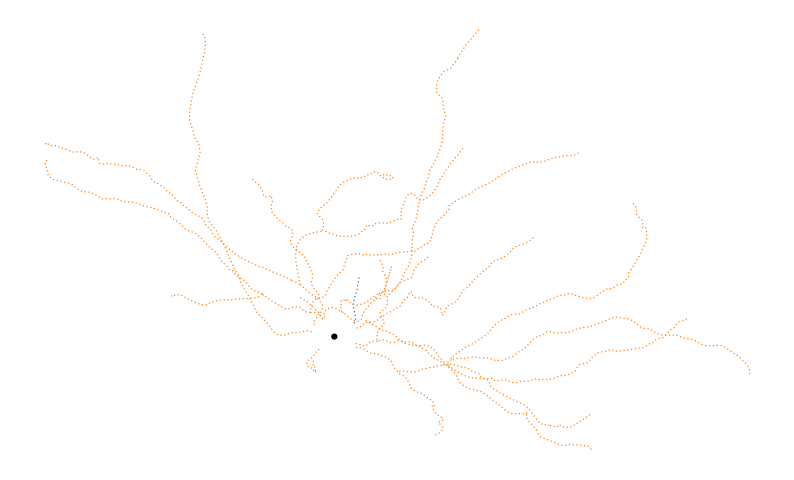

In [50]:
plot_morphology(swc_2019_files[0])

In [54]:
features = extract_features(swc_2019_files[0])
features

2023-11-09 16:28:46,329 root         INFO     skipping mark (validation failed): type
2023-11-09 16:28:46,331 root         INFO     skipping mark (validation failed): type
2023-11-09 16:28:46,335 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be19bedc0>>
2023-11-09 16:28:46,335 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:28:46,337 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:28:46,337 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:28:46,338 root         INFO     skipp

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

{'apical_dendrite.tip.dimension_width': 464.49480000000005,
 'apical_dendrite.tip.dimension_height': 625.7989,
 'apical_dendrite.tip.dimension_depth': 147.1125,
 'apical_dendrite.tip.dimension_min_xyz_x': -402.3001,
 'apical_dendrite.tip.dimension_min_xyz_y': -602.2485,
 'apical_dendrite.tip.dimension_min_xyz_z': -21.7627,
 'apical_dendrite.tip.dimension_max_xyz_x': 62.19470000000007,
 'apical_dendrite.tip.dimension_max_xyz_y': 23.550399999999968,
 'apical_dendrite.tip.dimension_max_xyz_z': 125.34980000000002,
 'apical_dendrite.tip.dimension_bias_xyz_x': 340.1053999999999,
 'apical_dendrite.tip.dimension_bias_xyz_y': -578.6981000000001,
 'apical_dendrite.tip.dimension_bias_xyz_z': 103.58710000000002,
 'axon.tip.dimension_width': 0.0,
 'axon.tip.dimension_height': 0.0,
 'axon.tip.dimension_depth': 0.0,
 'axon.tip.dimension_min_xyz_x': 7.317000000000007,
 'axon.tip.dimension_min_xyz_y': 17.43909999999994,
 'axon.tip.dimension_min_xyz_z': -1.7043999999999997,
 'axon.tip.dimension_max_xyz_

In [56]:
morph_feats2019 = collect_morph_features(swc_files, chunksize=6)

2023-11-09 16:29:49,001 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:49,007 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:49,009 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:49,009 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:49,013 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfedc1310>>
2023-11-09 16:29:49,013 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3828b50>>
2023-11-09 16:29:49,018 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,017 

2023-11-09 16:29:49,051 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,052 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,052 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,053 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,053 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:49,054 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,054 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:49,054 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 1

2023-11-09 16:29:49,064 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,065 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,065 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,064 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,065 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,065 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,065 root      

2023-11-09 16:29:49,071 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,073 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,072 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:49,073 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3e3fe80>>
2023-11-09 16:29:49,073 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,073 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,073 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['

2023-11-09 16:29:49,080 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,080 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,080 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,080 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,080 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,080 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,080 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,081

2023-11-09 16:29:49,084 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,084 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,085 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,085 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,085 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,085 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,084 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29

2023-11-09 16:29:49,091 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,091 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:49,091 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,091 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,091 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:49,091 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,082 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,092 root   

2023-11-09 16:29:49,097 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,097 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,098 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,098 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,097 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,098 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,098 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLaye

2023-11-09 16:29:49,103 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,103 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,103 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,103 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,104 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,104 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,

2023-11-09 16:29:49,109 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:49,109 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,109 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,110 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,110 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:49,110 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['Requires

2023-11-09 16:29:49,114 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,114 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,115 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,115 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,115 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,115 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,115 root         INFO     skipping feature: axon.ax

2023-11-09 16:29:49,118 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:49,118 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,118 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,118 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,118 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,119 root         INFO     skipping feature: basal_dendrite.apical_d

2023-11-09 16:29:49,122 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:49,122 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:49,122 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,122 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,123 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,122 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['Requ

2023-11-09 16:29:49,128 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,128 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,128 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:49,128 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,127 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,128 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:29:

2023-11-09 16:29:49,133 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,124 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:49,133 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,133 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,133 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,133 root

2023-11-09 16:29:49,136 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 16:29:49,137 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,138 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,137 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,137 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,138 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:49,138 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,138 root         INFO     skipping feature: apical_dendrite.tip.

2023-11-09 16:29:49,141 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,141 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,142 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,142 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,142 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,142 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDept

2023-11-09 16:29:49,145 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,145 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,145 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,146 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,146 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,146 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPoint

2023-11-09 16:29:49,149 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:49,149 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,149 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,149 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,149 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,149 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPoi

2023-11-09 16:29:49,153 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,152 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,153 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,153 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:49,153 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,153 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresRe

2023-11-09 16:29:49,161 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,160 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,161 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,161 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,161 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,161 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,161 root         INFO     skipping feature: d

2023-11-09 16:29:49,165 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,165 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:49,165 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,166 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,166 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,166 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDep

2023-11-09 16:29:49,170 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:49,170 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,170 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,170 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:49,170 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,171 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['Requires

2023-11-09 16:29:49,175 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:49,175 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,175 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:49,176 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:49,176 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPo

2023-11-09 16:29:49,179 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,179 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,180 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,180 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:49,180 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,181 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['Re

2023-11-09 16:29:49,187 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,188 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,188 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,188 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,189 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,189 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,189 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,190 root         INFO 

2023-11-09 16:29:49,191 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,198 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,199 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,199 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,200 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,200 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,200 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresAp

2023-11-09 16:29:49,211 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,225 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,226 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,227 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,228 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,220 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,228 root         INFO     

2023-11-09 16:29:49,243 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:49,243 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,244 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:49,245 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:49,246 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'Requ

2023-11-09 16:29:49,279 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:29:49,280 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,279 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:49,283 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,282 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:49,281 root         INFO    

2023-11-09 16:29:49,310 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:49,311 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,312 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:49,314 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimensi

2023-11-09 16:29:49,707 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:29:49,966 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:49,995 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:50,040 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:50,067 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfedc1310>>
2023-11-09 16:29:50,093 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:50,120 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:50,147 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:50,175 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:29:50,616 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:29:50,631 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:50,636 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:29:50,639 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:50,648 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:50,667 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:50,677 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:50,679 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:50,698 root         INFO     sk

2023-11-09 16:29:50,844 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:29:50,845 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:29:50,832 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:50,858 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:50,847 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:29:50,860 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:50,860 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:29:50,865 root         INFO     skipping feature: a

2023-11-09 16:29:50,876 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']


2023-11-09 16:29:50,867 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:29:50,880 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:29:50,878 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:29:50,881 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:29:50,882 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:29:50,885 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:29:50,884 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:50,889 root         INFO     skippin

2023-11-09 16:29:50,981 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:50,985 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:50,971 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:50,989 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:50,991 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:50,993 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:50,995 root

2023-11-09 16:29:51,025 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:51,043 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:29:51,055 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:51,055 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:51,059 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:29:51,063 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:29:51,064 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: 

2023-11-09 16:29:51,178 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:29:51,179 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:29:51,180 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:29:51,181 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:29:51,182 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:51,183 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:51,188 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 16:29:51,242 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:51,239 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:51,261 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:51,250 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:51,264 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/

2023-11-09 16:29:51,360 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:51,386 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:51,389 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:29:51,573 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:29:51,661 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:51,665 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:51,674 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:51,683 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3e3fe80>>
2023-11-09 16:29:51,698 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:51,720 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:51,729 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:51,742 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:29:52,079 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:52,081 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:52,085 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:52,083 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:29:52,089 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:29:52,098 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:29:52,109 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-1

2023-11-09 16:29:52,201 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:52,210 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:52,212 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:52,214 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:52,216 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresRef

2023-11-09 16:29:52,585 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:52,594 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:52,619 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be0670910>>
2023-11-09 16:29:52,629 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:52,645 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:52,657 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:52,673 root         INFO     skipp

2023-11-09 16:29:53,998 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:29:54,091 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:54,097 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:54,103 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:54,108 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8927fa0>>
2023-11-09 16:29:54,112 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:54,116 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:54,120 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:54,115 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:29:54,141 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:54,164 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:29:54,168 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:29:54,169 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:29:54,172 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:29:54,176 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:29:54,177 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:29:54,179 root         INFO     skipping

2023-11-09 16:29:54,413 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:54,426 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:54,441 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:54,428 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:54,449 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointD

2023-11-09 16:29:54,665 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:29:54,818 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:54,823 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:54,832 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:54,834 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab88ad940>>
2023-11-09 16:29:54,836 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:54,858 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:54,872 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:54,898 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:29:55,143 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:55,145 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:55,147 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:29:55,377 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:29:55,517 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:55,525 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:55,535 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:55,539 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:55,546 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5af7101fd0>>
2023-11-09 16:29:55,551 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:55,555 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:55,559 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:55,555 roo

2023-11-09 16:29:55,662 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:55,664 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:55,666 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:55,668 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:55,668 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:55,67

2023-11-09 16:29:55,756 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']


2023-11-09 16:29:55,781 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:29:55,786 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:29:55,800 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:29:55,825 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:29:55,842 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:55,835 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:29:55,846 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:55,851 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:55,852 root         INFO     selec

2023-11-09 16:29:55,958 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:55,969 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:55,970 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:55,979 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:55,980 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:55,991 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Foun

2023-11-09 16:29:56,136 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:56,154 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:56,161 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:56,166 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:56,167 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerD

2023-11-09 16:29:56,631 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:29:56,748 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:56,777 root         INFO     skipping mark (validation failed): type


2023-11-09 16:29:56,791 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:56,812 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5af7101970>>
2023-11-09 16:29:56,815 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:56,816 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:56,820 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:56,833 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:56,837 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:2

2023-11-09 16:29:57,067 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:29:57,076 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:29:57,080 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:57,081 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:29:57,086 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:57,093 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:29:57,095 root         INFO     skipping featur

2023-11-09 16:29:57,155 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:57,171 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:57,155 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:29:57,172 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:29:57,179 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:29:57,180 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:29:57,173 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:29:

2023-11-09 16:29:57,194 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:57,196 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:29:57,203 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:57,205 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:29:57,211 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:57,204 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:29:57,212 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:29:57,213 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:29:57,216 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:57,212 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:57,219 root         INFO     skip

2023-11-09 16:29:57,254 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:57,281 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:57,302 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:57,322 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:57,337 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:57,353 r

2023-11-09 16:29:57,494 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:57,502 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:29:57,515 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:29:57,517 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:29:57,519 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:57,521 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:57,523 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra ma

2023-11-09 16:29:57,569 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:57,571 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:57,587 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:57,605 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:57,624 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDep

2023-11-09 16:29:58,061 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:58,068 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:58,087 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:58,089 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0da30>>
2023-11-09 16:29:58,092 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:58,094 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:58,096 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:58,098 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:29:58,320 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:58,335 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:58,346 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:29:58,573 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:58,595 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0d400>>
2023-11-09 16:29:58,596 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:58,600 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:58,619 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:58,621 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:29:58,631 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:2

2023-11-09 16:29:58,669 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:29:58,665 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:58,671 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:29:58,672 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:29:58,683 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfedc1310>>
2023-11-09 16:29:58,687 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:29:58,689 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:29:58,690 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:58,690 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:29:58,693 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:58,696 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:29:58,703 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:29:58,705 root         INFO     skipping feature: apical_dendrite.mea

2023-11-09 16:29:58,810 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:29:58,811 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:29:58,804 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:58,816 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:29:58,824 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:58,831 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:58,825 root         INFO     skipping mark (validation failed): type
2023-11-09 16:29:58,838 root   

2023-11-09 16:29:58,976 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:29:58,992 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:29:59,020 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:29:59,046 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:29:59,059 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:59,071 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:59,090 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:59,103 root         INFO  

2023-11-09 16:29:59,151 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:29:59,169 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:29:59,182 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:59,186 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:59,198 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:29:59,216 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogra

2023-11-09 16:29:59,424 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:59,428 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:59,432 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:59,436 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:59,440 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:59,444 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:29:59,449 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:29:59,453 root         I

2023-11-09 16:30:00,238 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:00,248 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:00,267 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:00,272 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0d8e0>>
2023-11-09 16:30:00,277 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:00,284 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:00,289 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:00,294 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:30:00,511 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:00,517 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:00,524 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:30:00,814 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:00,821 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:00,842 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:00,843 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be19bef40>>
2023-11-09 16:30:00,845 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:00,847 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:00,848 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:00,875 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:30:01,347 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:01,369 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:01,372 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:01,391 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:01,408 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:01,429 root         INFO     skipping

2023-11-09 16:30:01,557 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:30:01,559 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:30:01,560 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:30:01,562 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:30:01,563 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:30:01,565 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:30:01,566 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:30:01,56

2023-11-09 16:30:02,063 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']


2023-11-09 16:30:02,076 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:02,085 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:02,094 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:02,096 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:02,098 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerD

2023-11-09 16:30:02,616 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:02,628 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:02,641 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:02,652 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:02,670 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:02,688 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:02,700 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDept

2023-11-09 16:30:03,396 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:03,401 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:03,412 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:03,414 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0d1c0>>
2023-11-09 16:30:03,429 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:03,431 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:03,444 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:03,449 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:03,449 roo

2023-11-09 16:30:03,632 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:03,633 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:03,638 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:03,644 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:03,639 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:30:03,648 root  

2023-11-09 16:30:04,117 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:04,109 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:30:04,118 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:04,133 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:04,138 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:04,140 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:04,147 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:04,152 root         INFO     sk

2023-11-09 16:30:04,391 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:30:04,395 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:30:04,399 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:30:04,417 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:30:04,442 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:30:04,461 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:30:04,480 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:30:04,496

2023-11-09 16:30:04,872 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 16:30:05,488 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:05,492 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:05,496 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:05,501 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:05,505 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:05,509 root         INFO     sk

2023-11-09 16:30:05,963 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:05,965 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:05,970 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:05,972 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3828fd0>>
2023-11-09 16:30:05,973 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:05,977 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:05,980 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:05,982 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:30:06,389 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:06,391 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:30:06,403 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:06,425 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_ti

2023-11-09 16:30:06,911 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:30:06,932 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:30:06,957 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 16:30:06,944 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']


2023-11-09 16:30:06,963 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 16:30:06,966 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:06,993 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:07,006 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:07,019 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:07,015 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:07,028 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:07,034 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:07,034 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractio

2023-11-09 16:30:07,098 root         INFO     skipping mark (validation failed): type


2023-11-09 16:30:07,100 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac2fc1100>>
2023-11-09 16:30:07,100 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:07,102 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:07,097 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:30:07,103 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:07,104 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:07,107 root         INFO     skipping feature: apical_dendrite.node.dimension. Found 

2023-11-09 16:30:07,177 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:07,206 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:07,207 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:07,193 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:07,197 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:30:07,222 r

2023-11-09 16:30:07,269 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be19be340>>
2023-11-09 16:30:07,271 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:07,274 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:07,276 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:07,268 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:07,277 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferen

2023-11-09 16:30:07,381 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:30:07,384 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:07,373 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:07,405 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:07,407 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:07,399 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:07,408 root         INFO     skipping feature: apical_dendrite.ap

2023-11-09 16:30:07,544 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 16:30:10,145 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:10,154 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:10,171 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0d310>>
2023-11-09 16:30:10,176 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:10,178 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:10,185 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:10,189 root         INFO     skipp

2023-11-09 16:30:11,256 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:30:11,337 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:11,341 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:11,350 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:11,352 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be19bed00>>
2023-11-09 16:30:11,354 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:11,356 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:11,359 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:11,361 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:30:11,458 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:11,460 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:11,462 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:30:12,285 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:30:12,352 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:12,355 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:12,362 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:12,364 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0daf0>>
2023-11-09 16:30:12,366 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:12,368 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:12,370 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:12,372 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:30:12,404 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:12,406 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:12,407 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 16:30:12,409 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:12,438 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:12,440 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:12,442 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:12,444 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:12,446 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:12,448 root         INFO     skipping feature: all_neur

2023-11-09 16:30:12,587 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:12,599 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:12,610 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:12,623 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:12,634 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:30:12,647 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:30:12,659 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:30:12,668 root         INFO     skipping feature

2023-11-09 16:30:12,778 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be19be760>>


2023-11-09 16:30:12,788 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:12,776 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:12,801 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:12,792 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:12,820 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:12,821 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:12,827 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:12,831 root         INFO    

2023-11-09 16:30:13,012 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:13,014 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:13,015 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:13,017 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:13,012 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.

2023-11-09 16:30:13,097 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:30:13,109 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:13,117 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:13,110 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:30:13,122 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:13,121 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks

2023-11-09 16:30:13,260 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:13,261 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:13,270 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:13,273 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:13,277 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 16:30:13,281 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:13,283 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:13,288 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:13,289 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:13,311 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:13,330 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:13,349 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDept

2023-11-09 16:30:13,660 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:13,688 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:13,702 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3828b50>>
2023-11-09 16:30:13,715 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:13,727 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:13,741 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:13,754 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:13,766 root         INFO     skipping fea

2023-11-09 16:30:13,985 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:13,997 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:14,009 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:14,022 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:14,030 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:14,041 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:14,045 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:14,058 root         INFO  

2023-11-09 16:30:14,544 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:14,558 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:14,592 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:14,596 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0d370>>
2023-11-09 16:30:14,601 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:14,607 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:14,611 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:14,616 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:30:14,716 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:14,718 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:14,720 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:30:15,144 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:15,147 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 16:30:15,157 root         INFO     skipping mark (validation failed): type


2023-11-09 16:30:15,193 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:15,205 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be19be460>>
2023-11-09 16:30:15,220 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:15,236 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:15,250 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:15,264 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:15,273 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:15,278 root         INFO     skipping fea

2023-11-09 16:30:15,461 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:15,461 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:15,472 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:15,478 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:15,480 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:15,483 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresRefer

2023-11-09 16:30:15,597 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:15,600 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:15,611 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:30:16,338 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:16,341 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:16,350 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3840fd0>>
2023-11-09 16:30:16,352 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:16,355 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:16,357 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:16,359 root         INFO     skipp

2023-11-09 16:30:16,836 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:16,845 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:16,864 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:16,866 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0d340>>
2023-11-09 16:30:16,868 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:16,891 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:16,913 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:16,935 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:30:17,008 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']


2023-11-09 16:30:17,034 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:30:17,047 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:30:17,058 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:30:17,074 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:30:17,097 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:30:17,115 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:30:17,143 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:30:

2023-11-09 16:30:17,274 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:17,257 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:17,276 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:17,278 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:17,280 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:17,280 root         INFO     skipping feature: apical_dendrite.node.moments. Foun

2023-11-09 16:30:17,368 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:17,381 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:17,394 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:17,405 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:17,418 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16

2023-11-09 16:30:18,826 root         INFO     skipping mark (validation failed): type


2023-11-09 16:30:18,830 root         INFO     skipping mark (validation failed): type


2023-11-09 16:30:18,857 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8724730>>
2023-11-09 16:30:18,859 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:18,870 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:18,891 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:18,895 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:18,921 root         INF

2023-11-09 16:30:18,960 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:18,978 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:18,988 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:19,000 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:19,013 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:30:19,025 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:30:19,037 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:30:19,049 root         INFO     skipping feature

2023-11-09 16:30:19,131 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:19,147 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:19,150 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:19,152 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:19,157 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:19,159 root         INF

2023-11-09 16:30:19,479 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:30:19,491 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:30:19,518 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:30:19,528 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:30:19,530 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:30:19,531 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:19,532 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:19,536 root         INFO

2023-11-09 16:30:20,675 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:20,685 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:20,706 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:20,710 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5af71013d0>>
2023-11-09 16:30:20,715 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:20,719 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:20,732 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:20,736 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:30:21,115 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:21,129 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:21,154 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:30:21,296 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:21,302 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:21,321 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0dd60>>
2023-11-09 16:30:21,343 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:21,361 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:21,375 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:21,391 root         INFO     skipp

2023-11-09 16:30:21,777 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:30:21,868 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 16:30:21,883 root         INFO     skipping mark (validation failed): type


2023-11-09 16:30:21,887 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:21,900 root         INFO     skipping mark (validation failed): type


2023-11-09 16:30:21,906 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1676cd0>>
2023-11-09 16:30:21,923 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:21,941 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:21,962 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:21,978 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:21,980 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:30:21,981 root         INFO     skipping feature: apical_dendrite.num_branches. Found e

2023-11-09 16:30:22,160 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:22,162 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:22,163 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']


2023-11-09 16:30:22,165 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:22,155 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']


2023-11-09 16:30:22,174 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:22,171 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:22,176 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:22,177 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:22,178 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:22,179 root         INFO     skipping feature: all_neurites.normalized_depth_histogram.

2023-11-09 16:30:22,237 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:22,264 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:22,283 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:22,290 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:22,291 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16

2023-11-09 16:30:22,477 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:30:22,482 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:30:22,486 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:22,490 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:22,492 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mea

2023-11-09 16:30:22,817 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:22,827 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:22,861 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:22,866 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0d580>>
2023-11-09 16:30:22,891 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:22,912 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:22,933 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:22,951 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:30:23,208 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:23,210 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:23,213 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:30:23,800 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:23,815 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:23,842 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:23,851 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be19bedf0>>
2023-11-09 16:30:23,873 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:23,884 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:23,886 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:30:23,902 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:23,918 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:23,936 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:30:23,957 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:30:23,979 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:30:24,006 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:30:24,023 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:30:24,037 root         INFO     skipping feature

2023-11-09 16:30:24,419 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:30:24,423 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:30:24,426 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:30:24,428 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:30:24,430 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:30:24,414 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:24,433 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['

2023-11-09 16:30:24,520 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
2023-11-09 16:30:24,523 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:24,525 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:24,528 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:24,530 root     

2023-11-09 16:30:24,924 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:24,936 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:24,959 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:24,963 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0df10>>
2023-11-09 16:30:24,985 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:25,003 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:25,018 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:25,031 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:30:25,562 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:25,572 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:25,588 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:30:25,927 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:25,945 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:25,993 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:25,999 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be19bed00>>
2023-11-09 16:30:26,024 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:30:26,025 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:26,043 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:26,051 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:26,054 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:26,056 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:30:26,058 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:30:26,060 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:30:26,062 root         INFO     skipping feature

2023-11-09 16:30:26,181 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:26,205 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:26,235 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:26,251 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1600b50>>
2023-11-09 16:30:26,262 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:26,280 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:26,291 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:26,302 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:30:26,375 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:30:26,378 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:30:26,380 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:30:26,386 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:30:26,393 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:30:26,395 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:30:26,397 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:30:26,419 ro

2023-11-09 16:30:26,513 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:26,516 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:30:26,518 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:26,510 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:26,522 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:26,527 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:26,530 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:26,531 root         INFO     skipping 

2023-11-09 16:30:26,673 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:26,668 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:26,687 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:26,692 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:26,694 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:30:26,695 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:26,709 root         INFO     skipping f

2023-11-09 16:30:27,038 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:27,053 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:27,064 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:27,080 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:27,090 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:27,094 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  sk = skew(a, axis, bias=bias)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = kurtosis(a, axis, bias=bias)


2023-11-09 16:30:29,518 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:29,529 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:29,554 root         INFO     skipping mark (validation failed): type


2023-11-09 16:30:29,559 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8765340>>
2023-11-09 16:30:29,561 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']


2023-11-09 16:30:29,568 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:29,572 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:29,574 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:29,579 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:30:29,581 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:30:29,589 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:30:29,591 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:30:29,598 root         INFO     skipping fe

2023-11-09 16:30:29,682 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:29,694 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:29,695 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:29,697 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:29,698 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:29,699 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:29,701 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:29,692 root         IN

2023-11-09 16:30:29,756 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:29,771 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:29,773 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:29,779 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:29,783 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 16:30:30,377 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:30,396 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:30,412 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1600970>>
2023-11-09 16:30:30,434 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:30,446 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:30,459 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:30,471 root         INFO     skipp

2023-11-09 16:30:31,140 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:30:31,332 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:31,342 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:31,362 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:31,365 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0dd60>>
2023-11-09 16:30:31,369 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:31,374 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:31,381 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:31,384 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:31,384 roo

2023-11-09 16:30:31,523 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:31,525 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:31,527 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:31,517 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:30:31,529 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:31,531 root  

2023-11-09 16:30:31,702 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:31,716 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:31,720 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 16:30:31,724 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:31,730 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:31,734 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:31,736 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:31,738 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:31,741 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:31,743 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDept

2023-11-09 16:30:31,875 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1600d00>>
2023-11-09 16:30:31,885 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:31,870 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:31,888 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:31,890 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:31,886 roo

2023-11-09 16:30:32,041 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:30:32,043 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:30:32,036 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:30:32,048 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:30:32,051 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:30:32,053 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:30:32,054 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:32,056 root         INFO    

2023-11-09 16:30:32,162 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:32,183 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:32,191 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:32,200 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:32,205 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:32,210 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:32,215 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:32,220 root         I

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 16:30:33,369 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:33,378 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:33,393 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:33,397 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:33,401 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:33,403 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be19be790>>
2023-11-09 16:30:33,404 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:33,407 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:33,407 root         INFO     skipping mark (validation fai

2023-11-09 16:30:33,427 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:30:33,426 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']


2023-11-09 16:30:33,433 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:30:33,429 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:30:33,439 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:30:33,441 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:30:33,440 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:30:33,450 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:30:33,443 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-1

2023-11-09 16:30:33,577 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:33,579 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:30:33,571 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:33,572 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:33,582 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:33,585 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:33,584 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_dist

2023-11-09 16:30:33,674 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:33,680 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:33,679 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:33,690 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:33,693 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:33,699 root         INFO     skipping feature: axon.axon.earth_movers_distance

2023-11-09 16:30:33,861 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:33,887 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:33,900 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:33,922 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:33,948 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:33,971 root         INFO     skip

2023-11-09 16:30:36,190 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:36,204 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:36,237 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:36,242 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3828b50>>
2023-11-09 16:30:36,264 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:36,268 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:36,276 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:36,303 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:30:36,507 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']


2023-11-09 16:30:36,510 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:30:36,513 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:36,516 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:36,519 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:36,521 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:36,524 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:36,526 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:36,528 root         

2023-11-09 16:30:36,704 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:36,716 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:36,744 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:36,748 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0d5e0>>
2023-11-09 16:30:36,761 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:36,783 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:36,794 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:36,807 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:30:36,962 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:30:36,973 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:30:36,977 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:36,980 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:36,982 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:36,984 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:36,986 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:36,989

2023-11-09 16:30:37,207 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:30:37,208 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:30:37,210 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:30:37,212 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:30:37,213 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:37,215 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:37,217 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:37,218 root         INFO  

2023-11-09 16:30:37,315 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:37,321 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:37,323 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:37,327 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:37,337 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 16:30:37,940 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:37,949 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:37,970 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:37,996 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5af7101580>>
2023-11-09 16:30:38,011 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:38,026 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:38,030 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:38,041 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:30:38,628 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:38,632 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:38,642 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:38,668 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:38,679 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 16:30:39,141 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:39,157 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:39,172 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:39,174 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:39,179 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:39,194 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:39,202 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:39,204 root         IN

2023-11-09 16:30:39,272 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:39,279 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfedc1310>>
2023-11-09 16:30:39,283 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:39,285 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:39,287 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:39,289 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:39,291 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:3

2023-11-09 16:30:39,378 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:39,379 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_ti

2023-11-09 16:30:39,678 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:30:39,714 root         INFO     skipping mark (validation failed): type


2023-11-09 16:30:39,726 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:39,754 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:39,756 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1600f40>>
2023-11-09 16:30:39,759 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:39,761 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:39,763 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:39,765 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:39,767 root         INFO     skipping fea

2023-11-09 16:30:39,855 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:39,857 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:39,842 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:39,859 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dime

2023-11-09 16:30:40,219 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:40,221 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:40,223 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:40,225 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:40,227 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:40,229 root         INFO     skip

2023-11-09 16:30:42,275 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:42,280 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:42,289 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0da30>>
2023-11-09 16:30:42,293 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:42,298 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:42,303 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:42,308 root         INFO     skipp

2023-11-09 16:30:42,854 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:30:42,918 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:42,923 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:42,933 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d030a0>>
2023-11-09 16:30:42,937 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:42,942 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:42,946 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:42,951 root         INFO     skipp

2023-11-09 16:30:42,970 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:42,974 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:42,976 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:42,978 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:42,980 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:42,982 root         INFO     skipping feature: 

2023-11-09 16:30:42,990 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:42,998 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:43,002 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:43,006 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:43,012 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30

2023-11-09 16:30:43,026 root         INFO     selected features: ['apical_dendrite.tip.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'apical_dendrite.bifurcation.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'apical_dendrite.node.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'apical_dendrite.compartment.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'apical_dendrite.num_nodes', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'apical_dendrite.num_branches', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'apical_dendrite

2023-11-09 16:30:43,047 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:30:43,098 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:43,101 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:43,113 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:43,115 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be19be790>>
2023-11-09 16:30:43,116 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:43,121 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:43,127 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:43,128 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:43,130 roo

2023-11-09 16:30:43,229 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:30:43,230 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:30:43,232 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:30:43,233 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:30:43,234 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:30:43,235 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:30:43,236 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:30:43,237 roo

2023-11-09 16:30:43,275 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:43,271 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:30:43,278 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:43,282 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:43,283 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:43,289 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceL

2023-11-09 16:30:43,333 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:43,335 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:43,337 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:43,338 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:43,354 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:43,356 root         INFO     skipping feature: apical_dendrite

2023-11-09 16:30:44,085 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:44,096 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:44,124 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:44,137 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be19bed00>>
2023-11-09 16:30:44,149 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:44,162 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:44,173 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:44,189 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:30:44,508 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']


2023-11-09 16:30:44,521 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:44,548 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:44,552 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:44,562 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:44,574 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDep

2023-11-09 16:30:44,829 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:44,833 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:44,837 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:44,841 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:44,846 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:44,850 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:44,854 root         INFO     skipping feature: all_neur

2023-11-09 16:30:44,866 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:44,878 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:44,883 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:44,887 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:44,892 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:44,894 root         INFO     skippi

2023-11-09 16:30:45,080 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:30:45,085 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:30:45,089 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:30:45,094 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:30:45,099 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:30:45,103 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:30:45,108 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:30:45,113 ro

2023-11-09 16:30:45,468 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:30:45,620 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:45,627 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:45,645 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:45,647 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be19bec70>>
2023-11-09 16:30:45,649 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:45,652 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:45,654 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:45,656 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:30:45,789 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:45,793 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:45,797 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:45,801 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']


2023-11-09 16:30:45,802 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:45,817 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:45,843 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:45,860 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:45,871 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:45,889 root         INF

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  sk = skew(a, axis, bias=bias)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = kurtosis(a, axis, bias=bias)
2023-11-09 16:30:46,101 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:30:46,118 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:30:46,134 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_l

2023-11-09 16:30:46,294 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:46,307 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
2023-11-09 16:30:46,332 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:46,343 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:46,345 root         INFO     skipping feature: apical_dendrite.bi

2023-11-09 16:30:46,529 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:30:46,513 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']


2023-11-09 16:30:46,533 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:30:46,534 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:30:46,536 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:46,545 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:30:46,546 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:46,552 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:30:46,560 root         INFO     skipping fe

2023-11-09 16:30:46,678 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:46,680 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:46,687 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:46,696 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:46,692 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:46,702 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredP

2023-11-09 16:30:46,760 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:30:46,786 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:30:46,798 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:30:46,802 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:30:46,823 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:30:46,841 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:30:46,857 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:46,883 root         INFO    

2023-11-09 16:30:46,910 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:46,951 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:46,953 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:46,938 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:46,961 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0d850>>
2023-11-09 16:30:46,962 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 16:30:46,963 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:46,965 root         I

2023-11-09 16:30:46,981 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:30:46,984 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:46,987 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:46,974 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:47,001 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:47,003 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:47,011 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayere

2023-11-09 16:30:47,079 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:47,105 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:47,131 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:47,151 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:47,173 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:47,199 root         INFO     skipping feature: apical_dendrite

2023-11-09 16:30:47,455 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:47,470 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:47,490 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:47,515 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:47,528 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:47,534 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:47,536 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:47,537 root         IN

2023-11-09 16:30:47,954 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:30:48,282 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:48,305 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:48,355 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:48,361 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5af7101970>>
2023-11-09 16:30:48,387 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:48,409 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:48,424 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:48,446 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:30:48,594 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:30:48,616 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:30:48,642 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:30:48,680 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:48,668 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:30:48,686 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:48,697 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:48,700 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionR

2023-11-09 16:30:48,869 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:48,873 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:48,872 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:48,887 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:48,889 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:48,891 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:48,893 root         INFO     skipping feature: apical_dendrite.

2023-11-09 16:30:49,049 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:49,062 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:49,070 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:49,093 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:49,098 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'Require

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 16:30:50,198 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']


2023-11-09 16:30:50,206 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:30:50,216 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:30:50,224 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:30:50,229 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:30:50,233 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:30:50,238 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:30:50,242 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:30:50,246 ro

2023-11-09 16:30:50,397 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:50,411 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:50,426 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:50,444 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:50,461 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:30:50,487 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:30:50,513 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:30:50,527 root         INFO     skipping feature

2023-11-09 16:30:51,071 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 16:30:51,187 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:30:51,204 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:51,221 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:51,245 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5af7101ca0>>
2023-11-09 16:30:51,266 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:51,272 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:51,286 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:51,290 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:51,299 root         INFO     skipping mark (valid

2023-11-09 16:30:51,438 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:30:51,452 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:51,468 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:51,484 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:51,505 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:51,522 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:51,537 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:51,547 root         

2023-11-09 16:30:52,925 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:30:53,019 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:53,026 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:53,039 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:53,041 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0d850>>
2023-11-09 16:30:53,048 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:53,054 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:53,059 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:53,064 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:30:53,289 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:53,294 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:53,299 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:30:54,029 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:54,043 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:54,081 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:54,086 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be19bee20>>
2023-11-09 16:30:54,102 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:54,129 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:54,156 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:54,179 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:30:54,998 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:55,000 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:55,002 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:55,004 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:55,006 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresRef

2023-11-09 16:30:55,050 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:30:55,147 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:55,159 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:55,190 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:55,200 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be19beaf0>>
2023-11-09 16:30:55,210 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:55,218 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:55,224 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:55,226 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:30:55,309 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:30:55,329 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:30:55,331 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:30:55,333 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:30:55,335 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:30:55,328 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:55,336 root         INFO     skipping feature: apical_dend

2023-11-09 16:30:55,402 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:55,411 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:55,421 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:55,422 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:55,427 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf879db50>>
2023-11-09 16:30:55,431 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:55,435 root         INFO     sk

2023-11-09 16:30:55,506 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:30:55,535 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:30:55,550 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:30:55,566 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:30:55,582 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:30:55,598 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:30:55,614 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']


2023-11-09 16:30:55,620 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 16:30:55,630 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:55,636 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:55,654 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:55,668 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:55,683 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:55,709 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:55,715 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:55,731 root       

2023-11-09 16:30:55,954 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 16:30:56,495 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:30:56,513 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:56,539 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:56,565 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimensi

2023-11-09 16:30:57,437 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:57,444 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:57,469 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8bf5bb0>>
2023-11-09 16:30:57,495 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:57,504 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:57,520 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:57,528 root         INFO     skipp

2023-11-09 16:30:57,691 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:30:57,700 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:57,713 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:57,724 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:57,750 root         INFO     selected features: ['apical_dendrite.tip.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'apical_dendrite.bifurcation.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'apical_dendrite.nod

2023-11-09 16:30:58,263 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:58,275 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:58,289 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:58,308 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:30:58,319 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:58,327 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:58,341 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:30:58,353 root         IN

2023-11-09 16:30:58,894 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:58,919 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:58,933 root         INFO     skipping mark (validation failed): type
2023-11-09 16:30:58,935 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0d880>>
2023-11-09 16:30:58,953 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:58,963 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:58,985 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:30:58,997 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:30:59,622 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:59,641 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:30:59,666 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:31:00,603 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:00,626 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:00,639 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3840c40>>
2023-11-09 16:31:00,647 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:00,659 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:00,674 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:00,700 root         INFO     skipp

2023-11-09 16:31:01,714 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:31:01,854 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:01,865 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:01,882 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:01,890 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1600f70>>
2023-11-09 16:31:01,902 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:01,914 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:01,926 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:01,942 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:02,521 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:02,533 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:02,545 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:31:03,192 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:03,203 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:03,226 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:03,248 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8b35640>>
2023-11-09 16:31:03,262 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:03,274 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:03,286 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:03,302 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:03,656 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:03,678 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:03,694 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:03,706 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:03,720 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:03,735 root         INFO     skipping

2023-11-09 16:31:03,923 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:31:03,934 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:31:03,939 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:31:03,944 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:31:03,949 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:31:03,954 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:31:03,961 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:31:03,966 roo

2023-11-09 16:31:04,341 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:31:04,682 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:31:04,702 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:04,710 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:04,738 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:04,747 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3840310>>
2023-11-09 16:31:04,754 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:04,769 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:04,784 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:04,795 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:04,959 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:31:04,959 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:04,960 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:31:04,964 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:31:04,966 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:31:04,967 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:31:04,969 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_lo

2023-11-09 16:31:05,069 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:05,073 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:05,075 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:05,096 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:05,099 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8a7e3a0>>
2023-11-09 16:31:05,101 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:05,103 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found

2023-11-09 16:31:05,184 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:05,193 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:05,196 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:05,198 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:05,202 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointD

2023-11-09 16:31:06,132 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:06,137 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:06,148 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03730>>
2023-11-09 16:31:06,153 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:06,158 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:06,164 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:06,168 root         INFO     skipp

2023-11-09 16:31:07,200 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:31:07,284 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:07,292 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:07,306 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:07,311 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03100>>
2023-11-09 16:31:07,316 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:07,321 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:07,328 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:07,332 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:07,595 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:07,599 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:07,604 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:31:08,641 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:08,653 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:08,686 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:08,690 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac2fc1100>>
2023-11-09 16:31:08,703 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:08,715 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:08,737 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:08,749 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:09,036 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:31:09,055 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:31:09,064 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:31:09,077 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:31:09,089 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:31:09,112 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:31:09,125 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:31:09,134 root         INFO  

2023-11-09 16:31:09,530 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:09,534 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:09,544 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:09,546 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3840c40>>
2023-11-09 16:31:09,549 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:09,551 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:09,553 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:09,555 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:09,666 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:09,668 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:09,671 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:31:10,028 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:10,056 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:10,088 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0d340>>
2023-11-09 16:31:10,110 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:10,137 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:10,166 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:10,194 root         INFO     skipp

2023-11-09 16:31:10,492 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:10,494 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:10,496 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:10,498 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:10,500 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31

2023-11-09 16:31:10,715 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:10,752 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:10,814 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:10,842 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8b35cd0>>
2023-11-09 16:31:10,872 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:10,899 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:10,928 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:10,955 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:11,677 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:11,679 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:11,681 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:31:11,898 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:11,907 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:11,923 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:11,928 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03520>>
2023-11-09 16:31:11,932 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:11,938 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:11,942 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:11,947 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:12,393 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:12,394 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:12,396 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:12,398 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:12,400 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:12,402 root         INF

2023-11-09 16:31:12,409 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:12,411 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:12,416 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:12,443 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']


2023-11-09 16:31:12,456 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:12,465 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:12,474 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:31:12,624 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 16:31:12,625 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:31:12,624 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:12,627 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']


2023-11-09 16:31:12,632 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:12,642 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:12,643 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:12,644 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:12,646 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:31:12,647 root         INFO     skipping feature: apical_dendrite.mea

2023-11-09 16:31:12,696 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:12,708 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:12,719 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:12,725 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:12,727 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDep

2023-11-09 16:31:12,981 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:31:12,983 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:31:12,985 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:31:12,987 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:31:12,989 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:12,991 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:12,993 root         INFO     skipping feature: all_neur

2023-11-09 16:31:14,057 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:14,072 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:14,114 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:14,121 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3828c70>>
2023-11-09 16:31:14,136 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:14,151 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:14,155 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:14,182 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:14,580 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:14,587 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:14,609 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:14,631 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:14,653 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 16:31:14,776 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:14,785 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:14,824 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfbfd9b50>>
2023-11-09 16:31:14,848 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:14,851 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:14,871 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:14,892 root         INFO     skipp

2023-11-09 16:31:15,102 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:31:15,119 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:31:15,128 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:31:15,137 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:31:15,162 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:31:15,172 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:15,181 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra 

2023-11-09 16:31:15,259 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:15,273 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:15,298 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:15,312 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:15,314 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:15,333 root         INF

2023-11-09 16:31:15,527 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:31:15,546 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:31:15,571 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:31:15,596 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:31:15,604 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:31:15,609 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:31:15,631 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:31:15,645 root         INFO

2023-11-09 16:31:18,899 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:31:19,006 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:19,014 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:19,031 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:19,036 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3804580>>
2023-11-09 16:31:19,040 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:19,046 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:19,050 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:19,055 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:19,268 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:19,273 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:19,278 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:31:20,095 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:20,103 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:20,118 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:20,123 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03070>>
2023-11-09 16:31:20,128 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:20,132 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:20,137 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:20,142 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:20,419 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:20,423 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:20,428 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:31:21,535 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:21,541 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:21,557 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0d400>>
2023-11-09 16:31:21,570 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:21,573 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:21,591 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:21,598 root         INFO     skipp

2023-11-09 16:31:23,044 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:31:23,445 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:23,456 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:23,477 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:23,483 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3c89280>>
2023-11-09 16:31:23,489 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:23,494 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:23,501 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:23,505 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:23,755 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:23,762 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:23,767 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:31:24,463 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:24,466 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:24,476 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8724730>>
2023-11-09 16:31:24,478 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:24,483 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:24,487 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:24,492 root         INFO     skipp

2023-11-09 16:31:24,689 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:24,697 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:24,717 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:24,718 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac2fc1100>>
2023-11-09 16:31:24,726 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:24,731 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:24,736 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:24,741 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:24,917 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:24,923 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:31:24,929 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:24,935 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:24,939 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:24,964 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:24,968 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16

2023-11-09 16:31:25,193 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:25,203 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:25,215 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:25,237 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:25,264 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:25,279 root    

2023-11-09 16:31:25,915 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:25,922 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:25,931 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:25,936 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d032b0>>
2023-11-09 16:31:25,941 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:25,946 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:25,951 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:25,955 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:26,185 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:26,190 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:26,196 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:31:26,846 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:26,854 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:26,867 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:26,871 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3828b50>>
2023-11-09 16:31:26,877 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:26,882 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:26,888 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:26,894 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:27,045 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:27,047 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:27,056 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:27,062 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:27,069 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:27,075 root         INFO     skipping

2023-11-09 16:31:27,166 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:31:27,191 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:31:27,196 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:31:27,201 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:31:27,207 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:31:27,212 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:31:27,218 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:31:27,223 root         I

2023-11-09 16:31:27,781 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:27,790 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:27,812 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:27,816 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfedc1310>>
2023-11-09 16:31:27,819 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:27,820 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:27,821 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:27,847 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:28,390 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:31:28,402 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:28,416 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:28,429 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:28,452 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:28,466 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresRef

2023-11-09 16:31:28,548 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:28,556 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:28,571 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:28,573 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab88c49a0>>
2023-11-09 16:31:28,577 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:28,583 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:28,590 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:28,595 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:28,652 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:28,651 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']


2023-11-09 16:31:28,654 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:28,654 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:31:28,657 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:28,660 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:28,660 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:31:28,662 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:31:28,669 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:31:28,670 root   

2023-11-09 16:31:28,787 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:28,789 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:28,781 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:28,791 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:28,793 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'Requir

2023-11-09 16:31:28,919 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:28,922 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:28,931 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:28,933 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:28,936 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:28,938 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bi

2023-11-09 16:31:29,019 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:29,021 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:29,023 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:29,025 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:29,053 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:29,062 root         INFO     skipping

2023-11-09 16:31:30,151 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:30,177 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:30,202 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:30,212 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03670>>
2023-11-09 16:31:30,231 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:30,265 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 16:31:30,252 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']


2023-11-09 16:31:30,276 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:30,277 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']


2023-11-09 16:31:30,278 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:31:30,288 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:31:30,289 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:31:30,291 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:31:30,293 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:31:30,295 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:31:30,296 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:31:30,307 root         INFO     s

2023-11-09 16:31:30,448 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:30,450 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:30,452 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:31:30,452 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:30,457 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:31:30,459 root         INFO     skipping feature: apical_dendrite.tota

2023-11-09 16:31:30,580 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:30,585 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:30,590 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:30,595 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:30,600 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:30,604 root         INFO     

2023-11-09 16:31:31,852 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:31,861 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:31,885 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:31,902 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3840310>>
2023-11-09 16:31:31,915 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:31,928 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:31,942 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:31,955 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:32,022 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:31:32,033 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:31:32,036 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:31:32,046 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:31:32,065 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:31:32,087 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:31:32,101 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:31:

2023-11-09 16:31:32,224 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:32,225 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:32,227 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:32,228 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:32,230 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 16:31:32,296 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:31:32,302 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:31:32,312 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:32,323 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:32,327 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:32,333 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'R

2023-11-09 16:31:32,422 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:32,423 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:32,427 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:32,431 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:32,439 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:32,444 root         INFO     skipping feature: basa

2023-11-09 16:31:33,393 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:33,402 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:33,424 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:33,437 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0d610>>
2023-11-09 16:31:33,451 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:33,465 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:33,478 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:33,492 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:34,060 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:34,070 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:34,073 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:31:34,742 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:34,748 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:34,768 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:34,770 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8622af0>>
2023-11-09 16:31:34,774 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:34,780 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:34,785 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:34,789 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:34,842 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']


2023-11-09 16:31:34,848 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:31:34,855 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:31:34,859 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:31:34,868 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:31:34,873 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:31:34,878 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:31:34,882 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:31:34,887 root         

2023-11-09 16:31:34,988 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:31:34,997 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:31:35,000 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:31:35,007 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:31:35,011 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:31:35,016 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:31:35,020 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:31:35,025 roo

2023-11-09 16:31:35,995 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:36,007 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:36,027 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:36,042 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab88c49a0>>
2023-11-09 16:31:36,058 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:36,074 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:36,086 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:36,090 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:36,203 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:36,205 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
2023-11-09 16:31:36,207 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension

2023-11-09 16:31:36,658 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:36,668 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:36,692 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:36,694 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1600e80>>
2023-11-09 16:31:36,698 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:36,702 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:36,706 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:36,708 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:36,919 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:36,924 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:36,929 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:31:37,172 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:37,182 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:37,204 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:37,209 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be19beaf0>>
2023-11-09 16:31:37,213 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:37,218 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:37,223 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:37,228 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:37,527 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:37,536 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:37,549 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:31:38,157 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:38,168 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:38,183 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:38,187 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d033d0>>
2023-11-09 16:31:38,200 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:38,213 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:38,217 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:38,222 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:38,228 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']


2023-11-09 16:31:38,243 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:31:38,248 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:31:38,257 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:31:38,274 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:31:38,295 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:31:38,319 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:31:38,336 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:31:38,351 roo

2023-11-09 16:31:38,827 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 16:31:38,920 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 16:31:38,924 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:31:38,929 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:31:38,933 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:31:38,938 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:31:38,959 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:38,967 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:38,992 root         INFO     skipping feature: all_neur

2023-11-09 16:31:39,173 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:39,164 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:39,178 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:39,187 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:39,182 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:3

2023-11-09 16:31:40,554 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:31:40,766 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:40,773 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:40,792 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:40,793 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3c891c0>>
2023-11-09 16:31:40,815 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:40,830 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:40,838 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:40,856 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:40,876 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']


2023-11-09 16:31:40,893 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:31:40,899 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:31:40,900 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:31:40,917 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:31:40,928 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:31:40,936 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:31:40,949 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:31:40,955 roo

2023-11-09 16:31:41,145 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:41,150 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:31:41,148 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:41,154 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:41,160 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:41,153 root         INFO     skipping feature: apical_dendrite.apical_de

2023-11-09 16:31:41,233 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:31:41,244 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:31:41,253 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:41,263 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:41,265 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:41,266 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'R

2023-11-09 16:31:41,455 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5af7101e50>>
2023-11-09 16:31:41,457 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']


2023-11-09 16:31:41,459 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:41,484 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:41,509 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:41,517 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:31:41,524 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:31:41,542 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:31:41,567 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:31:41,578 root         INFO     skipping fe

2023-11-09 16:31:41,958 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:41,957 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:31:41,960 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:31:41,959 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:41,969 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:31:41,971 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointD

2023-11-09 16:31:42,275 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:42,290 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:42,316 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:42,341 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:42,367 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:42,393 root         INFO     skipping

2023-11-09 16:31:42,511 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:42,518 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:42,524 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:42,530 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:42,532 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 16:31:43,072 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:43,076 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:43,081 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:43,092 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:43,119 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:43,121 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8c911c0>>
2023-11-09 16:31:43,132 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:43,137 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8724880>>
2023-11-09 16:31:43,139 root         INFO 

2023-11-09 16:31:43,244 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:43,246 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:43,248 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:43,250 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:43,253 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:43,255 r

2023-11-09 16:31:43,447 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:43,460 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:43,471 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:43,480 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:43,494 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:43,505 root         INFO     skip

2023-11-09 16:31:43,999 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:44,006 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:44,023 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:44,027 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be16001f0>>
2023-11-09 16:31:44,040 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:44,058 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:44,070 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:44,073 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:44,321 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:31:44,324 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:44,332 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:44,339 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:44,349 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:44,375 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16

2023-11-09 16:31:44,645 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:31:44,655 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:31:44,666 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:31:44,687 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:31:44,695 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:31:44,708 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:31:44,707 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:44,709 root         INFO     skipping feature: apica

2023-11-09 16:31:44,865 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:31:44,874 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:31:44,882 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:44,883 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:44,888 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:44,889 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. 

2023-11-09 16:31:44,973 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:31:44,983 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:31:45,007 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:31:45,030 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:31:45,052 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:45,074 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:45,086 root         INFO     skipping mark (validation 

2023-11-09 16:31:45,339 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:31:45,341 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:45,350 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:45,351 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compa

2023-11-09 16:31:45,622 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 16:31:46,050 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:46,056 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:46,078 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:46,080 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8bfa2b0>>
2023-11-09 16:31:46,103 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:46,124 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:46,137 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:46,149 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:46,573 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:31:46,593 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:46,614 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:46,635 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:46,638 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:46,660 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths',

2023-11-09 16:31:46,719 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:46,738 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']


2023-11-09 16:31:46,744 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:46,743 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:46,746 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:46,747 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dime

2023-11-09 16:31:47,006 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:31:47,010 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:31:47,001 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:31:47,015 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:31:47,013 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:31:47,020 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:31:47,024 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:31:4

2023-11-09 16:31:47,147 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:47,159 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:47,161 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:47,172 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:47,186 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:47,212 root         INFO     skipping

2023-11-09 16:31:48,982 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:48,990 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:49,004 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:49,006 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8c511f0>>
2023-11-09 16:31:49,011 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:49,016 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:49,021 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:49,027 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:49,234 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:49,238 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:49,243 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:31:49,691 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:49,699 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:49,706 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03670>>
2023-11-09 16:31:49,708 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:49,716 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:49,720 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:49,725 root         INFO     skipp

2023-11-09 16:31:50,651 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:31:50,777 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:50,786 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:50,802 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:50,806 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d030d0>>
2023-11-09 16:31:50,812 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:50,817 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:50,822 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:50,828 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:51,061 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:51,066 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:51,071 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:31:53,008 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:53,012 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:53,024 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8c511f0>>
2023-11-09 16:31:53,029 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:53,034 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:53,040 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:53,046 root         INFO     skipp

2023-11-09 16:31:53,070 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:31:53,080 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:53,092 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:53,104 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:53,125 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:53,151 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:53,164 root       

2023-11-09 16:31:53,336 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:31:53,354 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:31:53,375 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:31:53,383 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:31:53,395 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:31:53,410 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:31:53,427 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:31:53,44

2023-11-09 16:31:54,618 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:31:54,704 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:54,709 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:54,727 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1600520>>
2023-11-09 16:31:54,733 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:54,744 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:54,757 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:54,756 root         INFO     skipp

2023-11-09 16:31:54,892 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:31:54,913 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:31:54,924 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:31:54,938 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:31:54,952 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:31:54,967 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:31:54,977 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:31:55,003 ro

2023-11-09 16:31:55,950 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:55,960 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:55,974 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:55,978 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8724730>>
2023-11-09 16:31:55,983 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:55,989 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:55,994 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:56,001 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:56,217 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:56,223 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:56,228 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:56,234 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:56,239 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresRef

2023-11-09 16:31:56,614 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:56,624 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:56,645 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:56,650 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8622af0>>
2023-11-09 16:31:56,654 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:56,659 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']


2023-11-09 16:31:56,664 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:56,668 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:56,672 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:31:56,675 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:31:56,677 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:31:56,679 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:31:56,681 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']


2023-11-09 16:31:56,684 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:31:56,687 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:31:56,700 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:31:56,705 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:31:56,710 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:31:56,715 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:31:56,720 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:31:56,725 ro

2023-11-09 16:31:56,787 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:56,789 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:56,787 root         INFO     skipping mark (validation failed): type


2023-11-09 16:31:56,791 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:56,804 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:56,805 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:56,807 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:56,806 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d032e0>>
2023-11-09 16:31:56,810 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2

2023-11-09 16:31:56,855 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:31:56,856 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:31:56,857 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:31:56,869 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:31:56,865 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d031c0>>
2023-11-09 16:31:56,877 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:

2023-11-09 16:31:56,950 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:56,951 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:56,952 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:56,954 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:56,955 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDep

2023-11-09 16:31:57,522 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:57,543 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:57,569 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:57,584 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac5e5ba90>>
2023-11-09 16:31:57,605 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:57,631 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:57,644 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:57,648 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:57,748 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:57,750 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:57,752 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:31:58,866 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:58,871 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:58,882 root         INFO     skipping mark (validation failed): type
2023-11-09 16:31:58,883 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cf2730>>
2023-11-09 16:31:58,884 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:58,885 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:58,886 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:31:58,886 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:31:58,888 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:31:58,916 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:31:58,918 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:31:58,936 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:31:58,942 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:31:58,966 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:31:58,975 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:31:58,978 roo

2023-11-09 16:31:59,229 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:31:59,248 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:59,253 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:31:59,251 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:59,254 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:31:59,261 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresR

2023-11-09 16:31:59,475 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:59,489 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:59,505 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:31:59,521 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:59,533 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:31:59,545 root         INFO     

2023-11-09 16:32:00,180 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:00,187 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:00,222 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:00,234 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d032e0>>
2023-11-09 16:32:00,247 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:00,253 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:00,266 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:00,278 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:00,418 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:32:00,430 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:32:00,433 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:32:00,440 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:00,442 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:00,456 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:00,490 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:00,483 root         INFO     skipping feature: apical_dendrite.apical_de

2023-11-09 16:32:00,655 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:00,658 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:00,665 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:00,670 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:00,674 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:00,665 root 

2023-11-09 16:32:00,757 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:00,759 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:00,761 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:00,764 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:00,766 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDep

2023-11-09 16:32:02,233 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:02,251 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:02,289 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:02,292 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0da30>>
2023-11-09 16:32:02,301 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:02,309 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:02,325 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:02,333 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:02,937 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:02,955 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:02,969 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:32:04,498 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:04,507 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:04,527 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:04,535 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03280>>
2023-11-09 16:32:04,547 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:04,563 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:04,564 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:04,565 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:04,748 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:04,750 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:04,762 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:32:04,884 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:32:04,979 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:04,984 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:04,995 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:04,997 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0c0d0>>
2023-11-09 16:32:05,001 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:05,007 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:05,012 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:05,018 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:05,172 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:05,174 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:05,176 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:05,178 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:05,170 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:05,180 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:05,182 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks:

2023-11-09 16:32:05,235 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:05,250 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:05,254 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:05,259 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:05,264 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:05,270 root         INF

2023-11-09 16:32:06,011 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:06,021 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:06,041 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:06,045 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8724880>>
2023-11-09 16:32:06,050 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:06,055 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:06,059 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:06,064 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:06,109 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:32:06,122 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']


2023-11-09 16:32:06,126 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:32:06,133 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:32:06,138 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:32:06,144 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:32:06,149 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:06,154 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:06,158 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:06,163 root         INFO  

2023-11-09 16:32:06,420 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:32:06,476 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:06,499 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:06,508 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be16009d0>>
2023-11-09 16:32:06,516 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:06,527 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:06,546 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:06,563 root         INFO     skipp

2023-11-09 16:32:06,710 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:32:06,716 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:32:06,720 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:32:06,722 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:32:06,723 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:32:06,724 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:06,725 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:32:06,726 root 

2023-11-09 16:32:06,853 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:06,870 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:06,872 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:06,874 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:06,877 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:06,879 root         INFO     skipping

2023-11-09 16:32:07,011 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:07,025 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:07,034 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:07,053 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:07,079 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDep

2023-11-09 16:32:07,458 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:07,466 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:07,481 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1600670>>
2023-11-09 16:32:07,499 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:07,513 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:07,537 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:07,551 root         INFO     skipp

2023-11-09 16:32:08,309 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:08,335 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:08,357 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:08,364 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8bfac40>>
2023-11-09 16:32:08,378 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:08,392 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:08,406 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:08,420 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:08,817 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:08,829 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:08,833 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:08,852 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:08,860 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:08,886 root         INFO     skip

2023-11-09 16:32:09,307 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:09,317 root         INFO     skipping mark (validation failed): type
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
2023-11-09 16:32:09,338 root         INFO     skipping mark (validation failed): type
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in

2023-11-09 16:32:09,356 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:09,363 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']


2023-11-09 16:32:09,380 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:09,395 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:09,397 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8d36b20>>
2023-11-09 16:32:09,389 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:09,401 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:09,409 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:09,419 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:09,423 root         INFO     skipping feature: a

2023-11-09 16:32:09,497 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:32:09,496 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']


2023-11-09 16:32:09,498 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:32:09,499 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:32:09,503 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:09,505 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:09,500 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:32:09,511 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:32:09,512 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:32:09,510 root         INFO     skippi

2023-11-09 16:32:09,595 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:09,599 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:09,600 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:09,590 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:09,601 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:09,602 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:09,598 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['R

2023-11-09 16:32:09,654 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:09,655 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:09,663 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:09,665 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:09,666 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:09,668 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDept

2023-11-09 16:32:09,732 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:32:09,734 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips'

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
2023-11-09 16:32:09,849 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:09,860 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  sk

2023-11-09 16:32:10,151 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:10,157 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:10,189 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:10,203 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be16005b0>>
2023-11-09 16:32:10,215 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:10,223 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:10,234 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:10,247 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:10,660 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:10,668 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:32:10,676 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 16:32:10,778 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:10,783 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:10,802 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:10,804 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be16ca880>>
2023-11-09 16:32:10,819 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:10,834 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:10,849 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:10,861 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:11,083 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:11,094 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:11,104 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:11,126 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:11,130 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:11,141 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:11,162 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:11,183 root         I

2023-11-09 16:32:11,415 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:11,417 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:11,420 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:11,422 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:11,425 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:11,427 root         INFO     skipping feature: dendrite.axon.e

2023-11-09 16:32:11,451 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:11,452 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:11,453 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:11,454 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:11,455 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDep

2023-11-09 16:32:11,469 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:11,486 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:11,491 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:11,502 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:11,508 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresRef

2023-11-09 16:32:11,898 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:11,910 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:11,937 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:11,958 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:11,979 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:11,985 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:12,010 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:12,021 root         INFO  

2023-11-09 16:32:12,472 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:12,488 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:12,514 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:12,521 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be16007f0>>
2023-11-09 16:32:12,533 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:12,549 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:12,564 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:12,581 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:13,260 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:13,274 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:13,294 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:32:14,066 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:32:14,169 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:14,172 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:14,205 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d036d0>>
2023-11-09 16:32:14,225 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:14,243 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:32:14,255 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:32:14,265 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:14,271 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:14,281 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:14,283 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:14,286 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:14,288 root         INFO     skipping feature: ax

2023-11-09 16:32:14,392 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:14,394 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:32:14,396 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:32:14,398 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:32:14,400 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:32:14,402 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:32:14,404 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:32:14,406 root         INFO     skipping

2023-11-09 16:32:14,844 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:14,853 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:14,866 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:14,868 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfedc1310>>
2023-11-09 16:32:14,870 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:14,872 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:14,875 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:14,877 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:14,932 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:14,934 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:14,935 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:14,959 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:14,984 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:15,003 root         INFO     skipping feature: apical_dendrite

2023-11-09 16:32:15,406 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:32:15,427 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:32:15,452 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:32:15,477 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:32:15,483 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:32:15,494 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:32:15,497 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:32:15,508 roo

2023-11-09 16:32:15,605 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:15,610 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:15,612 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:15,621 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:15,627 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:15,633 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:15,652 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDept

2023-11-09 16:32:16,025 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:16,049 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:16,052 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3e3fd60>>
2023-11-09 16:32:16,054 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:16,056 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:16,058 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:16,060 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:16,062 root         INFO     skipping fea

2023-11-09 16:32:16,157 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:16,159 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_ti

2023-11-09 16:32:17,126 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:17,130 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:17,140 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:17,142 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be19be460>>
2023-11-09 16:32:17,144 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:17,146 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:17,148 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:17,150 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:17,238 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:17,240 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:17,242 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:32:18,092 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:18,117 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:18,144 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:18,151 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5af7101220>>
2023-11-09 16:32:18,167 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:18,183 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:18,199 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:18,211 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:18,672 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:32:18,677 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:18,681 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:18,676 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:32:18,682 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:18,686 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: 

2023-11-09 16:32:19,006 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:19,032 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:19,054 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:19,076 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:19,102 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:19,124 root         INFO     skip

2023-11-09 16:32:19,811 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:32:19,879 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:19,899 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:19,928 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:19,942 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:19,941 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1d6ea00>>
2023-11-09 16:32:19,943 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:19,946 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:19,939 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:19,958 roo

2023-11-09 16:32:20,035 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:20,036 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:20,037 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:20,039 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:20,040 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 16:32:20,251 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']


2023-11-09 16:32:20,262 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:32:20,266 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:20,268 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:20,294 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:20,309 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:20,335 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:20,325 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:20,338 root         INFO     skipping mark (validation failed): ty

2023-11-09 16:32:20,437 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:20,439 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:20,430 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:20,442 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:20,442 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:20,448 root         INFO     skip

2023-11-09 16:32:20,689 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:20,696 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:20,703 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:20,708 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:20,713 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 16:32:22,377 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:22,384 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:22,396 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:22,400 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be16002e0>>
2023-11-09 16:32:22,406 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:22,410 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:22,415 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:22,420 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:22,642 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:22,647 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:22,652 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:32:22,890 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:22,896 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:22,909 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5af7101760>>
2023-11-09 16:32:22,913 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:22,919 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:22,923 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:22,928 root         INFO     skipp

2023-11-09 16:32:23,279 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:32:23,482 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:23,497 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:23,524 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:23,526 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac533e3a0>>
2023-11-09 16:32:23,537 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:23,539 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:23,545 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:23,549 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:23,742 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:23,746 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:23,750 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:32:24,240 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:24,251 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 16:32:24,248 root         INFO     skipping mark (validation failed): type


2023-11-09 16:32:24,272 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:24,277 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03100>>
2023-11-09 16:32:24,286 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:24,298 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:24,316 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:24,337 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:24,349 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:3

2023-11-09 16:32:24,606 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:24,610 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:24,601 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:24,617 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:24,612 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:24,629 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:24,622 root         INFO     skipping feature: apical_

2023-11-09 16:32:24,719 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:24,735 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:24,738 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:24,749 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:24,762 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16

2023-11-09 16:32:25,020 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:25,027 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:25,056 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:25,062 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8724730>>
2023-11-09 16:32:25,073 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:25,086 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:25,095 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:32:25,099 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']


2023-11-09 16:32:25,116 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:25,119 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:32:25,122 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:32:25,127 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:32:25,131 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:32:25,134 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:32:25,135 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:32:25,137 root         WARNING  feature 

2023-11-09 16:32:25,147 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:32:25,150 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:32:25,152 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:32:25,154 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:32:25,157 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:32:25,159 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:32:25,161 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:32:25,163 root

2023-11-09 16:32:25,330 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:32:25,351 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:32:25,367 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:32:25,385 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:32:25,390 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:32:25,400 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:32:25,422 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:32:

2023-11-09 16:32:25,678 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:25,682 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:25,683 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:25,687 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:25,690 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:25,692 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:25,693 root         INFO     skipping feature

2023-11-09 16:32:25,737 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:25,750 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:25,769 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:25,787 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:25,808 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerD

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 16:32:26,157 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:32:26,161 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']


2023-11-09 16:32:26,165 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:32:26,167 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:32:26,169 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:32:26,181 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:32:26,191 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:32:26,195 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:32:26,201 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:26,209 root         INFO    

2023-11-09 16:32:26,386 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:26,389 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:26,402 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:26,407 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be16003a0>>
2023-11-09 16:32:26,411 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:26,415 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:26,420 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:26,424 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:26,563 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:26,565 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:26,567 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:26,569 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:26,571 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:26,573 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogra

2023-11-09 16:32:27,124 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:32:27,185 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:27,191 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:27,201 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:27,205 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1600cd0>>
2023-11-09 16:32:27,210 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:27,215 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:27,219 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:27,224 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:27,438 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:27,444 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:27,448 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:32:27,721 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:27,750 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:27,780 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:27,788 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5af7101f40>>
2023-11-09 16:32:27,810 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:27,825 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:27,840 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:27,852 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:28,285 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:28,288 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:28,290 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:32:28,653 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:28,675 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:28,707 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:28,715 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1600100>>
2023-11-09 16:32:28,729 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:28,734 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:28,746 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:28,772 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:29,088 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:29,098 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:29,101 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:29,111 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:29,126 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:32:29,135 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:29,142 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:29,171 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:29,163 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:29,173 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:29,177 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerD

2023-11-09 16:32:29,279 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:32:29,288 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:32:29,288 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:29,294 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0c640>>
2023-11-09 16:32:29,289 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:32:29,296 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:29,305 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresAp

2023-11-09 16:32:29,414 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:32:29,406 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:29,415 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:32:29,423 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:32:29,424 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:29,431 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:29,432 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: [

2023-11-09 16:32:29,526 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:29,530 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:29,532 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:29,529 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:32:29,547 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:29,561 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:29,562 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:29,566 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:29,570 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDep

2023-11-09 16:32:29,801 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:29,806 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:29,810 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:29,815 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:29,819 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:29,824 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:29,829 root         INFO     skipping feature: all_neur

2023-11-09 16:32:30,226 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:30,231 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:30,247 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:30,248 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac2fc1100>>
2023-11-09 16:32:30,250 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:30,255 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:30,263 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:30,267 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:30,665 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:30,679 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:30,693 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:32:31,879 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:31,887 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:31,898 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:31,903 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8c911c0>>
2023-11-09 16:32:31,908 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:31,913 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:31,916 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:31,922 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:32,133 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:32,136 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:32,142 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:32:33,519 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:33,527 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:33,566 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:33,582 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1af4070>>
2023-11-09 16:32:33,604 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:33,617 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:33,635 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:33,654 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:33,882 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:33,892 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:33,909 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:33,924 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:33,930 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:33,952 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:33,964 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:33,976 root       

2023-11-09 16:32:34,270 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:34,282 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:32:34,298 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:32:34,314 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:32:34,324 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:32:34,342 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:32:34,356 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:32:34,371 root         INFO     skipping

2023-11-09 16:32:34,519 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:34,521 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:34,522 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:34,523 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:34,524 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:34,525 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:34,526 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDept

2023-11-09 16:32:34,529 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:34,556 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:34,566 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:34,571 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:34,575 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:34,601 root         INFO     sk

2023-11-09 16:32:34,702 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:34,704 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:34,702 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:32:34,706 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:34,709 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:34,710 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresRef

2023-11-09 16:32:34,729 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:32:34,755 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:32:34,766 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:32:34,781 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:32:34,793 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:32:34,797 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:32:34,823 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:32:34,834 roo

2023-11-09 16:32:35,103 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:35,113 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:32:35,119 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:35,127 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:35,139 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:35,150 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:35,156 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths',

2023-11-09 16:32:35,351 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:35,362 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:35,387 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:35,391 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be16009d0>>
2023-11-09 16:32:35,396 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:35,401 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:35,404 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:35,406 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:35,409 roo

2023-11-09 16:32:35,534 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:35,537 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:35,539 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:35,541 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:35,544 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:35,546 root         INFO     sk

2023-11-09 16:32:35,620 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:35,641 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:35,645 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:35,658 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:35,669 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 16:32:36,559 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:36,568 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:36,583 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:36,588 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be16005e0>>
2023-11-09 16:32:36,593 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:36,598 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:36,602 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:36,607 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:36,828 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:36,833 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:36,838 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:32:37,237 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:37,247 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:37,270 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:37,275 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be0670640>>
2023-11-09 16:32:37,288 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:37,300 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:37,311 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:37,324 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:37,695 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:37,706 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:32:37,715 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:37,723 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:37,738 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:37,750 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:37,762 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:37,778 root         INFO     sk

2023-11-09 16:32:38,071 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:32:38,078 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:32:38,087 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:32:38,098 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:32:38,102 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:32:38,116 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:32:38,126 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:32:38,136

2023-11-09 16:32:38,803 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:38,808 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:38,817 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:38,819 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf86e6a90>>
2023-11-09 16:32:38,821 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:38,823 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:38,825 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:38,827 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:38,987 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:38,990 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:39,016 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:32:39,832 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 16:32:39,825 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:32:39,851 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:39,859 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:39,867 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:39,893 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:39,911 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:39,937 root         INFO     skip

2023-11-09 16:32:40,253 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:32:40,265 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:32:40,286 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:32:40,298 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:32:40,315 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:32:40,343 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:32:40,362 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:32:40,376 roo

2023-11-09 16:32:40,413 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:32:40,421 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']


2023-11-09 16:32:40,423 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:40,424 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:40,425 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:40,426 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:40,444 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:40,459 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:40,471 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:40,483 root         

2023-11-09 16:32:40,669 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:40,669 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:40,677 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:40,680 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:40,680 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:40,6

2023-11-09 16:32:41,153 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:32:41,284 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:41,292 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:41,309 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:41,314 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1600a90>>
2023-11-09 16:32:41,319 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:41,325 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:41,331 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:41,335 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:41,562 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:41,566 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:41,571 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:32:44,002 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:44,011 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:44,027 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:44,032 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8871370>>
2023-11-09 16:32:44,037 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:44,041 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:44,046 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:44,051 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:44,277 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:44,281 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:44,286 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:32:46,709 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:46,727 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:46,748 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:46,763 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3828b50>>
2023-11-09 16:32:46,778 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:46,793 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:46,808 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:46,834 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:46,903 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:32:46,914 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:32:46,927 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:32:46,944 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:32:46,962 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:32:46,985 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:32:47,005 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:32:47,011

2023-11-09 16:32:47,263 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:32:47,263 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axo

2023-11-09 16:32:47,377 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:47,379 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:47,381 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:47,383 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:47,386 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths',

2023-11-09 16:32:48,588 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:48,597 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:48,617 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:48,619 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac2fc12b0>>
2023-11-09 16:32:48,623 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:48,627 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:48,631 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:48,635 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:48,664 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:32:48,674 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:32:48,690 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:32:48,694 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:32:48,698 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:32:48,704 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:32:48,708 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:32:48,713

2023-11-09 16:32:48,872 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:48,883 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:48,888 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:48,881 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:32:48,891 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:48,899 root         INFO     select

2023-11-09 16:32:48,926 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']


2023-11-09 16:32:48,940 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:32:48,955 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:32:48,957 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:32:48,964 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:48,993 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:48,999 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:49,026 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:49,044 root    

2023-11-09 16:32:49,223 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:32:49,228 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:49,229 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:49,231 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:49,234 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:49,237 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:32:49,239 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:32:49,248 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:32

2023-11-09 16:32:49,360 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:49,368 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:49,384 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:49,400 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:49,416 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:49,432 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:49,444 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:49,460 root         I

2023-11-09 16:32:49,768 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:49,772 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:49,774 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:49,776 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:49,770 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:49,778 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:49,779 

2023-11-09 16:32:49,879 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:49,883 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:49,888 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:49,892 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:49,898 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimensi

2023-11-09 16:32:50,315 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:50,321 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:50,337 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf86eba30>>
2023-11-09 16:32:50,358 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:50,370 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:50,383 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:50,394 root         INFO     skipp

2023-11-09 16:32:51,531 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:32:51,585 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:32:51,593 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:32:51,690 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:51,715 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:51,718 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:51,731 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:51,732 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8bf5bb0>>
2023-11-09 16:32:51,733 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:51,734 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:51,722 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:51,735 root         INFO     skipping feature: apical_dend

2023-11-09 16:32:51,851 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:32:51,852 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:32:51,836 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:51,853 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:32:51,855 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:32:51,856 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:32:51,858 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDep

2023-11-09 16:32:51,944 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:51,949 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:51,950 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:51,952 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:51,946 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:51,953 root         INFO     skipping feature: dendrite.normalized_depth_hist

2023-11-09 16:32:52,036 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:52,043 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:52,065 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:52,061 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:52,071 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'Requir

2023-11-09 16:32:52,743 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:32:52,843 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:52,848 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:52,864 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8b35af0>>
2023-11-09 16:32:52,866 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:52,869 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:52,873 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:52,877 root         INFO     skipp

2023-11-09 16:32:53,297 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:32:53,395 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:53,402 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:53,420 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:53,422 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8bc7160>>
2023-11-09 16:32:53,434 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:53,450 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:53,476 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:53,487 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:54,037 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:54,043 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:54,054 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:32:54,507 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:54,512 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:54,521 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:54,524 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cf2730>>
2023-11-09 16:32:54,527 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:54,529 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:54,532 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:54,534 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:54,838 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:54,854 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:54,859 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:32:55,935 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:55,961 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:55,995 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:55,997 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac533e3a0>>
2023-11-09 16:32:56,019 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:56,034 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:56,045 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:56,049 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:56,199 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']


2023-11-09 16:32:56,209 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:32:56,212 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:32:56,222 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:32:56,226 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:32:56,231 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:56,237 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:56,255 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:56,263 root         INFO  

2023-11-09 16:32:56,427 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:56,432 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:56,423 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:56,435 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:56,438 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:56,437 root         INFO     skipping feature: apical_dend

2023-11-09 16:32:56,474 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:56,489 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:56,494 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:56,499 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:56,503 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 16:32:57,255 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:57,266 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:57,288 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:57,290 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5af7101f70>>
2023-11-09 16:32:57,294 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:57,299 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:57,304 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:57,308 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:32:57,476 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:57,486 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 16:32:57,488 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:57,510 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:57,511 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:57,513 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:57,515 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:57,516 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:57,518 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:32:57,526 root         IN

2023-11-09 16:32:57,640 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:32:57,666 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:32:57,668 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:32:57,669 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:32:57,684 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:32:57,693 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:32:57,701 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:32:

2023-11-09 16:32:58,514 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:58,529 root         INFO     skipping mark (validation failed): type


2023-11-09 16:32:58,567 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:58,584 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf86e6a90>>
2023-11-09 16:32:58,600 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:58,612 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:58,624 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:58,636 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:58,648 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:3

2023-11-09 16:32:58,979 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:32:58,994 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:32:59,006 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:59,005 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:32:59,008 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:59,019 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:59,020 r

2023-11-09 16:32:59,235 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:59,250 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:59,251 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:59,266 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:32:59,293 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:59,318 root         INFO     sk

2023-11-09 16:32:59,606 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:32:59,608 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:32:59,610 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:32:59,613 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:32:59,615 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:32:59,617 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:32:59,619 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:32:59,621

2023-11-09 16:32:59,835 root         INFO     skipping mark (validation failed): type


2023-11-09 16:32:59,842 root         INFO     skipping mark (validation failed): type


2023-11-09 16:32:59,854 root         INFO     skipping mark (validation failed): type
2023-11-09 16:32:59,857 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1600b50>>
2023-11-09 16:32:59,859 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:59,861 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:59,863 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:59,865 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:32:59,867 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:3

2023-11-09 16:32:59,955 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:32:59,957 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_ti

2023-11-09 16:33:00,442 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:00,450 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']


2023-11-09 16:33:00,456 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:00,469 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:00,477 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:00,480 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:00,492 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:00,510 root         INFO     skipping mark (validation failed)

2023-11-09 16:33:00,549 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:00,574 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:00,583 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:00,606 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:00,620 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths',

2023-11-09 16:33:01,291 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:01,300 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:01,318 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:01,322 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5af7101880>>
2023-11-09 16:33:01,329 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:01,334 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:01,339 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:01,345 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:33:01,544 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']


2023-11-09 16:33:01,547 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:01,553 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:01,559 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:33:01,824 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:01,829 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:01,833 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:01,838 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:01,843 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:01,848 root         INFO     skipping feature: apical_dendrite

2023-11-09 16:33:02,067 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:02,075 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:02,092 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:02,104 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8b35850>>
2023-11-09 16:33:02,116 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:02,118 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:02,129 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:02,131 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:33:02,403 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 16:33:02,415 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:02,426 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:02,435 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:02,441 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:02,446 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:02,473 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:02,477 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDept

2023-11-09 16:33:02,663 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:02,666 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:02,651 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:02,669 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:02,672 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'Req

2023-11-09 16:33:02,882 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 16:33:03,148 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:03,155 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:03,167 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:03,171 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfbfd9b50>>
2023-11-09 16:33:03,188 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:03,215 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:03,232 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:03,256 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:33:03,432 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:33:03,435 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:33:03,437 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']


2023-11-09 16:33:03,439 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:33:03,442 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:03,444 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:03,447 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:03,449 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:03,451 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:03,453 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:03,456 root         

2023-11-09 16:33:03,556 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:03,584 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:03,602 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:03,609 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1600640>>
2023-11-09 16:33:03,636 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:03,644 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:03,656 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:03,682 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:33:03,793 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']


2023-11-09 16:33:03,799 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:33:03,810 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:33:03,815 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:33:03,836 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:33:03,853 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:03,857 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:33:03,861 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:03,863 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical'

2023-11-09 16:33:04,011 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:04,018 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:04,020 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:04,022 root         INFO     selected features: ['apical_dendrite.tip.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'apical_dendrite.bifurcation.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'apical_

2023-11-09 16:33:04,431 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:33:04,602 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:04,614 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:04,642 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:04,646 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8d36b20>>
2023-11-09 16:33:04,657 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:04,662 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:04,665 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:04,673 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:04,672 roo

2023-11-09 16:33:04,715 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:33:04,717 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:33:04,716 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:33:04,718 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:33:04,719 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:33:04,719 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:33:04,720 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:33:04,726 root         INFO

2023-11-09 16:33:04,733 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:04,745 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:04,746 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:04,747 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:04,747 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:04,750 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:04,751 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:04,751 root         I

2023-11-09 16:33:04,858 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:04,868 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:04,880 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:04,880 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:04,881 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDep

2023-11-09 16:33:04,964 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:33:05,050 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:05,077 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:05,092 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:05,101 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0d370>>
2023-11-09 16:33:05,107 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:05,120 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:05,147 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:05,155 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:05,142 root         INFO     skipping feature: apical_dend

2023-11-09 16:33:05,383 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:05,384 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:05,379 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:05,385 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:05,387 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:05,388 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayer

2023-11-09 16:33:05,527 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:05,531 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:05,534 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:05,540 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:05,555 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:05,556 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:05,557 root         INFO     skipping feature: apical_dendrite.axon.e

2023-11-09 16:33:05,741 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:33:05,758 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:33:05,766 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:33:05,778 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:33:05,791 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:33:05,801 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:33:05,813 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:33:05,824 roo

2023-11-09 16:33:06,001 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']


2023-11-09 16:33:06,013 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:06,016 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:06,041 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:06,052 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:06,063 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:06,091 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'R

2023-11-09 16:33:06,420 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3c89280>>


2023-11-09 16:33:06,424 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:06,433 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:06,445 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:06,470 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:06,483 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:33:06,516 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:33:06,509 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:33:06,531 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:33:06,544 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:33:06,557 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:33:06,568 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:33:06,579 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:33:06,594 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:33:06,620 roo

2023-11-09 16:33:06,712 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:06,728 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:06,731 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:06,733 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:06,735 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:06,735 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['Requ

2023-11-09 16:33:06,767 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:06,768 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:33:06,769 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:06,770 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:06,772 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:06,773 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:06,776 ro

2023-11-09 16:33:06,909 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:33:06,911 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:06,924 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:06,946 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:06,949 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:06,973 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:06,987 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:07,003 root         

2023-11-09 16:33:07,154 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:07,168 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:07,179 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:07,208 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:07,213 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:07,199 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:07,220 root         INFO     skipping mark (

2023-11-09 16:33:07,289 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:07,291 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:07,283 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:07,294 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:07,293 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPoint

2023-11-09 16:33:10,293 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:10,303 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:10,327 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:10,334 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03670>>
2023-11-09 16:33:10,338 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:10,333 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 16:33:10,347 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']


2023-11-09 16:33:10,351 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:10,377 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:10,395 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:33:10,421 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:33:10,432 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:33:10,445 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:33:10,458 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:33:10,471 root         INFO     skipping feature

2023-11-09 16:33:10,692 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:10,700 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:10,709 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:10,712 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:10,703 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:10,714 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:10,724 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: [

2023-11-09 16:33:10,888 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:10,916 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_ti

2023-11-09 16:33:12,779 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:12,782 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:12,792 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:12,794 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8bf5bb0>>
2023-11-09 16:33:12,798 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:12,802 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:12,807 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:12,811 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:33:13,161 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:13,176 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:13,199 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:33:13,488 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:13,494 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:13,515 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:13,529 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1600130>>
2023-11-09 16:33:13,545 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:13,557 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:13,569 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:13,585 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:33:13,700 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:33:13,710 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:33:13,711 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:33:13,713 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:33:13,714 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:33:13,715 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:33:13,722 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:13,724 root         INFO    

2023-11-09 16:33:13,909 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']


2023-11-09 16:33:13,912 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:33:13,918 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:13,926 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:33:13,932 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:33:13,933 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:33:13,930 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:13,939 root         INFO     skipping feature: apical_dendrite.mean

2023-11-09 16:33:13,991 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 16:33:14,005 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:14,008 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:14,012 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:14,015 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:14,016 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:14,018 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:14,020 root         INFO 

2023-11-09 16:33:14,067 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:14,064 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:14,079 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:14,082 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:14,087 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:14,089 root         INFO     skipping feature: apical_dendrite.compartment.dimen

2023-11-09 16:33:14,190 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:33:14,192 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:33:14,191 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:14,194 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:14,196 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:14,203 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:14,204 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:14,206 root     

2023-11-09 16:33:14,283 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:14,285 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:14,287 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:14,289 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:14,290 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimensi

2023-11-09 16:33:14,650 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:14,653 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:14,667 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:33:15,648 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:15,651 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:15,663 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:15,664 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03490>>
2023-11-09 16:33:15,672 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:15,676 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:15,681 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:15,685 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:33:15,831 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:33:15,840 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:15,844 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:15,848 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:15,858 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:15,865 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:15,870 r

2023-11-09 16:33:16,068 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:33:16,072 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:33:16,077 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:33:16,082 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:33:16,086 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:33:16,091 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:33:16,096 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:16,101 root         INFO    

2023-11-09 16:33:17,473 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:33:17,589 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:17,597 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:17,611 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:17,612 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d033d0>>
2023-11-09 16:33:17,616 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:17,620 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:17,623 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:17,627 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:33:17,821 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:17,826 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:17,830 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:33:19,192 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:19,200 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:19,214 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:19,220 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03220>>
2023-11-09 16:33:19,224 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:19,230 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:19,235 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:19,240 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:33:19,733 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:19,745 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:19,757 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:33:20,168 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:20,177 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:20,200 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:20,212 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf86eba60>>
2023-11-09 16:33:20,219 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:20,230 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:20,259 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:20,280 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:33:21,190 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:21,203 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:21,219 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:33:21,537 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:21,548 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:21,566 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:21,570 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03550>>


2023-11-09 16:33:21,573 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:21,586 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:21,587 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:21,589 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:21,591 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:33:21,593 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:33:21,595 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']


2023-11-09 16:33:21,597 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:33:21,602 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:33:21,624 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:33:21,626 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:33:21,628 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:33:21,651 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:33:21,653 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:33:

2023-11-09 16:33:21,917 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:21,943 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:33:21,969 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:33:21,995 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:33:22,009 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:33:22,024 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 16:33:22,025 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']


2023-11-09 16:33:22,027 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:33:22,030 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:33:22,031 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:33:22,032 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:33:22,033 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:33:22,034 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:33:22,035 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:33:22,036 ro

2023-11-09 16:33:22,038 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:33:22,040 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:22,043 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:22,065 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:22,080 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:22,083 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:22,085 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:22,091 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature

2023-11-09 16:33:22,221 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:22,249 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:22,260 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:22,273 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:22,286 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:22,298 r

2023-11-09 16:33:23,091 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:33:23,138 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:23,145 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:23,163 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:23,165 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03220>>
2023-11-09 16:33:23,181 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:23,193 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:23,202 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:23,227 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:23,233 roo

2023-11-09 16:33:23,377 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:23,378 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:23,378 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:23,380 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:23,382 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:23,384 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['Requires

2023-11-09 16:33:23,425 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:23,437 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:23,463 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:23,475 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:23,493 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:23,507 root         INF

2023-11-09 16:33:24,915 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:24,923 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:24,931 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d031c0>>
2023-11-09 16:33:24,933 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:24,945 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:24,968 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:24,993 root         INFO     skipp

2023-11-09 16:33:25,049 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:33:25,064 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:33:25,087 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:33:25,106 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:33:25,122 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:33:25,125 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:33:25,136 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:33:25,157 root         INFO     s

2023-11-09 16:33:25,325 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']


2023-11-09 16:33:25,351 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:25,362 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:25,384 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:25,405 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:25,417 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:25,424 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers

2023-11-09 16:33:25,531 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:25,548 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:25,574 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:33:25,600 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:33:25,626 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:33:25,651 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:33:25,677 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:33:25,703 root         INFO     skipping feature

2023-11-09 16:33:25,948 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:25,950 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:25,952 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:25,954 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:25,945 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:25,957 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:25,956 root         INFO     skipping feature: basa

2023-11-09 16:33:26,075 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:26,102 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:26,131 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:26,160 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:26,187 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:26,214 root         INFO     skipping

2023-11-09 16:33:26,699 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:26,709 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:26,735 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:26,737 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8927e20>>
2023-11-09 16:33:26,740 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:26,742 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:26,744 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:26,746 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:33:26,798 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:26,818 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:26,820 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:26,822 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:26,824 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:26,827 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'R

2023-11-09 16:33:26,897 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:26,899 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:26,901 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:26,903 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:33:26,905 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:33:26,907 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:33:26,909 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:33:26,911 root         INFO     skipping fe

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 16:33:28,395 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:28,405 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:28,427 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:28,431 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d032e0>>
2023-11-09 16:33:28,448 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:28,451 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:28,453 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:28,456 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:33:28,589 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:28,591 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:28,594 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:33:28,902 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:28,908 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:28,926 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:28,929 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d030d0>>
2023-11-09 16:33:28,948 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:28,960 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:28,971 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:28,983 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:33:29,469 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:29,474 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:29,482 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:29,499 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:29,525 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:29,538 root         INFO     sk

2023-11-09 16:33:29,724 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:33:29,726 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:33:29,737 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:33:29,740 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:33:29,754 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:33:29,769 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:33:29,778 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:33:29,792

2023-11-09 16:33:29,866 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:29,876 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:29,883 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:29,898 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:29,913 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:29,929 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:33:29,919 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:29,942 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:29,965 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:29,955 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:29,967 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:29,977 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:29,979 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayered

2023-11-09 16:33:30,128 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,140 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,145 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,150 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,152 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,159 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,178 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,205 root         

2023-11-09 16:33:30,396 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,411 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,436 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,461 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,486 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,509 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,519 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:33:30,520 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,535 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 16:33:30,544 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,557 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,582 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,598 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,610 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,621 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:30,625 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,624 root         INFO     skipping mark (validation failed): type
2023-11-09

2023-11-09 16:33:30,712 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:30,713 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']


2023-11-09 16:33:30,714 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,716 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,716 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,718 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,719 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,720 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,721 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,717 root         INFO     

2023-11-09 16:33:30,782 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:30,768 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,784 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:30,786 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:30,788 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:30,790 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_

2023-11-09 16:33:30,887 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,889 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,891 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,893 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,895 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,897 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,899 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,901 roo

2023-11-09 16:33:30,981 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:30,995 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:31,004 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:31,021 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:31,032 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:31,045 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:31,053 root         INFO     skipping feature: all_neur

2023-11-09 16:33:31,881 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:31,890 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:31,912 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:31,914 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5af7101a60>>
2023-11-09 16:33:31,916 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:31,918 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:31,920 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:31,922 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:33:32,011 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:32,013 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:32,015 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:33:32,668 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:32,680 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:32,714 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:32,719 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac5e5ba90>>
2023-11-09 16:33:32,731 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:32,744 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:32,757 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:32,766 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:33:33,370 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:33,386 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:33,399 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:33:35,114 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:35,125 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:35,148 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:35,150 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d036d0>>
2023-11-09 16:33:35,157 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:35,160 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:35,168 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:35,170 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:33:35,258 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:35,260 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:35,262 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:33:37,481 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:37,491 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:37,509 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:37,523 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03640>>
2023-11-09 16:33:37,540 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:37,554 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:37,569 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:37,584 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:33:38,056 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']


2023-11-09 16:33:38,060 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:38,070 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:38,072 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:38,083 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:38,105 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 16:33:38,266 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:38,268 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:38,270 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:38,271 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:38,273 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:38,275 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:38,277 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:38,279 root         I

2023-11-09 16:33:41,029 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:41,044 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:41,077 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:41,084 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d0daf0>>
2023-11-09 16:33:41,099 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:41,114 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:41,119 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:41,140 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:33:41,338 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:41,349 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:41,374 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:41,389 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:41,405 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:41,417 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:41,429 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:41,447 root         

2023-11-09 16:33:41,555 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:33:41,558 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:33:41,560 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:33:41,562 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:33:41,564 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:33:41,567 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:33:41,569 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:33:41,571 ro

2023-11-09 16:33:42,256 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:42,266 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:42,285 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:42,292 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03730>>
2023-11-09 16:33:42,307 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:42,311 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:42,315 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:42,318 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:33:42,600 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:42,622 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:42,637 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:33:44,159 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:44,170 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:44,193 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:44,201 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3804580>>
2023-11-09 16:33:44,213 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:44,225 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:44,237 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:44,249 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:33:44,449 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:44,455 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 16:33:44,457 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:44,458 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:44,462 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:44,464 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2

2023-11-09 16:33:44,466 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:44,469 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:44,476 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:44,471 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:44,489 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:44,491 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:4

2023-11-09 16:33:44,558 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:44,560 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:44,562 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:44,564 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:44,566 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:44,568 root         INFO     

2023-11-09 16:33:44,821 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:33:44,837 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:33:44,853 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:44,867 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:44,878 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:44,886 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:44,912 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:44,933

2023-11-09 16:33:45,681 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:45,694 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:45,726 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:45,733 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1600cd0>>
2023-11-09 16:33:45,749 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:45,765 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:45,781 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:45,793 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:33:46,442 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:46,460 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:46,462 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:33:47,321 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:33:47,403 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:47,408 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:47,417 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:47,419 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8b18100>>
2023-11-09 16:33:47,422 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:47,425 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:47,427 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:47,430 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:33:47,434 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']


2023-11-09 16:33:47,436 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:33:47,437 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:33:47,444 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:33:47,466 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:33:47,480 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:33:47,487 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:33:47,492 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:33:47,494 roo

2023-11-09 16:33:47,631 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:47,633 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:47,636 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:47,640 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:47,633 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:47,642 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:47,

2023-11-09 16:33:47,709 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:47,713 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:47,718 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:47,720 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:47,716 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:33:47,727 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. F

2023-11-09 16:33:47,881 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:33:47,894 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:33:47,908 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:33:47,921 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:47,933 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:47,946 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:47,959 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:47,972 root    

2023-11-09 16:33:48,203 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:48,216 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:48,237 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:48,242 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:48,253 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 16:33:48,386 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:48,391 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:48,408 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:48,410 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d030a0>>
2023-11-09 16:33:48,411 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:48,415 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:48,419 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:48,422 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:33:48,530 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:48,530 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:33:48,535 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:48,543 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:48,549 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:48,536 root    

2023-11-09 16:33:48,645 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:48,649 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:48,653 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:48,657 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:48,661 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:48,665 root         INFO     skip

2023-11-09 16:33:48,936 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:48,944 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:48,966 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:48,986 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1af4070>>
2023-11-09 16:33:49,012 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:49,034 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:49,060 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:49,080 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 16

2023-11-09 16:33:49,085 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']


2023-11-09 16:33:49,087 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:33:49,090 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:33:49,091 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:33:49,093 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:33:49,095 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:33:49,097 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:33:49,099 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:33:49,101 roo

2023-11-09 16:33:49,679 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:49,690 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:49,721 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:49,725 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf86e6a90>>
2023-11-09 16:33:49,748 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:49,753 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:49,772 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:49,777 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:33:49,832 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:33:49,838 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:33:49,841 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:33:49,843 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']


2023-11-09 16:33:49,846 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:33:49,849 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:33:49,851 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:33:49,859 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:33:49,863 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:49,867 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:49,871 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:49,875 root         INFO  

2023-11-09 16:33:50,057 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:33:50,060 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:50,053 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:50,062 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:50,065 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:50,068 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:50,070 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra ma

2023-11-09 16:33:50,195 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:50,213 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:50,227 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:50,232 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:50,236 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerD

2023-11-09 16:33:52,032 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:52,044 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:52,047 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:52,059 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:52,063 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:52,063 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac37ed790>>
2023-11-09 16:33:52,067 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:52,072 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:52,076 root         INFO     skipping feature: apical_dend

2023-11-09 16:33:52,216 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:52,218 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:52,220 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:52,222 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:52,223 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:52,225 root         INFO     skipping

2023-11-09 16:33:52,400 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:52,383 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 16:33:52,402 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:33:52,411 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:33:52,413 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:52,417 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:52,431 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:52,439 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:52,452 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:52,464 root         INFO     skippi

2023-11-09 16:33:52,786 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:33:52,798 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:33:52,810 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:33:52,822 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:33:52,834 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:33:52,850 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:33:52,860 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:33:52,878 ro

2023-11-09 16:33:54,785 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:54,817 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:54,844 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:54,846 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3804670>>
2023-11-09 16:33:54,857 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:54,861 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:54,866 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:54,872 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:33:55,090 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:55,094 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:55,099 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:33:55,371 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:33:55,502 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:55,516 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:55,535 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:55,538 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:55,545 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:55,546 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5af7101550>>
2023-11-09 16:33:55,553 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:55,556 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:55,557 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:55,563 root         INFO   

2023-11-09 16:33:55,638 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:33:55,639 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:33:55,640 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:33:55,641 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:33:55,642 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:33:55,643 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:33:55,644 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:55,645 root         INFO    

2023-11-09 16:33:55,650 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:55,652 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']


2023-11-09 16:33:55,653 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:55,654 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:55,656 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:55,657 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:55,650 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:55,660 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:55,661 root         INFO     skipping feature: all_neu

2023-11-09 16:33:55,718 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:55,720 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:55,722 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:55,712 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:55,724 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:55,724 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'Requ

2023-11-09 16:33:55,790 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:55,783 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:33:55,791 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:55,788 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:55,792 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:55,793 root         INFO     skippi

2023-11-09 16:33:55,854 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:55,864 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:55,866 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:55,868 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:55,869 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:55,870 root         INFO     skippi

2023-11-09 16:33:56,517 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:56,524 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:56,545 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:56,546 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03550>>
2023-11-09 16:33:56,548 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:56,549 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:56,550 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:56,552 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:33:56,558 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:33:56,561 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:33:56,567 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:33:56,569 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:33:56,571 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:33:56,573 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:33:56,575 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:33:56,577

2023-11-09 16:33:56,650 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:56,657 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:56,668 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:56,669 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d033d0>>
2023-11-09 16:33:56,671 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:56,672 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:56,673 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:56,674 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:33:56,700 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']


2023-11-09 16:33:56,703 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:56,705 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:56,729 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:56,755 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:56,774 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:56,799 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:56,826 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:33:56,851 root         

2023-11-09 16:33:57,189 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:57,199 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:57,206 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:33:57,217 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:33:57,239 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:33:57,252 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:33:57,273 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:33:57,281 root         INFO     skipping feature

2023-11-09 16:33:58,163 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:58,165 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_ti

2023-11-09 16:33:58,983 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:58,989 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:33:59,000 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:33:59,005 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:59,017 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:33:59,040 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'R

2023-11-09 16:33:59,259 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:59,263 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:33:59,266 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:33:59,269 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:33:59,271 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:33:59,274 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:33:59,276 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:33:59,279 root         INFO     skipping

2023-11-09 16:33:59,504 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:33:59,679 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:59,701 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:59,730 root         INFO     skipping mark (validation failed): type
2023-11-09 16:33:59,738 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8bfac40>>
2023-11-09 16:33:59,747 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:59,763 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:59,783 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:33:59,798 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:34:00,361 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:34:00,363 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:00,372 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:00,373 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:00,388 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:00,401 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:00,406 root         INFO     

2023-11-09 16:34:00,581 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:34:00,603 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:00,606 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:00,618 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:00,620 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac37ed790>>
2023-11-09 16:34:00,623 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:00,633 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:00,637 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:00,642 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:34:00,864 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:00,868 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:00,873 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:34:01,125 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:34:01,136 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:34:01,138 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:34:01,140 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:34:01,142 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:34:01,144 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:34:01,146 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:34:01,148 root

2023-11-09 16:34:01,272 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:01,277 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:01,286 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:01,292 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:01,288 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'd

2023-11-09 16:34:01,515 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:01,524 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:01,544 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:01,545 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be16003a0>>
2023-11-09 16:34:01,552 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:01,556 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:01,561 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:01,565 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:34:01,672 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:34:01,680 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:34:01,686 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']


2023-11-09 16:34:01,693 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:01,697 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:01,701 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:01,706 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:01,709 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:01,710 root         INFO     skipping

2023-11-09 16:34:02,005 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:02,017 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:34:02,030 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:34:02,042 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:34:02,053 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:34:02,066 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:34:02,079 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:34:02,088 root         INFO     skipping

2023-11-09 16:34:02,164 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 16:34:02,173 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:34:02,199 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:34:02,211 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:34:02,223 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:34:02,246 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:34:02,248 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:34:02,258 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:34:02,265 root         IN

2023-11-09 16:34:02,358 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:02,360 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:02,362 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:02,363 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:02,365 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths',

2023-11-09 16:34:02,559 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:02,570 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:02,582 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:02,595 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimensi

2023-11-09 16:34:02,831 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:02,834 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:02,843 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be16006a0>>
2023-11-09 16:34:02,846 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:02,848 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:02,850 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:02,852 root         INFO     skipp

2023-11-09 16:34:04,471 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:04,484 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:04,523 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:04,528 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8bc7160>>
2023-11-09 16:34:04,541 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:04,553 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:04,564 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:04,577 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:34:04,914 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:34:04,928 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:34:04,933 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:34:04,955 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:04,982 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:05,004 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34

2023-11-09 16:34:05,216 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:05,234 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:05,250 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:05,255 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:05,275 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:34:05,292 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:34:05,314 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:34:05,337 root         INFO     skipping feature

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 16:34:07,290 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:07,297 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:07,318 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:07,320 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1600430>>
2023-11-09 16:34:07,332 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:07,348 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:07,363 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:07,368 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:34:07,752 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:34:07,754 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:07,764 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:07,778 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:07,780 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:07,785 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:07,790 root         INFO     skipping

2023-11-09 16:34:08,039 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:34:08,060 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:34:08,073 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:34:08,087 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:34:08,104 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:34:08,127 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:34:08,152 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:34:08,15

2023-11-09 16:34:10,951 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:10,955 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:10,971 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:10,973 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3e3fe80>>
2023-11-09 16:34:10,976 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:10,984 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:10,985 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:10,989 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:34:11,231 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:11,236 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:11,242 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:34:12,986 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:34:13,082 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:13,087 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:13,126 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:13,150 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d91700>>
2023-11-09 16:34:13,165 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:13,187 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:13,208 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:13,212 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:34:13,395 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:34:13,412 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:13,423 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:13,434 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:13,420 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:34:13,436 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_

2023-11-09 16:34:13,734 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:34:13,741 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:34:13,768 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:13,778 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:13,790 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:13,803 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'R

2023-11-09 16:34:14,080 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:14,097 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:14,102 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3840fd0>>
2023-11-09 16:34:14,104 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:14,106 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:14,108 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:14,110 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:14,112 root         INFO     skipping fea

2023-11-09 16:34:14,197 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:14,199 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_ti

2023-11-09 16:34:14,407 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:14,409 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:14,412 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:14,414 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:14,416 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:14,418 root         INFO     skip

2023-11-09 16:34:15,973 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:15,978 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:15,988 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:15,990 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8b18100>>
2023-11-09 16:34:15,992 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:15,994 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:15,996 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:15,998 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:34:16,089 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:16,091 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:16,093 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:34:17,867 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:17,876 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:17,906 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:17,915 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:34:17,913 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8927fa0>>
2023-11-09 16:34:17,924 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']


2023-11-09 16:34:17,930 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:17,940 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:17,946 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:17,951 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:34:17,956 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:34:17,962 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:34:17,968 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:34:17,977 root         INFO     skipping fe

2023-11-09 16:34:18,142 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:18,127 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:18,144 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:18,147 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:18,149 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:

2023-11-09 16:34:18,475 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:34:18,655 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:18,662 root         INFO     skipping mark (validation failed): type


2023-11-09 16:34:18,680 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:18,683 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac38287f0>>


2023-11-09 16:34:18,685 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:18,687 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:18,689 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:18,691 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:18,693 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:34:18,695 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:34:18,700 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:34:18,702 root         INFO     skipping feature

2023-11-09 16:34:18,826 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:18,841 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:18,852 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:18,854 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d917f0>>
2023-11-09 16:34:18,857 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:18,866 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:18,868 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:18,870 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:34:18,995 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:18,998 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:19,000 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:34:19,156 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:34:19,158 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:34:19,160 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']


2023-11-09 16:34:19,163 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:34:19,165 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:19,168 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:19,170 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:19,173 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:19,175 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:19,178 root         INFO     skip

2023-11-09 16:34:19,410 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:34:19,416 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:34:19,428 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:34:19,446 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:34:19,458 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:34:19,473 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:34:19,488 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:34:19,498 roo

2023-11-09 16:34:21,930 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:34:22,113 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:22,123 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:22,152 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:22,159 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cf7a60>>
2023-11-09 16:34:22,174 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:22,189 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:22,204 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:22,219 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:34:22,564 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:22,590 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:22,595 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:22,600 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:22,605 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths',

2023-11-09 16:34:23,009 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:23,011 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03610>>
2023-11-09 16:34:23,015 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:23,026 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:23,030 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:23,043 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:23,062 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:23,055 root         INFO     skipping fea

2023-11-09 16:34:23,102 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:34:23,105 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:34:23,128 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:34:23,131 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:34:23,125 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:34:23,137 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:34:23,143 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:34:23,132 root         INFO     s

2023-11-09 16:34:23,273 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:23,275 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:23,259 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:34:23,277 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:23,277 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:23,280 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra mark

2023-11-09 16:34:23,371 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:23,373 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:23,383 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:23,378 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:23,393 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:23,398 root         INFO     skipping feature: ap

2023-11-09 16:34:23,730 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:34:23,744 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:34:23,759 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:34:23,773 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:34:23,787 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:34:23,813 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:34:23,827 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDept

2023-11-09 16:34:24,590 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:24,600 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:24,619 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:24,626 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03550>>
2023-11-09 16:34:24,642 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:24,658 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:24,674 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:24,690 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:34:24,908 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:24,909 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:24,910 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:34:26,276 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:34:26,294 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:26,296 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:26,307 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3804670>>
2023-11-09 16:34:26,327 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:26,330 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:26,333 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:26,336 root         INFO     skipp

2023-11-09 16:34:26,448 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:26,448 root         INFO     selected features: ['apical_dendrite.tip.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'apical_dendrite.bifurcation.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'apical_dendrite.node.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'apical_dendrite.compartment.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'apical_dendrite.num_nodes', 'axon.num_nodes', 'all_neurites.num_nodes', 'den

2023-11-09 16:34:26,540 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:26,542 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:26,551 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:26,566 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:34:26,574 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:34:26,582 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:34:26,586 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:34:26,596 root         INFO     skipping fe

2023-11-09 16:34:27,569 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:27,576 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:27,594 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:27,599 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be16002b0>>
2023-11-09 16:34:27,611 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:27,632 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:27,647 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:27,662 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:34:28,319 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:34:28,329 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:34:28,340 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 16:34:28,903 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:28,915 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:28,926 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:28,940 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:28,953 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:28,967 root         INFO     sk

2023-11-09 16:34:29,450 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:29,456 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:29,467 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:29,471 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03730>>
2023-11-09 16:34:29,476 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:29,482 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:29,487 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:29,493 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:34:29,742 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:29,748 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:29,754 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:34:29,912 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:29,920 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:29,935 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:29,937 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8724d30>>
2023-11-09 16:34:29,941 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:29,945 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:29,955 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:29,960 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:34:30,198 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:30,203 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:30,209 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:34:30,392 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:30,399 root         INFO     skipping mark (validation failed): type


2023-11-09 16:34:30,415 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:30,419 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1600760>>
2023-11-09 16:34:30,422 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']


2023-11-09 16:34:30,433 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:30,442 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:30,447 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:30,456 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:34:30,461 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:34:30,461 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 16:34:30,464 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:34:30,473 root         INFO     skipping feature: apical_dendrite.mean_fragmentat

2023-11-09 16:34:30,474 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:34:30,481 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']


2023-11-09 16:34:30,487 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:34:30,514 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:34:30,516 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:34:30,536 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:34:30,539 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:34:30,542 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:34:30,544 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:34:30,54

2023-11-09 16:34:30,642 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:30,642 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:30,644 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_

2023-11-09 16:34:30,720 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:34:30,730 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:30,732 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:34:30,742 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:30,746 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:30,751 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'Requir

2023-11-09 16:34:30,936 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:34:30,948 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:34:30,961 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:34:30,982 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:34:31,002 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:34:31,021 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:34:31,034 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:34:31,053 root       

2023-11-09 16:34:32,143 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:34:32,739 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:32,759 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:32,798 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:32,820 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be16001c0>>
2023-11-09 16:34:32,825 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:32,834 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:32,840 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:32,854 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:34:33,066 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:33,069 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:33,071 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:34:33,269 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:33,275 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:33,290 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:33,291 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03550>>
2023-11-09 16:34:33,293 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:33,295 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:33,297 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:33,299 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:34:33,389 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:34:33,391 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:34:33,393 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:33,396 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:33,398 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:33,394 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:33,400 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:33,407 root   

2023-11-09 16:34:33,608 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:33,622 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:33,647 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:33,649 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1600a90>>
2023-11-09 16:34:33,670 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:33,697 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:33,725 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:33,752 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:34:33,788 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:34:33,814 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:34:33,815 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:34:33,818 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']


2023-11-09 16:34:33,833 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:34:33,848 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:34:33,862 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:34:33,879 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:34:33,893 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:33,896 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:33,889 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:34:33,906 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuro

2023-11-09 16:34:34,105 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:34,112 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:34,123 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:34,125 root         INFO     selected features: ['apical_dendrite.tip.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'apical_dendrite.bifurcation.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'apical_dendrite.node.dimension', 'axon.n

2023-11-09 16:34:34,293 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 16:34:34,843 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:34:34,848 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:34,853 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:34,876 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:34,900 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:34,910 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:34,929 root         INFO     skippi

2023-11-09 16:34:35,200 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:34:35,212 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:34:35,225 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:34:35,237 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:34:35,250 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:34:35,263 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:34:35,264 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:34:35,285 ro

2023-11-09 16:34:35,845 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:35,863 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:35,888 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:34:36,412 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:36,425 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:36,437 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:36,450 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:36,461 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:36,473 root         INFO     skipping feature: apical_dendrite

2023-11-09 16:34:37,436 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:37,448 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:37,475 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:37,477 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d032e0>>
2023-11-09 16:34:37,486 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:37,491 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:37,497 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:37,501 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:34:37,713 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:37,717 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:37,723 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:34:38,822 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:38,827 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:38,836 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be16004c0>>
2023-11-09 16:34:38,840 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:38,845 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:38,850 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:38,856 root         INFO     skipp

2023-11-09 16:34:40,207 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:40,216 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:40,230 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:40,235 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5af71015b0>>
2023-11-09 16:34:40,240 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:40,245 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:40,250 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:40,254 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:34:40,480 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:40,485 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:40,490 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:34:40,956 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:40,965 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:40,987 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:40,990 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be16003d0>>
2023-11-09 16:34:41,004 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:41,016 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:41,031 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:41,043 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:34:41,439 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:41,466 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:41,492 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:34:42,508 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:42,518 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:42,553 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:42,554 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:34:42,558 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1600e80>>


2023-11-09 16:34:42,568 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:42,570 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:42,583 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:42,597 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:42,622 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:34:42,630 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:34:42,656 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:34:42,666 root         INFO     skipping feature

2023-11-09 16:34:42,899 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:34:42,902 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:42,904 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:42,906 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:42,891 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:42,909 root         INFO     skipping feature: axon.normalized

2023-11-09 16:34:42,963 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:42,967 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:42,986 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:42,993 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:43,005 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:43,018 root         INF

2023-11-09 16:34:45,358 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:45,370 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:45,394 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:45,399 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8871370>>
2023-11-09 16:34:45,403 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:45,409 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:45,413 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:45,418 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:34:45,643 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:45,650 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:45,654 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:34:47,976 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:47,985 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:48,011 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:48,018 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cf7a60>>
2023-11-09 16:34:48,032 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:48,045 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:48,057 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:48,070 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:34:48,265 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:34:48,276 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:34:48,290 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:34:48,306 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:34:48,320 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:34:48,333 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:34:48,341 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:34:48,345 root         

2023-11-09 16:34:48,395 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:34:48,404 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:48,410 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf8724d30>>
2023-11-09 16:34:48,409 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:48,414 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:48,417 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:48,427 root         INFO     skipping feature: apical_d

2023-11-09 16:34:48,580 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:48,584 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:48,587 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:48,582 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:48,589 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-0

2023-11-09 16:34:48,643 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:34:48,645 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:34:48,646 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:34:48,648 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:34:48,650 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:34:48,652 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:34:48,653 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:34:48,657 root         

2023-11-09 16:34:48,710 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:48,727 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:48,752 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:48,762 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:48,773 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresRef

2023-11-09 16:34:50,873 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:50,884 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:50,906 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:50,913 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1600250>>
2023-11-09 16:34:50,928 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:50,943 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:50,958 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']


2023-11-09 16:34:50,964 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:50,980 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:34:50,992 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:34:51,002 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:34:51,027 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:34:51,032 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:34:51,037 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:34:51,043 root         INFO     skipping

2023-11-09 16:34:51,243 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:51,246 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:51,259 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:51,271 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:51,284 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:51,296 root         INFO     skipping

2023-11-09 16:34:51,794 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:51,803 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:51,831 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:51,853 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfedc1310>>
2023-11-09 16:34:51,870 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:51,881 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:51,884 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:51,906 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:34:52,662 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:52,678 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:52,694 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:34:54,191 root         INFO     skipping mark (validation failed): type


2023-11-09 16:34:54,212 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:54,237 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:54,239 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8871370>>
2023-11-09 16:34:54,256 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:54,269 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:54,290 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:54,293 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:54,305 root         INFO     skipping fea

2023-11-09 16:34:54,318 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']


2023-11-09 16:34:54,338 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:54,341 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:34:54,352 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:54,359 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:34:54,365 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:34:54,366 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:34:54,354 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf878b5e0>>
2023-11-09 16:34:54,378 root         INFO     skipping feature:

2023-11-09 16:34:54,465 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:34:54,481 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:34:54,486 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:54,487 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:34:54,488 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:34:54,494 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:34:54,488 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferen

2023-11-09 16:34:54,587 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:54,590 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:54,593 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:54,595 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:54,596 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:54,600

2023-11-09 16:34:54,639 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:54,641 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:54,643 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:54,645 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:54,648 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 16:34:55,796 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:55,804 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:55,823 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 16:34:55,824 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:55,827 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3840c40>>
2023-11-09 16:34:55,830 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']


2023-11-09 16:34:55,831 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:55,858 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:55,863 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:55,889 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:34:55,897 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:34:55,910 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:34:55,928 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:34:55,939 root         INFO     skipping fe

2023-11-09 16:34:56,104 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:34:56,105 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:56,106 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:34:56,109 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:34:56,111 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:34:56,115 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:56,117 root         INFO     skipping feature: axon

2023-11-09 16:34:56,236 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 16:34:56,552 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:56,560 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:56,610 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:56,612 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3804760>>
2023-11-09 16:34:56,618 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:56,623 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:56,627 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:56,632 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:34:56,903 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:56,908 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:56,914 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:34:57,711 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:57,717 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:57,733 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:57,741 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac37ed7c0>>
2023-11-09 16:34:57,753 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:57,764 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:57,777 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:57,788 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:34:58,260 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:34:58,268 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:58,271 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:58,273 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:58,275 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:58,277 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'Require

2023-11-09 16:34:58,754 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:34:58,776 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:34:58,793 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:34:58,807 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:34:58,819 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:34:58,831 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:34:58,843 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:34:58,866 root         INFO    

2023-11-09 16:34:59,082 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:59,085 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:59,087 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:59,091 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:59,093 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:34:59,100 root         INFO     skipping feature: apic

2023-11-09 16:34:59,371 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:34:59,389 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:59,406 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:59,418 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:34:59,431 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'Require

2023-11-09 16:34:59,828 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:59,836 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:59,854 root         INFO     skipping mark (validation failed): type
2023-11-09 16:34:59,858 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1600760>>
2023-11-09 16:34:59,871 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:59,892 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:59,913 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:34:59,923 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:00,160 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']


2023-11-09 16:35:00,171 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,188 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,202 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,215 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']


2023-11-09 16:35:00,229 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,234 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']


2023-11-09 16:35:00,237 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:35:00,236 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:00,247 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:00,254 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:00,258 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:00,268 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:00,285 root         INFO     skipping

2023-11-09 16:35:00,423 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,421 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,430 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,438 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,442 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,444 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,446 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,448 root         INFO     sk

2023-11-09 16:35:00,471 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,472 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,477 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,481 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,485 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:00,483 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,483 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,487 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found ext

2023-11-09 16:35:00,573 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,572 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,576 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,578 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,580 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,580 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,573 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,582 root         INFO     skip

2023-11-09 16:35:00,639 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:00,623 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:00,640 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:00,624 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:00,642 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:00,644 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresRefere

2023-11-09 16:35:00,664 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_tips', 'dendrite.num_tips', 'basal_dendrite.num_tips', 'axon.mean_fragmentation', 'all_neurites.mean_fragmentation', 'dendrite.mean_fragmentation', 'basal_dendrite.mean_fragmentation', 'axon.

2023-11-09 16:35:00,791 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,812 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,823 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,832 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,844 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,862 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,869 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:35:00,895 root         IN

2023-11-09 16:35:01,136 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']


2023-11-09 16:35:01,162 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:01,167 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:01,185 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:01,198 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:01,229 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 16:35:01,341 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:01,349 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:01,353 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:01,358 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:01,362 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:01,367 root 

2023-11-09 16:35:01,904 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:01,912 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:01,932 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:01,934 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d031c0>>
2023-11-09 16:35:01,944 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:01,948 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:01,954 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:01,959 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:02,197 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:02,204 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:02,209 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:35:02,717 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:02,721 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:02,732 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5af7101ca0>>
2023-11-09 16:35:02,735 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:02,737 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:02,739 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:02,742 root         INFO     skipp

2023-11-09 16:35:02,856 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:35:02,999 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:03,011 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:03,049 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:03,055 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfbfd90d0>>
2023-11-09 16:35:03,061 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:03,065 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:03,070 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:03,078 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:03,216 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:35:03,218 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']


2023-11-09 16:35:03,220 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:03,225 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:03,231 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:03,236 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:03,244 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:03,248 root         INFO     skipping feature: apical_dendrite

2023-11-09 16:35:03,345 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:35:03,350 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:35:03,355 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:35:03,360 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:35:03,364 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:35:03,369 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:35:03,375 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:35:03,380 roo

2023-11-09 16:35:04,664 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:35:04,756 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:04,763 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:04,776 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:04,781 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d61fd0>>
2023-11-09 16:35:04,786 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:04,791 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:04,796 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:04,801 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:05,024 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:05,029 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:05,033 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:35:05,331 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:05,338 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:05,352 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:05,359 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d030d0>>
2023-11-09 16:35:05,371 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:05,375 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:05,379 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']


2023-11-09 16:35:05,384 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:05,390 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:35:05,395 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:35:05,396 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:35:05,400 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:35:05,410 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:35:05,411 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:35:05,417 root         INFO     skipping

2023-11-09 16:35:05,564 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:05,567 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:05,569 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:35:05,571 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:35:05,574 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:35:05,566 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:05,577 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-0

2023-11-09 16:35:05,695 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:05,699 root         INFO     skipping feature: basal_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:05,703 root         INFO     skipping feature: axon.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:05,708 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:05,712 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:05,716 r

2023-11-09 16:35:05,927 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:35:05,930 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:35:05,941 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:35:05,958 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:35:05,967 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:35:05,979 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:35:05,991 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:06,003 root         INFO    

2023-11-09 16:35:07,385 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:35:07,704 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:07,711 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:07,730 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:07,731 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac2fc12b0>>
2023-11-09 16:35:07,735 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:07,742 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:07,747 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:07,752 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:07,890 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:07,892 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:07,894 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:07,896 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:07,885 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:35:07,898 root  

2023-11-09 16:35:07,989 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:07,990 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:07,996 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:07,999 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:08,002 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:08,006 root         INFO     skip

2023-11-09 16:35:08,563 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:08,573 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:08,583 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:08,591 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:08,608 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:08,610 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8bfac40>>
2023-11-09 16:35:08,612 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:08,614 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:08,617 root         INFO     skipping feature: apical_dend

2023-11-09 16:35:08,722 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:08,724 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:08,727 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:35:08,729 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:35:08,731 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:08,734 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:08,736 root         INFO     skipping feature: dendrite.normalized_depth_

2023-11-09 16:35:08,892 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:08,896 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:08,908 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:08,921 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:08,932 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDep

2023-11-09 16:35:09,675 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:09,685 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:09,717 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:09,725 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5af71017f0>>
2023-11-09 16:35:09,737 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:09,745 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:09,758 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:09,770 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:10,099 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']


2023-11-09 16:35:10,117 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:10,121 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:10,133 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:10,146 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:10,161 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:10,168 root         INFO     skipping feature: apical_dendrite

2023-11-09 16:35:10,223 root         INFO     skipping feature: dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:10,254 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:10,265 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:10,274 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:10,283 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:10,285 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['Requir

2023-11-09 16:35:10,379 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,393 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,405 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,418 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,425 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,451 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,464 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,476

2023-11-09 16:35:10,583 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,607 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,619 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,627 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,648 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,674 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,700 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,715 root         INFO     skipping

2023-11-09 16:35:10,733 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,735 root         INFO     skipping feature: apical_dendrite.total_length. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,737 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,739 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,741 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,743 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,746 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,748 root

2023-11-09 16:35:10,750 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,764 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,782 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,786 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,807 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,810 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,812 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,814 root         I

2023-11-09 16:35:10,865 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:10,889 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:10,909 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:10,911 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1600820>>
2023-11-09 16:35:10,912 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,921 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,925 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:10,929 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:11,154 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:11,159 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:11,163 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:35:12,216 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:12,222 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:12,240 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:12,253 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8d36b20>>
2023-11-09 16:35:12,266 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:12,268 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:12,286 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:12,304 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:12,476 root         INFO     skipping feature: apical_dendrite.total_surface_area. Found extra marks: ['RequiresApical']


2023-11-09 16:35:12,489 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:35:12,497 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:35:12,500 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:35:12,503 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:35:12,527 root         INFO     skipping feature: apical_dendrite.axon.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:12,531 root         INFO     skipping feature: apical_dendrite.dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:12,557 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:12,579 root         INFO  

2023-11-09 16:35:12,878 root         INFO     skipping feature: apical_dendrite.total_volume. Found extra marks: ['RequiresApical']
2023-11-09 16:35:12,885 root         INFO     skipping feature: apical_dendrite.mean_diameter. Found extra marks: ['RequiresApical']
2023-11-09 16:35:12,884 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:12,886 root         INFO     skipping feature: apical_dendrite.mean_parent_daughter_ratio. Found extra marks: ['RequiresApical']
2023-11-09 16:35:12,886 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:12,891 root         INFO     skipping feature: apical_dendrite.max_euclidean_distance. Found extra marks: ['RequiresApical']
2023-11-09 16:35:12,893 root         INFO     skipping feat

2023-11-09 16:35:13,190 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:13,202 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:13,215 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:13,226 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:13,250 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerD

2023-11-09 16:35:13,997 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:35:14,170 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:35:14,191 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:14,202 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:14,228 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:14,231 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1600760>>
2023-11-09 16:35:14,235 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:14,237 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:14,255 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:14,269 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:14,450 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:14,435 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:35:14,451 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:14,444 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:14,456 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:35:14,457 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:14,459 root         INFO     skipping feature: axon.normalized_depth_histogram. Found ext

2023-11-09 16:35:14,566 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:35:14,548 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:14,573 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:14,570 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:14,572 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:35:14,576 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths

2023-11-09 16:35:14,634 root         INFO     skipping feature: apical_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:14,640 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:14,645 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:14,648 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:14,653 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:

2023-11-09 16:35:16,929 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:16,939 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:16,958 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:16,975 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06a00>>
2023-11-09 16:35:16,980 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:16,984 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:16,986 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:16,987 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:17,173 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:17,174 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:17,175 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:35:21,028 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:21,039 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:21,065 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:21,067 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac2fc12b0>>
2023-11-09 16:35:21,070 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:21,071 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:21,078 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:21,083 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:21,281 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:21,288 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:21,293 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:35:23,371 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:23,375 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:23,389 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:23,392 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac5e5ba90>>
2023-11-09 16:35:23,395 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:23,394 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:23,401 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:23,401 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:23,403 root         INFO     skipping feature: apical_dend

2023-11-09 16:35:23,477 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:23,488 root         INFO     skipping feature: dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:23,489 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:23,490 root         INFO     skipping feature: apical_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:23,491 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:23,491 root         INFO     skipping feature: basal_dendrite.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:23,493 

2023-11-09 16:35:23,539 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:23,543 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:23,548 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:23,550 root         INFO     skipping feature: apical_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:23,552 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDep

2023-11-09 16:35:25,733 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:25,737 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:25,746 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:25,748 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03610>>
2023-11-09 16:35:25,750 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:25,752 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:25,754 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:25,756 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:25,846 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:25,848 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:25,850 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:35:26,894 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:26,901 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:26,920 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:26,922 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03100>>
2023-11-09 16:35:26,924 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:26,926 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:26,928 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:26,930 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:27,020 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:27,022 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:27,024 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:35:27,538 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:27,576 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:27,643 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:27,674 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3804760>>
2023-11-09 16:35:27,692 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:27,697 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:27,698 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:27,706 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:27,903 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:27,917 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:27,920 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:35:28,540 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:28,546 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:28,554 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:28,558 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac4df4100>>
2023-11-09 16:35:28,561 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:28,567 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:28,569 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:28,571 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:28,732 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:28,739 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:28,745 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:35:28,970 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:28,975 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:28,989 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:28,991 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfc0270a0>>
2023-11-09 16:35:28,994 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:28,997 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:29,005 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:29,008 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:29,181 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:29,186 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:29,188 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:35:30,038 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:30,045 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:30,054 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:30,056 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac5ba54c0>>
2023-11-09 16:35:30,057 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:30,058 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:30,059 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:30,060 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:30,292 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:35:30,294 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:30,300 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_nodes', 'basal_dendrite.num_nodes', 'axon.num_branches', 'all_neurites.num_branches', 'dendrite.num_branches', 'basal_dendrite.num_branches', 'axon.num_tips', 'all_neurites.num_ti

2023-11-09 16:35:32,123 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:35:32,302 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:35:32,416 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:32,419 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:32,432 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5af71010d0>>
2023-11-09 16:35:32,434 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:32,437 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:32,439 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:32,441 root         INFO     skipp

2023-11-09 16:35:32,487 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']


2023-11-09 16:35:32,488 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:32,490 root         INFO     selected features: ['apical_dendrite.tip.dimension', 'axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'apical_dendrite.bifurcation.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'apical_dendrite.node.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'apical_dendrite.compartment.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'apical_dendrite.num_nodes', 'axon.num_nodes', 'all_neurites.num_nodes', 'dendrite.num_n

2023-11-09 16:35:32,640 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:32,642 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:35:32,643 root         INFO     skipping feature: apical_dendrite.bifurcation.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:35:32,644 root         INFO     skipping feature: apical_dendrite.node.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:35:32,645 root         INFO     skipping feature: apical_dendrite.compartment.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:35:32,646 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:32,647 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra 

2023-11-09 16:35:32,866 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3840fd0>>
2023-11-09 16:35:32,871 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:32,872 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:32,873 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:32,874 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:32,876 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:35:32,882 root         INFO     skipping feature: apical_dendrite.num_branches. Found e

2023-11-09 16:35:32,944 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:32,950 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:32,951 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:32,952 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:32,953 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:32,954 root         INFO     skipping feature: apical_dendrite

2023-11-09 16:35:33,055 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:35:33,058 root         INFO     skipping feature: apical_dendrite.num_tips. Found extra marks: ['RequiresApical']
2023-11-09 16:35:33,067 root         INFO     skipping feature: apical_dendrite.mean_fragmentation. Found extra marks: ['RequiresApical']
2023-11-09 16:35:33,069 root         INFO     skipping feature: apical_dendrite.max_branch_order. Found extra marks: ['RequiresApical']
2023-11-09 16:35:33,071 root         INFO     skipping feature: apical_dendrite.num_outer_bifurcations. Found extra marks: ['RequiresApical']
2023-11-09 16:35:33,073 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_local. Found extra marks: ['RequiresApical']
2023-11-09 16:35:33,074 root         INFO     skipping feature: apical_dendrite.mean_bifurcation_angle_remote. Found extra marks: ['RequiresApical']
2023-11-09 16:35:33,076 roo

2023-11-09 16:35:34,779 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 16:35:36,199 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 16:35:36,390 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:35:36,446 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:36,449 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:36,455 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:36,457 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf86e6a90>>
2023-11-09 16:35:36,458 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:36,459 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:36,461 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:36,462 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:36,515 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:36,515 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:36,516 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:35:36,874 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:36,879 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:36,892 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:36,893 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1600e80>>
2023-11-09 16:35:36,894 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:36,895 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:36,896 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:36,897 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:36,940 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:36,941 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:36,943 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:35:37,658 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:37,662 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:37,673 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:37,675 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be19be490>>
2023-11-09 16:35:37,676 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:37,677 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:37,678 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:37,679 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:37,718 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:37,719 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:37,720 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:35:39,889 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:39,893 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:39,901 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:39,902 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8bc7160>>
2023-11-09 16:35:39,903 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:39,904 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:39,904 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:39,905 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:39,947 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:39,948 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:39,949 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:35:40,348 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:40,353 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:40,368 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:40,369 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be16004c0>>
2023-11-09 16:35:40,369 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:40,370 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:40,371 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:40,374 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:40,407 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:40,408 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:40,408 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:35:40,777 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:35:40,870 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:40,873 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:40,876 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:40,876 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:40,886 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:40,887 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3fbb1c0>>
2023-11-09 16:35:40,888 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:40,889 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:40,890 root         INFO     skipping feature: apical_dend

2023-11-09 16:35:40,913 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:40,913 root         INFO     skipping feature: axon.apical_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:40,913 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:40,914 root         INFO     skipping feature: apical_dendrite.basal_dendrite.overlap. Found extra marks: ['RequiresApical']
2023-11-09 16:35:40,915 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:40,915 root         INFO     skipping feature: apical_dendrite.tip.moments. Found extra marks: ['RequiresApical']
2023-11-09 16:35:40,916 root         INFO     

2023-11-09 16:35:40,929 root         INFO     skipping feature: basal_dendrite.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:40,930 root         INFO     skipping feature: axon.dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:40,930 root         INFO     skipping feature: dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:40,931 root         INFO     skipping feature: apical_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:40,932 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDe

2023-11-09 16:35:41,614 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:41,616 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:41,621 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8927c40>>
2023-11-09 16:35:41,622 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:41,623 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:41,623 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:41,624 root         INFO     skipp

2023-11-09 16:35:41,846 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:41,849 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:41,858 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:41,859 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfbfd9b50>>
2023-11-09 16:35:41,860 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:41,861 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:41,862 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:41,862 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:41,892 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:41,893 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:41,894 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:35:42,152 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:42,155 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:42,162 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:42,163 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac2e52ac0>>
2023-11-09 16:35:42,164 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:42,165 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:42,166 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:42,166 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:42,199 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:42,199 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:42,200 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:35:43,360 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:43,363 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:43,371 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:43,372 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5af7101730>>
2023-11-09 16:35:43,373 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:43,374 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:43,375 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:43,375 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:43,408 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:43,409 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:43,409 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:43,410 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dime

2023-11-09 16:35:43,457 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:43,458 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:43,459 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:43,459 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:43,461 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:43,462 root         INFO     skip

2023-11-09 16:35:44,388 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:44,391 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:44,396 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d03400>>
2023-11-09 16:35:44,397 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:44,398 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:44,398 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:44,399 root         INFO     skipp

2023-11-09 16:35:44,559 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:35:44,664 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:44,668 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:44,678 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:44,680 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cd90a0>>
2023-11-09 16:35:44,680 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:44,681 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:44,682 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:44,682 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:44,709 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:44,709 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:44,710 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:35:45,621 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:45,629 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:45,650 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:45,651 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be16001c0>>
2023-11-09 16:35:45,652 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:45,653 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:45,653 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:45,654 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:45,679 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:45,680 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:45,681 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:35:46,240 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:46,246 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:46,261 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:46,262 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06be0>>
2023-11-09 16:35:46,263 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:46,263 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:46,264 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:46,265 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:46,293 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:46,293 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:46,294 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:35:46,485 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:46,488 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:46,496 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:46,497 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5af7101f70>>
2023-11-09 16:35:46,497 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:46,498 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:46,499 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:46,499 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:46,526 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:46,527 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:46,528 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:35:47,806 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:47,811 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:47,825 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:47,826 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8927d90>>
2023-11-09 16:35:47,827 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:47,828 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:47,828 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:47,829 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:47,858 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:47,859 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:47,859 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:35:49,047 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:49,054 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:49,072 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:49,073 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8bc7160>>
2023-11-09 16:35:49,074 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:49,075 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:49,075 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:49,076 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:49,102 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:49,102 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:49,103 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:35:49,182 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:49,183 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:49,184 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:49,184 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:49,185 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:49,185 root         INFO     skipping feature: apical_dendrite

2023-11-09 16:35:49,573 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:35:49,623 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:49,626 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:49,631 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:49,632 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3cd90a0>>
2023-11-09 16:35:49,633 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:49,634 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:49,634 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:49,635 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:49,659 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:49,659 root         INFO     skipping feature: basal_dendrite.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:49,660 root         INFO     skipping feature: apical_dendrite.num_nodes. Found extra marks: ['RequiresApical']
2023-11-09 16:35:49,660 root         INFO     skipping feature: axon.apical_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:49,660 root         INFO     skipping feature: apical_dendrite.num_branches. Found extra marks: ['RequiresApical']
2023-11-09 16:35:49,660 root         INFO     skipping feature: dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'Requires

2023-11-09 16:35:49,675 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:49,675 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:49,676 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:49,676 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:49,677 root         INFO     skipping feature: apical_dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths', 'RequiresApical']
2023-11-09 16:35:49,677 root         INFO     skip

2023-11-09 16:35:50,666 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:50,670 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:50,682 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:50,683 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d032e0>>
2023-11-09 16:35:50,684 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:50,684 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:50,685 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:50,686 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:50,712 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:50,713 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:50,713 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:35:51,764 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:51,768 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:51,777 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:51,778 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5af7101e80>>
2023-11-09 16:35:51,778 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:51,779 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:51,780 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:51,780 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:51,805 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:51,805 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:51,806 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:35:51,914 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:51,917 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:51,925 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:51,927 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1600760>>
2023-11-09 16:35:51,927 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:51,928 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:51,929 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:51,929 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:51,957 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:51,958 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:51,959 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:35:53,107 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:53,109 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:53,113 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1600130>>
2023-11-09 16:35:53,114 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:53,115 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:53,116 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:53,116 root         INFO     skipp

2023-11-09 16:35:53,788 root         WARNING  feature extraction failed for axon.mean_fragmentation
2023-11-09 16:35:53,841 root         WARNING  feature extraction failed for axon.mean_fragmentation


2023-11-09 16:35:53,897 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:53,900 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:53,906 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:53,908 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5af7101c10>>
2023-11-09 16:35:53,908 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:53,909 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:53,910 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:53,910 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:53,936 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:53,937 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:53,937 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:35:58,361 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:58,365 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:58,376 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:58,377 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be16002e0>>
2023-11-09 16:35:58,378 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:58,379 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:58,379 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:58,380 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:58,405 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:58,406 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:58,407 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:35:59,290 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:59,293 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:59,299 root         INFO     skipping mark (validation failed): type
2023-11-09 16:35:59,300 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d035e0>>
2023-11-09 16:35:59,300 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:59,301 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:59,302 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:35:59,302 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:35:59,328 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:59,329 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:35:59,329 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:36:00,154 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:00,161 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:00,181 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:00,182 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5af7101700>>
2023-11-09 16:36:00,182 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:00,183 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:00,184 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:00,184 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:36:00,208 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:00,209 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:00,209 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:36:00,693 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:00,695 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:00,699 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:00,700 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d030a0>>
2023-11-09 16:36:00,701 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:00,702 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:00,702 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:00,703 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:36:00,726 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:00,727 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:00,728 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:36:01,018 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:01,024 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:01,039 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:01,040 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac3840c40>>
2023-11-09 16:36:01,040 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:01,041 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:01,042 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:01,042 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:36:01,066 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:01,066 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:01,067 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:36:02,596 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:02,600 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:02,611 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:02,612 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab8871370>>
2023-11-09 16:36:02,613 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:02,614 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:02,614 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:02,615 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:36:02,640 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:02,641 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:02,641 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:36:05,046 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:05,049 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:05,055 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:05,056 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3e3fe50>>
2023-11-09 16:36:05,057 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:05,057 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:05,058 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:05,058 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:36:05,083 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:05,083 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:05,084 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:36:05,170 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:05,170 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:05,171 root         INFO     skipping feature: dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:05,171 root         INFO     skipping feature: basal_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:05,172 root         INFO     skipping feature: dendrite.axon.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:05,172 root         INFO     skipping feature: apical_dendrite

2023-11-09 16:36:07,266 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:07,270 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:07,279 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:07,280 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d032e0>>
2023-11-09 16:36:07,281 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:07,281 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:07,282 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:07,282 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:36:07,307 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:07,308 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:07,308 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:36:07,765 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:07,771 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:07,788 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:07,789 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1600f70>>
2023-11-09 16:36:07,790 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:07,790 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:07,791 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:07,792 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:36:07,816 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:07,817 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:07,817 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:36:09,073 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:09,078 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:09,090 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:09,091 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac379f490>>
2023-11-09 16:36:09,091 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:09,092 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:09,092 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:09,093 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:36:09,119 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:09,120 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:09,120 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:36:12,106 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:12,111 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:12,122 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:12,123 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1600820>>
2023-11-09 16:36:12,124 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:12,125 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:12,125 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:12,126 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:36:12,151 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:12,152 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:12,152 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:36:14,831 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:14,834 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:14,840 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:14,841 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d033a0>>
2023-11-09 16:36:14,841 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:14,842 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:14,842 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:14,843 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:36:14,867 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:14,868 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:14,869 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:36:17,481 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:17,485 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:17,495 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:17,496 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3d06f70>>
2023-11-09 16:36:17,497 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:17,497 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:17,498 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:17,499 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:36:17,524 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:17,524 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:17,525 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:36:24,144 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:24,146 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:24,150 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bfc027190>>
2023-11-09 16:36:24,150 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:24,151 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:24,152 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:24,152 root         INFO     skipp

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 16:36:28,949 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:28,950 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:28,955 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5bf879db50>>
2023-11-09 16:36:28,956 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:28,956 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:28,957 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:28,958 root         INFO     skipp

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 16:36:32,669 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:32,672 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:32,678 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:32,679 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ab3c89280>>
2023-11-09 16:36:32,680 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:32,680 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:32,681 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:32,681 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:36:32,707 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:32,707 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:32,708 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

2023-11-09 16:36:38,743 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:38,744 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:38,747 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5ac379a670>>
2023-11-09 16:36:38,748 root         INFO     skipping feature: apical_dendrite.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:38,749 root         INFO     skipping feature: axon.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:38,749 root         INFO     skipping feature: all_neurites.normalized_depth_histogram. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:38,750 root         INFO     skipp

/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/neuron_morphology/features/statistics/moments.py:46: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  (_, _, mean, variance, skew, kurt) = stats.describe(coordinates, axis=0)
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/nethome/kcni/dhoward/.anaconda3/envs/morph/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1522: RuntimeWarning: Precision loss occurred in moment calculation due to catastro

2023-11-09 16:36:40,831 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:40,835 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:40,844 root         INFO     skipping mark (validation failed): type
2023-11-09 16:36:40,845 root         INFO     selected marks: <bound method FeatureExtractionRun.select_marks of <neuron_morphology.feature_extractor.feature_extraction_run.FeatureExtractionRun object at 0x7f5be1af4070>>
2023-11-09 16:36:40,846 root         INFO     skipping feature: apical_dendrite.tip.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:40,847 root         INFO     skipping feature: apical_dendrite.bifurcation.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:40,848 root         INFO     skipping feature: apical_dendrite.node.dimension. Found extra marks: ['RequiresApical']
2023-11-09 16:36:40,848 root         INFO     skipping feature: apical_dendrite.compartment.dimension. Found extr

2023-11-09 16:36:40,879 root         INFO     skipping feature: basal_dendrite.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:40,879 root         INFO     skipping feature: axon.basal_dendrite.earth_movers_distance. Found extra marks: ['RequiresReferenceLayerDepths', 'RequiresLayeredPointDepths']
2023-11-09 16:36:40,880 root         INFO     selected features: ['axon.tip.dimension', 'all_neurites.tip.dimension', 'dendrite.tip.dimension', 'basal_dendrite.tip.dimension', 'axon.bifurcation.dimension', 'all_neurites.bifurcation.dimension', 'dendrite.bifurcation.dimension', 'basal_dendrite.bifurcation.dimension', 'axon.node.dimension', 'all_neurites.node.dimension', 'dendrite.node.dimension', 'basal_dendrite.node.dimension', 'axon.compartment.dimension', 'all_neurites.compartment.dimension', 'dendrite.compartment.dimension', 'basal_dendrite.compartment.dimension', 'axon.num_nodes', 'all_neurites.num_no

Collected morphology features from 255 cells.
Failed cells: ['889183564', '657442490', '657858349', '649387261', '759955697', '741796557', '667473785', '755625849', '824937690', '714936352', '947496055', '808875776', '763378303', '778327002', '764879591', '761344650', '639962984', '639013022', '745584401', '808882292', '652533530', '742784488', '844965212', '606098116', '762757594', '812996960', '846902552', '639674270', '743458377', '752063316', '691665864', '710338421', '661319074', '710784375', '639004612', '669523148', '601810307', '760416458', '821563005', '803605276', '847876759', '760437219', '656901554', '718636190', '827573535', '657983207', '887288382', '718494231', '950034792', '728756295', '804977071', '700390241', '813500978', '764896381', '707403326', '644941196', '693009119', '679932490', '817935092', '669088423', '740135032', '898703349', '731917470', '861736319', '831988252', '746086313', '755592855', '758263126', '681793778', '730744363', '718257664', '679457550', '82

In [57]:
morph_feats2019.shape

(255, 661)

In [59]:
morph_feats2019.to_csv(output_path / 'gouwens2019_morph_features.csv')